## Install Library

In [ ]:
#!pip install --user nltk
!pip install gensim
#!pip install -U gensim
!pip install pyLDAvis

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.6/60.6 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.6/26.6 MB 90.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.0/18.0 MB 92.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 38.2/38.2 MB 64.7 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
  Attempting uninstall: scipy
    Found existing installation: scipy 1.16.1
    Uninstalling scipy-1.16.1:
      Successfully uninstalled scipy-1.16.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
opencv-python 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible.
thinc

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 42.7 MB/s eta 0:00:00


# Import File

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
#"/content/drive/MyDrive/Dissertation Project/renttherunway_final_data.json

import pandas as pd

# Load line-delimited JSON (NDJSON)
df_rr = pd.read_json("/content/drive/MyDrive/Dissertation Project/renttherunway_final_data.json",lines=True)



Mounted at /content/drive


## Dataset Check Initial Step

In [ ]:
df_rr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 192544 entries, 0 to 192543
Data columns (total 15 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   fit             192544 non-null  object 
 1   user_id         192544 non-null  int64  
 2   bust size       174133 non-null  object 
 3   item_id         192544 non-null  int64  
 4   weight          162562 non-null  object 
 5   rating          192462 non-null  float64
 6   rented for      192534 non-null  object 
 7   review_text     192544 non-null  object 
 8   body type       177907 non-null  object 
 9   review_summary  192544 non-null  object 
 10  category        192544 non-null  object 
 11  height          191867 non-null  object 
 12  size            192544 non-null  int64  
 13  age             191584 non-null  float64
 14  review_date     192544 non-null  object 
dtypes: float64(2), int64(3), object(10)
memory usage: 22.0+ MB


In [ ]:
vc = df_rr.user_id.value_counts() > 1
vc = vc[vc]

total_unique_users = df_rr['user_id'].nunique()


#df_rr.loc[df_rr.user_id.isin(vc.index)]
print("Number of Returning Customers:",len(vc))
print("Proportion of Returning Customers:",round(len(vc)/total_unique_users*100,2))

Number of Returning Customers: 33747
Proportion of Returning Customers: 31.97


In [ ]:
df_rr = pd.DataFrame(df_rr)
len(df_rr)

192544

In [ ]:
df_rr[df_rr['review_text'].isna()][['user_id', 'review_date', 'review_text']]


,user_id,review_date,review_text


In [ ]:
df_rr.describe()
df_rr['review_text'].isnull().sum()

0

## Data Cleaning Steps (Exploratory Data Analysis)

we have 14 features (excluding the churn-cut off which we will input later) ->  we have 192,544 rows of entry
Caigny et al Data-preprocessing steps
'''

-values imputed for attributes that are missing more than 5% of their values
- missing values are imputed with 0, the median or the mode, depending on the variable
- new dummy variables created to flag variables for which missing values are imputed
- clients with many missing data

Here’s the step-by-step logic:

- Look at each attribute (column) in the data and calculate the proportion of missing values.
- For example, if an attribute has 3% missing values, it's considered “near complete” (less than 5%).
- If another attribute has 10% missing, it's considered to have many missing values.
- For attributes with less than 5% missing values (near complete attributes):
- If a client (row) has a missing value in any of these near complete attributes, that client is deleted from the dataset.
- For attributes with more than 5% missing values:
- The missing values are imputed (filled in using zero, median, or mode).


In [ ]:
feature = list(df_rr.columns.str.replace("''"," "))
feature
print("Percentage of missing values in each column")
for i in feature:
    print(i,":",round(sum((df_rr[i]).isna())/len(df_rr),3)*100,"%")

Percentage of missing values in each column
fit : 0.0 %
user_id : 0.0 %
bust size : 9.6 %
item_id : 0.0 %
weight : 15.6 %
rating : 0.0 %
rented for : 0.0 %
review_text : 0.0 %
body type : 7.6 %
review_summary : 0.0 %
category : 0.0 %
height : 0.4 %
size : 0.0 %
age : 0.5 %
review_date : 0.0 %


In [ ]:
#some users rent more than once! this is why we put index as the unique column
df_rr['user_id'].value_counts()

,count
user_id,
691468,436
32925,292
362951,228
45337,140
833675,128
...,...
919574,1
900266,1
274917,1


### Imputing Based on Customer Prior Recrods

In [ ]:
#check from weight.bust size,body type, then age
#45743 rows affected which have either of these missing values
df_rr['review_date'] = pd.to_datetime(df_rr['review_date'])

missing_val = df_rr[df_rr['weight'].isna() | df_rr['bust size'].isna() | df_rr['body type'].isna() | df_rr['age'].isna()]
missing_val[['user_id','weight','bust size','body type','age']]

aggregated_data = missing_val.groupby('user_id').agg(trx_count=('user_id','count'))

aggregated_data.sort_values('trx_count',ascending=False)
#7720 customers have more than one-time purchasing history, we can use the last previous known history to impute their data

returning_cust = aggregated_data[aggregated_data['trx_count']>1].sort_values('trx_count',ascending=False)
returning_cust_list = returning_cust.index
print("Number of returning customers with missing data",len(returning_cust_list))

returning_cust

Number of returning customers with missing data 7720


,trx_count
user_id,
362951,228
616450,98
981193,81
776484,80
212798,66
...,...
513430,2
513341,2
513245,2


In [ ]:
df_rr_sorted = df_rr.sort_values(['user_id', 'review_date'])

df_rr_filled = df_rr_sorted.groupby('user_id')[['weight', 'bust size', 'body type', 'age']].ffill()

for col in ['weight', 'bust size', 'body type', 'age']:
    orig_missing = df_rr[col].isna().sum()
    new_missing = df_rr_filled[col].isna().sum()
    print(f"{orig_missing - new_missing} {col} values were forward-filled.")


0 weight values were forward-filled.
0 bust size values were forward-filled.
0 body type values were forward-filled.
0 age values were forward-filled.


Incomplete attributes according to Verbeke et al (2011) cutoff rule 5%:
- bust size, weight, body type

Deleting user_id where it has missing values in any of the columns aside from bust size, weight, body type

In [ ]:
#there is a likelihood that the missing information may come from returning customers
#so we can backfill the missing information base on past purchase
#if only one time customer then we impute!!!

#df_rr.groupby('user_id')['bust size'].count() #subject to change
#df_rr.groupby('user_id')['weight'].count() #this one also subject to change
#df_rr[df_rr['user_id'].duplicated()].sort_values("user_id").head()


#counts = df_rr['user_id'].value_counts()
#df1 = df_rr[df_rr['user_id'].isin(counts.index[counts>1])]
#df1[df1.isnull().any(axis=1)].sort_values(by=['user_id','bust size','weight','body type'],na_position='last').head(10)

specific_user=df_rr[df_rr['user_id'] == 212798][['review_date', 'weight', 'bust size', 'body type', 'age']]
specific_user.info() #this customer has no information on body type from past transactions, forward fill imputation is not possible

#comp_feature represent the features which are complete aka has less than
# 5% of missing values
comp_feature = feature.copy()
remove_ft = ["bust size","weight","body type"]
for val in remove_ft:
    while val in comp_feature:
        comp_feature.remove(val)
print(comp_feature)

#we want to delete user_id which has missing values here
#df_rr[df_rr.isnull().any(axis=1)]
#there are 1720 users which have missing values on the "completed" columns
remove_user=df_rr[comp_feature][df_rr[comp_feature].isnull().any(axis=1)]
df_rr_new = df_rr
df_rr_new.info()

#190824
#https://www.geeksforgeeks.org/split-a-string-into-columns-using-regex-in-pandas-dataframe/

df_rr_new.dropna(subset=comp_feature,inplace=True)
df_rr_new['unique_id']= df_rr_new.index
df_rr_new.info()

<class 'pandas.core.frame.DataFrame'>
Index: 66 entries, 3773 to 192361
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   review_date  66 non-null     datetime64[ns]
 1   weight       66 non-null     object        
 2   bust size    66 non-null     object        
 3   body type    0 non-null      object        
 4   age          66 non-null     float64       
dtypes: datetime64[ns](1), float64(1), object(3)
memory usage: 3.1+ KB
['fit', 'user_id', 'item_id', 'rating', 'rented for', 'review_text', 'review_summary', 'category', 'height', 'size', 'age', 'review_date']
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 192544 entries, 0 to 192543
Data columns (total 15 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   fit             192544 non-null  object        
 1   user_id         192544 non-null  int64         
 2   bust size      

In [ ]:
#df_rr_new['bust_measurement'] = pd.to_numeric(df_rr_new['bust_measurement'])
#print(df_rr_new['bust_measurement'].median())
#df_rr_new['bra_cup'] = df_rr_new['bust size'].str[2:]
#print(df_rr_new['bust_measurement'] == df_rr_new['bust size'].str[:2])
#print(df_rr_new['bra_cup'].mode())

#imputation section
import re
import numpy as np

df_rr_new['bust_measurement'] = df_rr_new['bust size'].str[:2]
df_rr_new['bra_cup'] = df_rr_new['bust size'].str[2:]


#for the impute value of bust_measurement
df_rr_new['bust_measurement'] = pd.to_numeric(df_rr_new['bust_measurement'])
print("Median bust measurement:",df_rr_new['bust_measurement'].median())
print("Mode bra cup:",df_rr_new['bra_cup'].mode())

#bust_measurement imputation value: [34,c]

df_rr_new['bust_measurement'].fillna(df_rr_new['bust_measurement'].median(),inplace=True)
df_rr_new['bust_measurement'] = df_rr_new['bust_measurement'].astype(int)
df_rr_new['bra_cup'].fillna(str('c'),inplace=True)

print("Null value of bust measurement:",sum(df_rr_new['bust_measurement'].isna()))
print("Null value of bra cup:",sum(df_rr_new['bra_cup'].isna()))


Median bust measurement: 34.0
Mode bra cup: 0    c
Name: bra_cup, dtype: object
Null value of bust measurement: 0
Null value of bra cup: 0


/tmp/ipython-input-4197270492.py:22: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_rr_new['bust_measurement'].fillna(df_rr_new['bust_measurement'].median(),inplace=True)
/tmp/ipython-input-4197270492.py:24: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'd

In [ ]:
df_rr_new['bust_measurement'] = df_rr_new['bust_measurement'].astype(str)
df_rr_new['bra_cup'] = df_rr_new['bra_cup'].astype(str)
df_rr_new['bust_ms_new'] = df_rr_new[['bust_measurement','bra_cup']].agg(''.join,axis=1)
df_rr_new.drop(['bust size','bust_measurement','bra_cup'],axis=1)


,fit,user_id,item_id,weight,rating,rented for,review_text,body type,review_summary,category,height,size,age,review_date,unique_id,bust_ms_new
0,fit,420272,2260466,137lbs,10.0,vacation,An adorable romper! Belt and zipper were a lit...,hourglass,So many compliments!,romper,"5' 8""",14,28.0,2016-04-20,0,34d
1,fit,273551,153475,132lbs,10.0,other,I rented this dress for a photo shoot. The the...,straight & narrow,I felt so glamourous!!!,gown,"5' 6""",12,36.0,2013-06-18,1,34b
2,fit,360448,1063761,NaN,10.0,party,This hugged in all the right places! It was a ...,NaN,It was a great time to celebrate the (almost) ...,sheath,"5' 4""",4,116.0,2015-12-14,2,34c
3,fit,909926,126335,135lbs,8.0,formal affair,I rented this for my company's black tie award...,pear,Dress arrived on time and in perfect condition.,dress,"5' 5""",8,34.0,2014-02-12,3,34c
4,fit,151944,616682,145lbs,10.0,wedding,I have always been petite in my upper body and...,athletic,Was in love with this dress !!!,gown,"5' 9""",12,27.0,2016-09-26,4,34b
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
192539,fit,66386,2252812,140lbs,10.0,work,Fit like a glove!,hourglass,LOVE IT!!! First Item Im thinking of buying!,jumpsuit,"5' 9""",8,42.0,2016-05-18,192539,34dd
192540,fit,118398,682043,100lbs,10.0,work,The pattern contrast on this dress is really s...,petite,LOVE it!,dress,"5' 1""",4,29.0,2016-09-30,192540,32c
192541,fit,47002,683251,135lbs,6.0,everyday,"Like the other DVF wraps, the fit on this is f...",straight & narrow,"Loud patterning, flattering fit",dress,"5' 8""",8,31.0,2016-03-04,192541,36a
192542,fit,961120,126335,165lbs,10.0,wedding,This dress was PERFECTION. it looked incredib...,pear,loved this dress it was comfortable and photog...,dress,"5' 6""",16,31.0,2015-11-25,192542,36c


In [ ]:
df_rr_new['weight']=df_rr_new['weight'].str[:-3]
#cleaning weight
df_rr_new=df_rr_new.rename(columns={'weight':'weight(lbs)'})
df_rr_new['weight(lbs)']=pd.to_numeric(df_rr_new['weight(lbs)'])
print(df_rr_new['weight(lbs)'].mean())
print(df_rr_new['weight(lbs)'].median())

137.39011539460503
135.0


In [ ]:

#impute with median

df_rr_new['weight(lbs)'].fillna(df_rr_new['weight(lbs)'].median(),inplace=True)
print(df_rr_new.head())

   fit  user_id bust size  item_id  weight(lbs)  rating     rented for  \
0  fit   420272       34d  2260466        137.0    10.0       vacation   
1  fit   273551       34b   153475        132.0    10.0          other   
2  fit   360448       NaN  1063761        135.0    10.0          party   
3  fit   909926       34c   126335        135.0     8.0  formal affair   
4  fit   151944       34b   616682        145.0    10.0        wedding   

                                         review_text          body type  \
0  An adorable romper! Belt and zipper were a lit...          hourglass   
1  I rented this dress for a photo shoot. The the...  straight & narrow   
2  This hugged in all the right places! It was a ...                NaN   
3  I rented this for my company's black tie award...               pear   
4  I have always been petite in my upper body and...           athletic   

                                      review_summary category height  size  \
0                         

/tmp/ipython-input-2923847155.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_rr_new['weight(lbs)'].fillna(df_rr_new['weight(lbs)'].median(),inplace=True)


In [ ]:
df_rr_new['rented for'].unique()


array(['vacation', 'other', 'party', 'formal affair', 'wedding', 'date',
       'everyday', 'work', 'party: cocktail'], dtype=object)

In [ ]:
#Impute with hourglass body type as it has the highest mode
df_rr_new['body type'].fillna('hourglass', inplace=True)


/tmp/ipython-input-3677608721.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_rr_new['body type'].fillna('hourglass', inplace=True)


In [ ]:
df_rr_new.head()

# need to split height to feet and inches
# pd.to_Numeric(age)
# convert review date

,fit,user_id,bust size,item_id,weight(lbs),rating,rented for,review_text,body type,review_summary,category,height,size,age,review_date,unique_id,bust_measurement,bra_cup,bust_ms_new
0,fit,420272,34d,2260466,137.0,10.0,vacation,An adorable romper! Belt and zipper were a lit...,hourglass,So many compliments!,romper,"5' 8""",14,28.0,2016-04-20,0,34,d,34d
1,fit,273551,34b,153475,132.0,10.0,other,I rented this dress for a photo shoot. The the...,straight & narrow,I felt so glamourous!!!,gown,"5' 6""",12,36.0,2013-06-18,1,34,b,34b
2,fit,360448,NaN,1063761,135.0,10.0,party,This hugged in all the right places! It was a ...,hourglass,It was a great time to celebrate the (almost) ...,sheath,"5' 4""",4,116.0,2015-12-14,2,34,c,34c
3,fit,909926,34c,126335,135.0,8.0,formal affair,I rented this for my company's black tie award...,pear,Dress arrived on time and in perfect condition.,dress,"5' 5""",8,34.0,2014-02-12,3,34,c,34c
4,fit,151944,34b,616682,145.0,10.0,wedding,I have always been petite in my upper body and...,athletic,Was in love with this dress !!!,gown,"5' 9""",12,27.0,2016-09-26,4,34,b,34b


In [ ]:
df_rr_new['age'] = pd.to_numeric(df_rr_new['age'])
print(df_rr_new['age'].mean())
print(df_rr_new['age'].median())

33.87519913637698
32.0


In [ ]:
#changing data type
df_rr_new['review_date']=pd.to_datetime(df_rr_new['review_date'])
df_rr_new['age'] = pd.to_numeric(df_rr_new['age'])
df_rr_new['height(ft)']=pd.to_numeric(df_rr_new['height'].str[0])
df_rr_new['height(inch)']= df_rr_new['height'].str.get(3)


In [ ]:
print(df_rr['rented for'].value_counts())

rented for
wedding            57260
formal affair      39972
party              35352
everyday           16679
other              15282
work               14897
date                7346
vacation            4035
party: cocktail        1
Name: count, dtype: int64


In [ ]:
df_rr_new=df_rr_new.replace(to_replace='party: cocktail',value='party')


In [ ]:
df_rr_new.head()

,fit,user_id,bust size,item_id,weight(lbs),rating,rented for,review_text,body type,review_summary,...,height,size,age,review_date,unique_id,bust_measurement,bra_cup,bust_ms_new,height(ft),height(inch)
0,fit,420272,34d,2260466,137.0,10.0,vacation,An adorable romper! Belt and zipper were a lit...,hourglass,So many compliments!,...,"5' 8""",14,28.0,2016-04-20,0,34,d,34d,5,8
1,fit,273551,34b,153475,132.0,10.0,other,I rented this dress for a photo shoot. The the...,straight & narrow,I felt so glamourous!!!,...,"5' 6""",12,36.0,2013-06-18,1,34,b,34b,5,6
2,fit,360448,NaN,1063761,135.0,10.0,party,This hugged in all the right places! It was a ...,hourglass,It was a great time to celebrate the (almost) ...,...,"5' 4""",4,116.0,2015-12-14,2,34,c,34c,5,4
3,fit,909926,34c,126335,135.0,8.0,formal affair,I rented this for my company's black tie award...,pear,Dress arrived on time and in perfect condition.,...,"5' 5""",8,34.0,2014-02-12,3,34,c,34c,5,5
4,fit,151944,34b,616682,145.0,10.0,wedding,I have always been petite in my upper body and...,athletic,Was in love with this dress !!!,...,"5' 9""",12,27.0,2016-09-26,4,34,b,34b,5,9


#Exploratory Data Analysis for Structured Data

## Basic EDA

Source:

- https://stackoverflow.com/questions/53482760/filter-data-frame-based-on-index-value-in-python

In [ ]:
data_1 = df_rr_new.groupby(df_rr_new['review_date'].dt.year).agg(review_num = ('unique_id','count'))
data_1 = data_1.reset_index()
data_1

,review_date,review_num
0,2010,1
1,2011,190
2,2012,3288
3,2013,9617
4,2014,28014
5,2015,30418
6,2016,50896
7,2017,67161
8,2018,1239


/tmp/ipython-input-2207173581.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=data_1,x="review_date",y="review_num",palette=['#0077b6'])
/tmp/ipython-input-2207173581.py:12: UserWarning: 
The palette list has fewer values (1) than needed (9) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=data_1,x="review_date",y="review_num",palette=['#0077b6'])


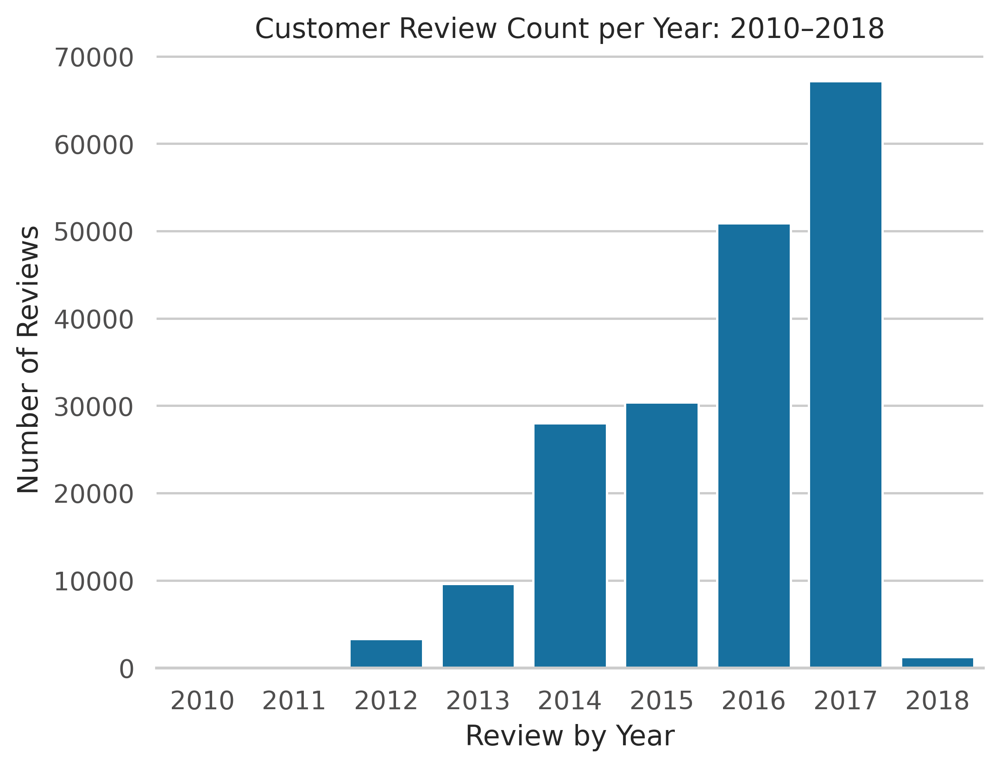

<Figure size 7680x5760 with 0 Axes>

In [ ]:
#EDA

#check the review_date period: from 2010-11-03 to 2018-01-08 with 192544 reviews
# we see there is an increasing number of reviews occuring... may not quite relate to Mahdikhani but we do we a surge
# could be due to the brand's popularity + social media or could be the rise use case of review interaction
#df_rr_new['review_date'].agg(['min', 'max'])
import matplotlib.pyplot as plt
import seaborn as sns
plt.rcParams['figure.dpi'] = 360
sns.set(style='whitegrid')
df_rr_new['review_date'].dt.year
sns.barplot(data=data_1,x="review_date",y="review_num",palette=['#0077b6'])
plt.xlabel('Review by Year',size=12)
plt.ylabel('Number of Reviews',size=12)
sns.despine(left=True)

plt.xticks(fontsize=11,color='#4f4e4e')
plt.yticks(fontsize=11,color='#4f4e4e')

plt.title("Customer Review Count per Year: 2010–2018")
plt.figure(dpi=1200)
plt.show()
#while there is dat up until 2018, it is not one whole year. So we might want to consider only 2012-2017 to account for seasonality
#which could be affecting fashion trends and demands -> need to do review paper on this

In [ ]:
data_2 = df_rr_new.groupby(df_rr_new['review_date'].dt.month).agg(review_num = ('unique_id','count'))
data_2 = data_2.reset_index()
data_2

,review_date,review_num
0,1,13110
1,2,11097
2,3,13430
3,4,16980
4,5,18753
5,6,18187
6,7,13291
7,8,14327
8,9,16066
9,10,20565


/tmp/ipython-input-2154742770.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=data_2,x="review_date",y="review_num",palette=['#005E7C'])
/tmp/ipython-input-2154742770.py:5: UserWarning: 
The palette list has fewer values (1) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=data_2,x="review_date",y="review_num",palette=['#005E7C'])


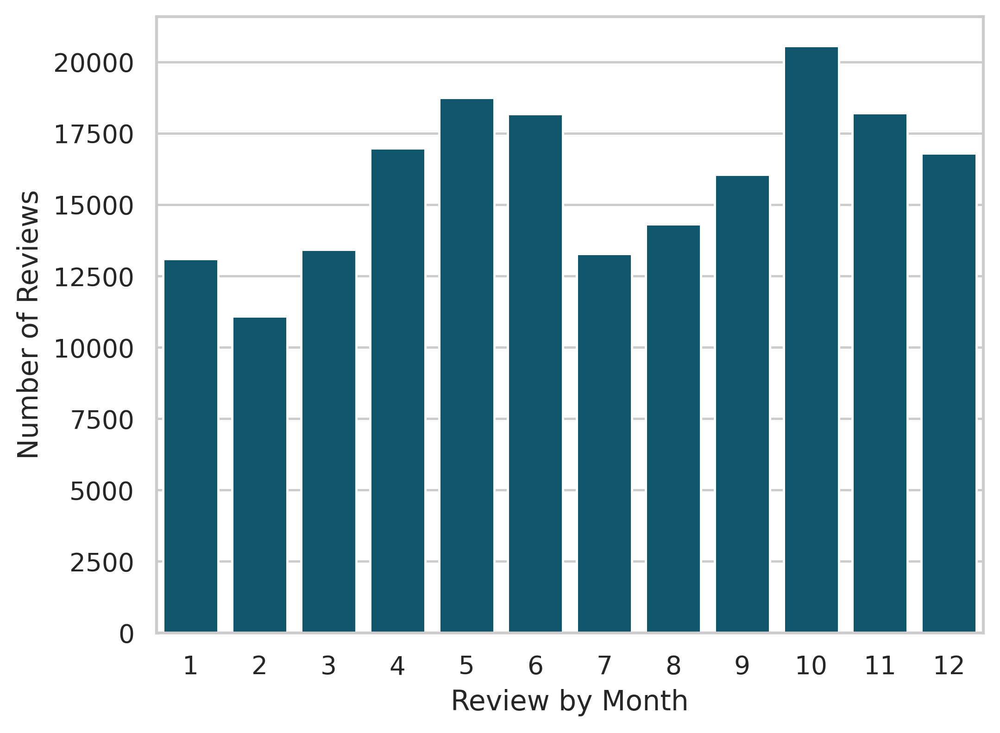

<Figure size 7680x5760 with 0 Axes>

In [ ]:
#review EDA
#TREND BY MONTH; check for monthly seasonality ; cyclical? peak near the summer months and winter
plt.rcParams['figure.dpi'] = 360
sns.set(style='whitegrid')
sns.barplot(data=data_2,x="review_date",y="review_num",palette=['#005E7C'])


df_rr_new['review_date'].dt.year
plt.xlabel('Review by Month')
plt.ylabel('Number of Reviews')
plt.figure(dpi=1200)

plt.show()

In [ ]:
data_3 = df_rr_new['rented for'].value_counts()

data_3 = data_3.reset_index()
data_3

,rented for,count
0,wedding,57260
1,formal affair,39972
2,party,35353
3,everyday,16679
4,other,15282
5,work,14897
6,date,7346
7,vacation,4035


/tmp/ipython-input-3643120468.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=data_3,x="rented for",y="count",palette=["#a53860","#a53860","#a53860",


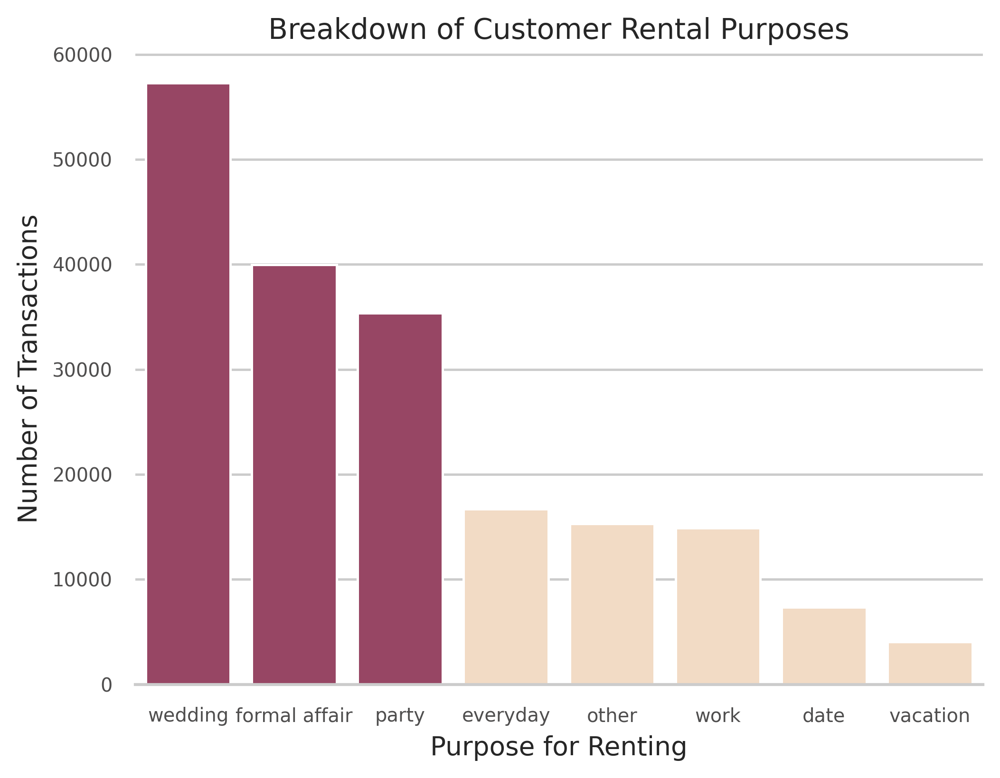

<Figure size 7680x5760 with 0 Axes>

In [ ]:
#EDA about the purpose of rent
#top purpose is wedding, formal affair, party -> everyday and others are still little which subscribes to our theory
# it's about self-expression
plt.rcParams['figure.dpi'] = 360
sns.set(style='whitegrid')
sns.barplot(data=data_3,x="rented for",y="count",palette=["#a53860","#a53860","#a53860",
                                                                              "#f9dbbd","#f9dbbd","#f9dbbd",
                                                                              "#f9dbbd","#f9dbbd"])

plt.xlabel('Purpose for Renting',size=11)
plt.ylabel('Number of Transactions',size=11)
sns.despine(left=True)

plt.xticks(fontsize=8,color='#4f4e4e')
plt.yticks(fontsize=8,color='#4f4e4e')

plt.title('Breakdown of Customer Rental Purposes')
plt.figure(dpi=1200)

plt.show()

In [ ]:
data_4 = df_rr_new.groupby(df_rr_new['review_date'].dt.year).agg(review_num = ('rating','mean'))

data_4 = data_4.reset_index()
data_4

,review_date,review_num
0,2010,10.000000
1,2011,9.263158
2,2012,9.005474
3,2013,8.912343
4,2014,8.973299
5,2015,9.070222
6,2016,9.155101
7,2017,9.132502
8,2018,9.200969


/tmp/ipython-input-3670944982.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=data_4, x="review_date", y="review_num", palette=["#006d77"])
/tmp/ipython-input-3670944982.py:4: UserWarning: 
The palette list has fewer values (1) than needed (9) and will cycle, which may produce an uninterpretable plot.
  ax = sns.barplot(data=data_4, x="review_date", y="review_num", palette=["#006d77"])


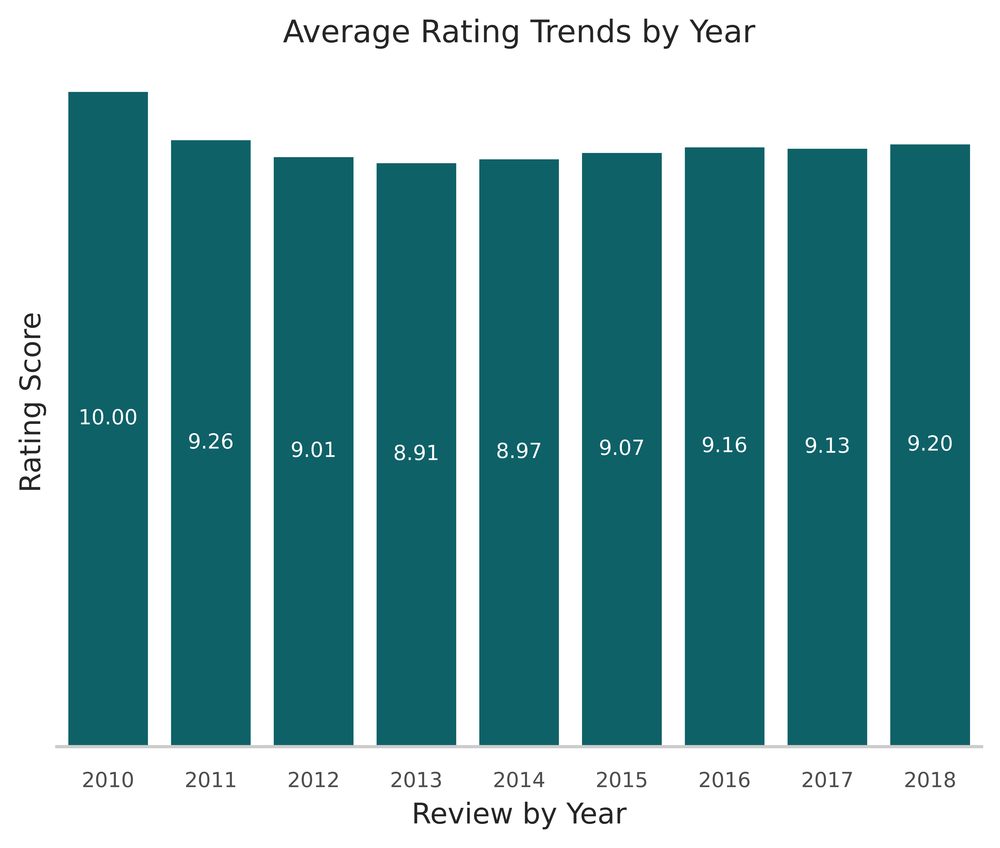

In [ ]:
plt.rcParams['figure.dpi'] = 1200
sns.set(style='whitegrid')

ax = sns.barplot(data=data_4, x="review_date", y="review_num", palette=["#006d77"])

# Annotate each bar with its value (2 decimal places) INSIDE the bar
for container in ax.containers:
    ax.bar_label(
        container,
        fmt='%.2f',              # format with 2 decimals
        label_type='center',     # place label inside the bar
        color="white",           # text color
        fontsize=8
    )

plt.xlabel('Review by Year', size=11)
plt.ylabel('Rating Score', size=11)
plt.title("Average Rating Trends by Year")

sns.despine(left=True)

plt.xticks(fontsize=8, color='#4f4e4e')
ax.set_yticks([])

plt.show()


In [ ]:
rating_avg = df_rr_new.groupby(df_rr_new['review_date'].dt.year).agg(review_num = ('rating','mean'))
rating_avg.mean()

,0
review_num,9.190341


In [ ]:
### excluding the year 2010 and 2018
year_to_inc = [2011,2012,2013,2014,2015,2016,2017]
rating_avg.loc[year_to_inc].mean()

,0
review_num,9.073157


In [ ]:
import seaborn as sns
fig,ax = plt.subplots(figsize=(12,5))
sns.boxplot(x=df_rr_new['review_date'].dt.year
               ,y=df_rr_new['rating']
               ,ax=ax)

<Axes: xlabel='review_date', ylabel='rating'>

In [ ]:
#proportion of reviews by year based on renting purposes
df_rr_new.groupby(df_rr_new['rented for']).agg(review_num = ('unique_id','count'))



,review_num
rented for,
date,7346
everyday,16679
formal affair,39972
other,15282
party,35353
vacation,4035
wedding,57260
work,14897


In [ ]:
df_rr_new['body type'].value_counts()

,count
body type,
hourglass,68949
athletic,43434
petite,22036
pear,21998
full bust,14893
straight & narrow,14666
apple,4848


In [ ]:
summary = df_rr_new.groupby([df_rr_new['review_date'].dt.year, df_rr_new['rented for']]).agg(review_num = ('unique_id','count')).sort_values(['review_date','review_num'],ascending=False)
summary

review_num
review_date rented for               
2018        party                 443
            wedding               247
            everyday              165
            formal affair         147
            other                  86
            work                   84
            vacation               34
            date                   33
2017        wedding             19072
            party               11044
            formal affair       10604
            everyday             9046
            work                 7964
            other                4753
            date                 2907
            vacation             1771
2016        wedding             13622
            party                9359
            formal affair        8095
            everyday             6403
            work                 6065
            other                3813
            date                 2276
            vacation             1263
2015        wedding             10352
            formal affair        7432
            party                6399
            other                2867
            everyday             1065
            date                 1050
            work                  784
            vacation              469
2014        wedding             10153
            formal affair        8456
            party                5511
            other                2756
            date                  806
            vacation              332
2013        formal affair        3759
            wedding              2942
            party                1836
            other                 774
            date                  201
            vacation              105
2012        formal affair        1400
            wedding               841
            party                 698
            other                 224
            date                   67
            vacation               58
2011        formal affair          79
            party                  63
            wedding                30
            other                   9
            date                    6
            vacation                3
2010        wedding                 1

In [ ]:
data_5 = df_rr_new['age']
data_5 = data_5.reset_index()
data_5

,index,age
0,0,28.0
1,1,36.0
2,2,116.0
3,3,34.0
4,4,27.0
...,...,...
190819,192539,42.0
190820,192540,29.0
190821,192541,31.0
190822,192542,31.0


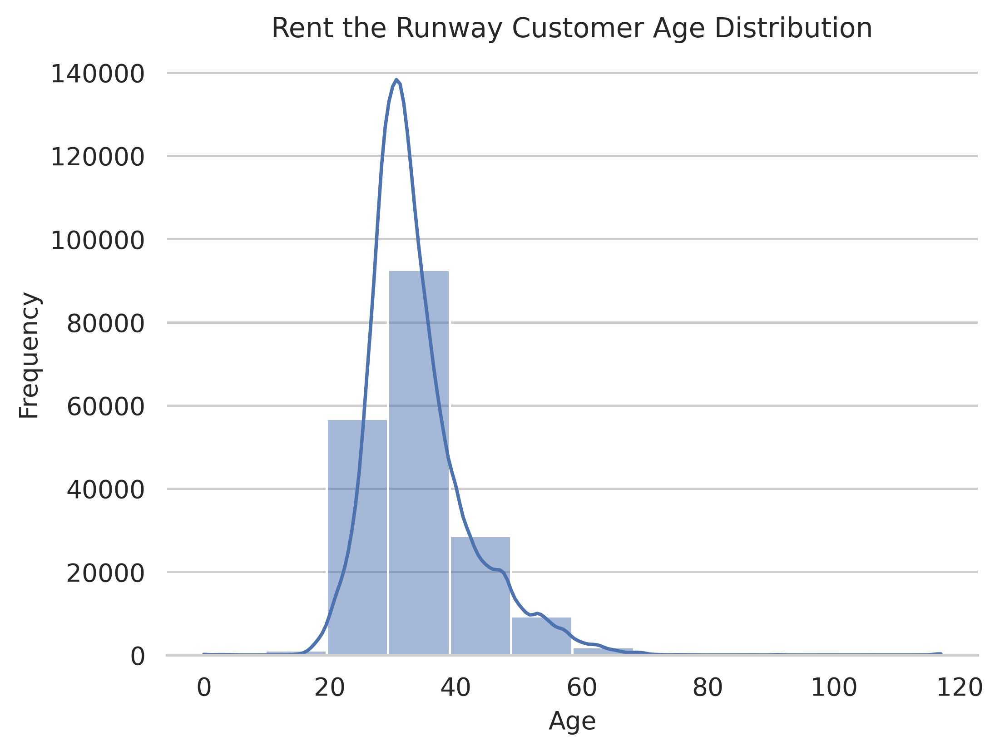

In [ ]:
#EDA for age, size and body type
plt.rcParams['figure.dpi'] = 360
sns.set(style='whitegrid')
ax = sns.histplot(data=data_5,x="age",kde=True,binwidth=10)
ax.xaxis.grid(False)
ax.yaxis.grid(True)

plt.title('Age Distribution')
plt.xlabel('Age',size=11)
plt.ylabel('Frequency',size=11)
sns.despine(left=True)

plt.title("Rent the Runway Customer Age Distribution")

plt.show()



In [ ]:
df_rr_new.groupby(df_rr_new['size']).agg(review_count=('unique_id','count'))

,review_count
size,
0,518
1,13599
2,724
3,699
4,29349
5,1727
6,9
7,663
8,40474


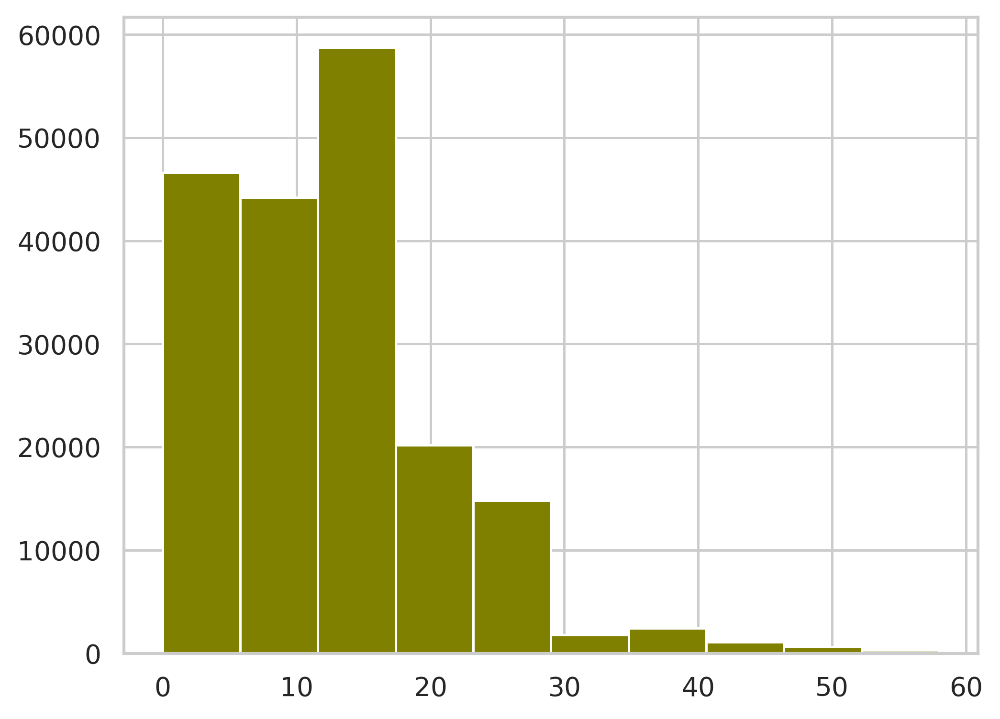

In [ ]:
#size: not sure what this is about
plt.hist(df_rr_new['size'],bins=10,color='olive')
plt.show()

In [ ]:
#fit
fit_counts = df_rr.groupby('fit').agg(review_count=('unique_id', 'count'))
fit_proportions = round(fit_counts / fit_counts.sum(),2)
fit_proportions

,review_count
fit,
fit,0.74
large,0.13
small,0.13


(array([4.1818e+04, 2.7859e+04, 2.4176e+04, 1.1306e+04, 2.0626e+04,
        1.6660e+04, 3.1007e+04, 7.0260e+03, 1.3980e+03, 2.1100e+02,
        3.6400e+02, 3.0920e+03, 3.9850e+03, 1.0270e+03, 1.2400e+02,
        3.1000e+01, 5.9000e+01, 1.9000e+01, 1.8000e+01, 1.8000e+01]),
 array([ 0.  ,  1.15,  2.3 ,  3.45,  4.6 ,  5.75,  6.9 ,  8.05,  9.2 ,
        10.35, 11.5 , 12.65, 13.8 , 14.95, 16.1 , 17.25, 18.4 , 19.55,
        20.7 , 21.85, 23.  ]),
 <BarContainer object of 20 artists>)

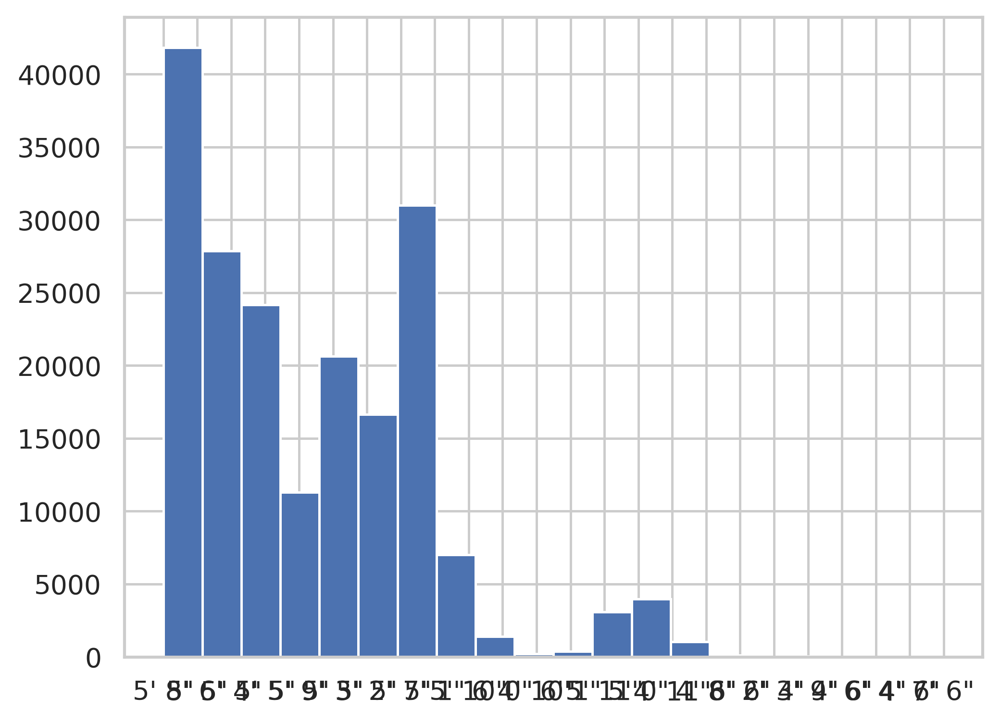

In [ ]:
#height distribution

plt.hist(df_rr_new['height'],bins=20)



In [ ]:
user_review_counts = df_rr_new.groupby('user_id')['unique_id'].count()

# Classify returning customers: 1 if count > 1, else 0
returning_cust = (user_review_counts > 1).astype(int)

# Optional: Rename the Series for clarity
returning_cust.name = 'is_returning_customer'
# Result: over the whole period
sum(returning_cust)/len(df_rr_new)
#filtering to only returning customers
returning_customer_list=list(returning_cust[returning_cust==1].index)
len(returning_customer_list)

33467

In [ ]:
non_returning_cust = (user_review_counts < 1).astype(int)
len(non_returning_cust)

104410

In [ ]:
(len(returning_customer_list)+len(non_returning_cust))

137877

In [ ]:
proportion_churn_alt = len(non_returning_cust) /(len(returning_customer_list)+len(non_returning_cust))
proportion_churn_alt

0.7572691601935058

In [ ]:
len(df_rr_new)

190824

In [ ]:
user_review_counts

,unique_id
user_id,
9,2
25,1
35,2
44,1
47,5
...,...
999969,3
999971,2
999987,2


## Setting the Churn-Rule

In [ ]:
# we need to identify active user or not! how often does a customer rent -> check this first and then compare
# against the churncutoff period
#assume review_date = transaction date

#find each user's last review date
# check if user's last transaction - user's second last transaction

user_trx = df_rr_new[['user_id','review_date']].sort_values(['user_id','review_date'])
user_trx = user_trx.loc[user_trx['user_id'].isin(returning_customer_list)]


In [ ]:
#only returning customers for building CCP modelling

item_counts = df_rr_new.groupby(['user_id', 'review_date'])['item_id'].count().rename('item_count')
user_trx = user_trx.merge(item_counts, on=['user_id', 'review_date'])
user_trx['last_review_date'] = user_trx.groupby(['user_id'])['review_date'].shift()
user_trx['retention_time'] = (user_trx['review_date']-user_trx['last_review_date'])/np.timedelta64(1,'D')
user_trx['retention_time']=user_trx['retention_time'].fillna(0)


churn_threshold = 90





In [ ]:
#92.2 days
user_trx['retention_time'].describe()

,retention_time
count,119881.000000
mean,92.400931
std,207.971187
min,0.000000
25%,0.000000
50%,0.000000
75%,71.000000
max,2129.000000


In [ ]:
#need to create the date starting and stopping point  2012-2017 (since it's a full year)

#on average retention is around 58 days; high standard deviation (to be expected given that
#most purpose for renting is for special occasions)
user_trx = user_trx[(user_trx['review_date'] >= "2012-01-01") & (user_trx['review_date'] <= "2017-12-31")]

user_trx[user_trx['user_id']==47]


,user_id,review_date,item_count,last_review_date,retention_time
4,47,2013-05-22,1,NaT,0.0
5,47,2013-12-04,1,2013-05-22,196.0
6,47,2014-04-29,1,2013-12-04,146.0
7,47,2014-08-12,1,2014-04-29,105.0
8,47,2016-06-25,1,2014-08-12,683.0


In [ ]:
user_trx = user_trx.sort_values(['user_id', 'review_date'])
user_trx['next_review_date'] = user_trx.groupby('user_id')['review_date'].shift(-1)

# Step 2: Use cutoff date to determine if user is inactive
cutoff_date = pd.to_datetime("2017-12-31")
churn_threshold = 90

# Step 3: Time until next transaction or end of data
user_trx['days_to_next_review'] = (user_trx['next_review_date'] - user_trx['review_date']) / np.timedelta64(1, 'D')
user_trx['days_to_end'] = (cutoff_date - user_trx['review_date']) / np.timedelta64(1, 'D')

#only for last record per user
user_trx['churn_result'] = ((user_trx['next_review_date'].isna()) & (user_trx['days_to_end'] > churn_threshold)).astype(int)


In [ ]:
user_trx[user_trx['user_id']==47]

,user_id,review_date,item_count,last_review_date,retention_time,next_review_date,days_to_next_review,days_to_end,churn_result
4,47,2013-05-22,1,NaT,0.0,2013-12-04,196.0,1684.0,0
5,47,2013-12-04,1,2013-05-22,196.0,2014-04-29,146.0,1488.0,0
6,47,2014-04-29,1,2013-12-04,146.0,2014-08-12,105.0,1342.0,0
7,47,2014-08-12,1,2014-04-29,105.0,2016-06-25,683.0,1237.0,0
8,47,2016-06-25,1,2014-08-12,683.0,NaT,NaN,554.0,1


In [ ]:
user_trx['churn_result'].value_counts()
churn_percent = user_trx['churn_result'].value_counts(normalize=True) * 100
print(churn_percent)

churn_result
0    77.390398
1    22.609602
Name: proportion, dtype: float64


In [ ]:
user_latest_status = user_trx.loc[user_trx.groupby("user_id")["review_date"].idxmax()]
user_latest_status['churn_result'].value_counts(normalize=True)

,proportion
churn_result,
1,0.572652
0,0.427348


In [ ]:
user_latest_status[user_latest_status['user_id']==47]

,user_id,review_date,item_count,last_review_date,retention_time,next_review_date,days_to_next_review,days_to_end,churn_result
8,47,2016-06-25,1,2014-08-12,683.0,NaT,NaN,554.0,1


In [ ]:
user_trx['user_id']

,user_id
0,9
1,9
2,35
3,35
4,47
...,...
119876,999971
119877,999987
119878,999987
119879,999997


In [ ]:
user_latest_status.sort_values('user_id')

,user_id,review_date,item_count,last_review_date,retention_time,next_review_date,days_to_next_review,days_to_end,churn_result
1,9,2015-03-23,1,2014-11-25,118.0,NaT,NaN,1014.0,1
3,35,2017-11-09,1,2017-05-12,181.0,NaT,NaN,52.0,0
8,47,2016-06-25,1,2014-08-12,683.0,NaT,NaN,554.0,1
10,207,2014-04-05,1,2014-04-01,4.0,NaT,NaN,1366.0,1
12,224,2017-12-18,1,2016-05-02,595.0,NaT,NaN,13.0,0
...,...,...,...,...,...,...,...,...,...
119871,999954,2017-04-24,1,2016-04-06,383.0,NaT,NaN,251.0,1
119873,999969,2017-03-11,1,2017-01-14,56.0,NaT,NaN,295.0,1
119875,999971,2017-09-19,2,NaT,0.0,2017-09-19,0.0,103.0,0
119878,999987,2015-04-16,1,2014-10-09,189.0,NaT,NaN,990.0,1


In [ ]:
user_latest_status.nunique()
#each row is unique

,0
user_id,33385
review_date,1793
item_count,21
last_review_date,2043
retention_time,1529
next_review_date,1514
days_to_next_review,1
days_to_end,1793
churn_result,2


In [ ]:
#do an inner join based on user_id, review_date to double check
#bring in retention_time, last_review_date, and most important churn_result into df_rr_encoded
df_rr_merged = pd.merge(
            left = df_rr_new
            ,right = user_latest_status[['user_id','retention_time','last_review_date','churn_result']]
            ,how='inner'
            ,left_on=['user_id']
            ,right_on=['user_id'])

#checking if merge was correct
df_rr_merged[df_rr_merged['user_id']==9][['user_id','review_date','rating','last_review_date','review_text','churn_result']].sort_values('review_date')

,user_id,review_date,rating,last_review_date,review_text,churn_result
39674,9,2014-11-25,10.0,2014-11-25,I originally ordered another dress that came d...,1
108916,9,2015-03-23,10.0,2014-11-25,This dress is lovely! The color is vibrant an...,1


In [ ]:
print(len(df_rr_merged))
print(len(user_latest_status))
print(len(user_trx))

119679
33385
118976


In [ ]:
df_rr_merged['churn_result'].value_counts(normalize=True)

,proportion
churn_result,
0,0.515312
1,0.484688


### Install Text Libraries

Sources:
- https://medium.com/@pawan329/text-data-preprocessing-made-easy-steps-to-clean-text-data-using-python-81a138a0e0e3
- https://medium.com/@fasasum/a-practical-guide-to-frequency-encoding-and-its-impact-on-machine-learning-ddf5ef800d9c

In [ ]:
#!pip install --user nltk
#!pip install gensim
#!pip install -U gensim
!pip install pyLDAvis

  Using cached pyLDAvis-3.4.1-py3-none-any.whl.metadata (4.2 kB)
Using cached pyLDAvis-3.4.1-py3-none-any.whl (2.6 MB)


# Import Libraries related for Text Preprocessing and Topic Modelling

In [ ]:
df_rr_merged.columns

Index(['fit', 'user_id', 'bust size', 'item_id', 'weight(lbs)', 'rating',
       'rented for', 'review_text', 'body type', 'review_summary', 'category',
       'height', 'size', 'age', 'review_date', 'unique_id', 'bust_measurement',
       'bra_cup', 'bust_ms_new', 'height(ft)', 'height(inch)',
       'retention_time', 'last_review_date', 'churn_result'],
      dtype='object')

In [ ]:
df_rr_merged['review_length'] = df_rr_merged['review_text'].apply(
    lambda row: min(len(row.split(" ")), len(row)) if isinstance(row, str) else None
)

In [ ]:
df_rr_merged[['review_text','review_length']].head()

,review_text,review_length
0,An adorable romper! Belt and zipper were a lit...,39
1,I have always been petite in my upper body and...,112
2,This dress is so sweet. I loved the print. The...,31
3,The dress was very flattering and fit perfectl...,139
4,The S was snug but in a good way. I wore a pus...,55


In [ ]:
df_rr_merged['review_length'].describe()

,review_length
count,119679.000000
mean,58.490637
std,41.379467
min,1.000000
25%,29.000000
50%,50.000000
75%,78.000000
max,401.000000


In [ ]:
#data viz library
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import numpy as np
import re
import string

#nltk library
import nltk
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
import itertools
from collections import Counter
nltk.download('punkt')
#usin the brown corpus-contains 1 million English wordw
#stopwords: words with no meaning
nltk.download('brown')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('punkt_tab')
#gensim library
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel, LdaModel
from gensim.corpora import Dictionary
from gensim.matutils import corpus2csc
from sklearn.feature_extraction.text import CountVectorizer

#spacy
import spacy

#visualisation data
import pyLDAvis
import warnings
# warnings.filterwarnings("ignore",category=DepreciationWarning) # Corrected typo

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package brown to /root/nltk_data...
[nltk_data]   Unzipping corpora/brown.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


# Data Cleaning for Textual Data

### Pre-Processing Essential Steps

In [ ]:
#load and preprocess the text data
# removing uppercase and special characters
#22 minutes for preprocessing
#removing uppercase characters
df_rr_merged['review_text_lower'] = df_rr_merged['review_text'].str.lower()
nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])

def preprocess_text(text):
    #removing special characters and digits using regular expressions
    text = re.sub(r'\d+','',text) #removing digits
    text = re.sub(r'[^\w\s]','',text) #removing punctuation
    return text


#removing unncessary words
def remove_stopwords(text):
    stop_words = set(stopwords.words('english'))
    tokens = nltk.word_tokenize(text)
    filtered_tokens = [word for word in tokens if word not in stop_words]
    return ' '.join(filtered_tokens)


#allowed_postags: filter words that are either noun, adjectives, verb, or adverbs
#need to do justification on stemming versus lemmatisation
#will do lemmatisation -> more context dependent because women's fashion reviews are highly subjective
def lemmatize_text(text,allowed_postags=['NOUN','ADJ','VERB','ADV']):
    doc = nlp(text)
    #iterate each word in the doc object and to create if condition if token is in the allowed postags. we put it in a list in the lemma form
    lemmatized = []
    for token in doc:
      if token.pos_ in allowed_postags:
        lemmatized.append(token.lemma_)
    return lemmatized

def clean_text(text):
    text = preprocess_text(text)
    text = remove_stopwords(text)
    tokens = lemmatize_text(text)
    return tokens

df_rr_merged['review_tokens']=df_rr_merged['review_text_lower'].apply(clean_text)
df_rr_merged.head()

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replac

,fit,user_id,bust size,item_id,weight(lbs),rating,rented for,review_text,body type,review_summary,...,bra_cup,bust_ms_new,height(ft),height(inch),retention_time,last_review_date,churn_result,review_length,review_text_lower,review_tokens
0,fit,420272,34d,2260466,137.0,10.0,vacation,An adorable romper! Belt and zipper were a lit...,hourglass,So many compliments!,...,d,34d,5,8,62.0,2016-06-15,1,39,an adorable romper! belt and zipper were a lit...,"[adorable, romper, belt, zipper, little, hard,..."
1,fit,151944,34b,616682,145.0,10.0,wedding,I have always been petite in my upper body and...,athletic,Was in love with this dress !!!,...,b,34b,5,9,40.0,2017-10-08,0,112,i have always been petite in my upper body and...,"[always, petite, upper, body, extremely, athle..."
2,fit,336066,34c,568429,112.0,10.0,everyday,This dress is so sweet. I loved the print. The...,hourglass,LITERALLY THE CUTEST DRESS EVER,...,c,34c,5,3,1.0,2017-12-11,0,31,this dress is so sweet. i loved the print. the...,"[dress, sweet, love, print, fit, loose, tie, w..."
3,fit,154309,32b,1729232,114.0,10.0,formal affair,The dress was very flattering and fit perfectl...,petite,This dress was everything! It was perfect for ...,...,b,32b,5,3,23.0,2017-05-25,1,139,the dress was very flattering and fit perfectl...,"[dress, flattering, fit, perfectly, stomach, h..."
4,fit,87660,36a,1295171,120.0,10.0,party,The S was snug but in a good way. I wore a pus...,straight & narrow,This dress made me feel so confident & sexy!,...,a,36a,5,6,150.0,2017-04-10,1,55,the s was snug but in a good way. i wore a pus...,"[snug, good, way, wear, push, bra, dress, make..."


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [ ]:
# After you created the 'review_tokens' column
df_rr_merged = df_rr_merged[df_rr_merged['review_tokens'].apply(lambda x: len(x) > 0)]

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

In [ ]:
# Show rows where original review_text is still missing
df_rr_merged['review_text'].value_counts(dropna=False).head(10)


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

,count
review_text,
True to size,22
True to size.,15
Fits true to size,15
true to size,13
Fit true to size,12
Great fit!,10
Fit true to size.,10
True to size.,10
fits true to size,8


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


### Testing the Cleaned Textual Data

In [ ]:
#filtering only the textual data
df_rr_merged['review_tokens']

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

,review_tokens
0,"[adorable, romper, belt, zipper, little, hard,..."
1,"[always, petite, upper, body, extremely, athle..."
2,"[dress, sweet, love, print, fit, loose, tie, w..."
3,"[dress, flattering, fit, perfectly, stomach, h..."
4,"[snug, good, way, wear, push, bra, dress, make..."
...,...
119674,"[material, thick, high, quality, fit, glove, c..."
119675,"[wear, dress, rehearsal, dinner, comfortable, ..."
119676,"[fit, glove]"
119677,"[pattern, contrast, dress, really, stunning, u..."


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [ ]:
data_words = df_rr_merged['review_tokens'].tolist()
id2word = corpora.Dictionary(data_words)
corpus = [ ]
for text in data_words:
    new = id2word.doc2bow(text, allow_update=True)
    corpus.append(new)

#represents the index of the word, with the frequency of the word
print(corpus[0][0:20])

#grabbing the first tuple from the previous print value
first_token_id = corpus[0][0][0]  # get the token ID from first tuple
word = id2word[first_token_id]
print(word)

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1), (10, 1), (11, 1), (12, 1), (13, 1), (14, 1), (15, 1), (16, 1), (17, 1), (18, 1)]
absolutely


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

#Save Preprocessed Text Data as a File

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

#save the entire dataframe
import os
folder_path = "/content/drive/MyDrive/Dissertation Project/"
df_path = os.path.join(folder_path,"preprocessed_df_rr.csv")
df_rr_merged.to_csv(df_path,index=False)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Reload Cleaned Data

In [ ]:
from google.colab import drive
import pandas as pd
drive.mount('/content/drive')
clean_df=pd.read_csv('/content/drive/MyDrive/Dissertation Project/preprocessed_df_rr.csv')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
clean_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119524 entries, 0 to 119523
Data columns (total 27 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   fit                119524 non-null  object 
 1   user_id            119524 non-null  int64  
 2   bust size          109590 non-null  object 
 3   item_id            119524 non-null  int64  
 4   weight(lbs)        119524 non-null  float64
 5   rating             119524 non-null  float64
 6   rented for         119524 non-null  object 
 7   review_text        119522 non-null  object 
 8   body type          119524 non-null  object 
 9   review_summary     119340 non-null  object 
 10  category           119524 non-null  object 
 11  height             119524 non-null  object 
 12  size               119524 non-null  int64  
 13  age                119524 non-null  float64
 14  review_date        119524 non-null  object 
 15  unique_id          119524 non-null  int64  
 16  bu

In [ ]:
clean_df[clean_df['review_text'].isna()]['review_tokens'].head()

,review_tokens
39129,['none']
50255,['none']


In [ ]:
import ast
# Convert stringified lists back into actual lists
clean_df['review_tokens'] = clean_df['review_tokens'].apply(ast.literal_eval)
data_words =clean_df['review_tokens'].tolist()

In [ ]:
id2word = corpora.Dictionary(data_words)

corpus = [ ]
for text in data_words:
    new = id2word.doc2bow(text, allow_update=True)
    corpus.append(new)

#represents the index of the word, with the frequency of the word
print(corpus[0][0:20])

#grabbing the first tuple from the previous print value
first_token_id = corpus[0][0][0]  # get the token ID from first tuple
word = id2word[first_token_id]
print(word)

[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1), (10, 1), (11, 1), (12, 1), (13, 1), (14, 1), (15, 1), (16, 1), (17, 1), (18, 1)]
absolutely


In [ ]:
clean_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119524 entries, 0 to 119523
Data columns (total 27 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   fit                119524 non-null  object 
 1   user_id            119524 non-null  int64  
 2   bust size          109590 non-null  object 
 3   item_id            119524 non-null  int64  
 4   weight(lbs)        119524 non-null  float64
 5   rating             119524 non-null  float64
 6   rented for         119524 non-null  object 
 7   review_text        119522 non-null  object 
 8   body type          119524 non-null  object 
 9   review_summary     119340 non-null  object 
 10  category           119524 non-null  object 
 11  height             119524 non-null  object 
 12  size               119524 non-null  int64  
 13  age                119524 non-null  float64
 14  review_date        119524 non-null  object 
 15  unique_id          119524 non-null  int64  
 16  bu

### WordCloud Common Words

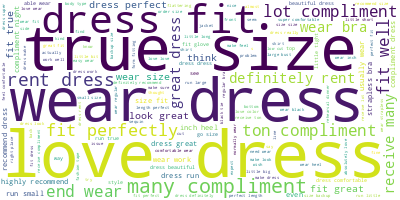

In [ ]:
#wordcloud after cleaning the data
clean_df['review_tokens_joined'] = clean_df['review_tokens'].apply(lambda x: ' '.join(x))
long_string = ' '.join(clean_df['review_tokens_joined'])

from wordcloud import WordCloud

wordcloud = WordCloud(
    background_color='white',
    max_words=3000,
    contour_width=3,
    contour_color='steelblue'
)

wordcloud.generate(long_string)
wordcloud.to_image()


# Topic Modelling Approach LDA

Sources:
- https://towardsdatascience.com/end-to-end-topic-modeling-in-python-latent-dirichlet-allocation-lda-35ce4ed6b3e0/
- https://www.analyticsvidhya.com/blog/2021/07/topic-modelling-with-lda-a-hands-on-introduction/
- https://nauman-shahid.medium.com/a-step-by-step-guide-to-writing-an-lda-program-in-python-690aa99119ea

- https://www.python-engineer.com/courses/mlfromscratch/14-lda/

In [ ]:
#creating the basic LDA topic model:
#will take 50 minutes to load
lda_model_1 = gensim.models.ldamodel.LdaModel(
    corpus=corpus
    ,id2word=id2word
    ,num_topics=10
    ,random_state=100 #every time we run it, it will return the same ouput
    ,update_every=1 #updating the topic model after every iteration
    ,chunksize=3000 #number of documents used for each trainign chunk (since the data set is approx. 190,000 )
    ,passes=10 #number of iterations to pass through the whole data
    ,alpha='auto' #priori belief on document-topic distirbution
    ,eta='auto' #priori belief on topic-word distribution
)

In [ ]:
from gensim.models import CoherenceModel

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model_1, texts=data_words, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('Coherence Score: ', coherence_lda)

Coherence Score:  0.5820528088860989


In [ ]:
round(coherence_lda,4)

0.5821

In [ ]:
lda_model_1.log_perplexity(corpus)

-6.525446210195866

*italicized text*#trying larger chunksize up to 2000-3000 to improve training updates!

### Visualise output from LDA_Model_1

In [ ]:
#!pip install pyLDAvis
import pyLDAvis
import pyLDAvis.gensim_models  # Correct module
pyLDAvis.enable_notebook()

# Use the correct module here too:
vis = pyLDAvis.gensim_models.prepare(lda_model_1, corpus, id2word, mds='mmds', R=30)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0      0.280650  0.268399       1        1  32.604080
1      0.112149  0.336385       2        1  25.078920
4     -0.101756  0.083025       3        1  13.685104
8     -0.123899  0.428929       4        1  11.552413
6      0.121838 -0.422620       5        1   4.713942
3     -0.445906  0.174547       6        1   3.906700
2     -0.178308 -0.397663       7        1   2.426926
7     -0.428187 -0.202912       8        1   2.330049
5      0.275613 -0.213115       9        1   1.862979
9      0.487805 -0.054974      10        1   1.838888, topic_info=           Term           Freq          Total Category  logprob  loglift
47         size   52219.000000   52219.000000  Default  30.0000  30.0000
3    compliment   25852.000000   25852.000000  Default  29.0000  29.0000
7           get   28744.000000   28744.000000  Default  28.0000  28.0000
56        dress  160683.000000  160683.000000  Default  27.0000  27.0000
196        long   19640.000000   19640.000000  Default  26.0000  26.0000
..          ...            ...            ...      ...      ...      ...
816       theme     636.529391     775.125462  Topic10  -4.4504   3.7990
671        club     300.645639     356.603010  Topic10  -5.2005   3.8253
179      casual     763.849153    2786.406628  Topic10  -4.2681   2.7019
601    cocktail     503.952180    1280.221618  Topic10  -4.6840   3.0637
482      friend     486.001940    3320.318721  Topic10  -4.7203   2.0744

[521 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
69        1  0.186933        able
69        3  0.589946        able
69        4  0.142599        able
69        5  0.080463        able
0         2  0.958902  absolutely
...     ...       ...         ...
785       3  0.999582        year
294       3  0.951781         zip
294       4  0.047910         zip
18        1  0.002395      zipper
18        3  0.997548      zipper

[792 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 5, 9, 7, 4, 3, 8, 6, 10])

### Save 1st LDA model

In [ ]:
import os
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Define the folder path in Drive
folder_path = "/content/drive/MyDrive/Dissertation Project/"
os.makedirs(folder_path, exist_ok=True)  # Create the folder if it doesn't exist

# Save the LDA model to Drive
lda_model_1.save(os.path.join(folder_path, "model_LDA_1"))


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from gensim.models import LdaModel

model_path_1 = "/content/drive/MyDrive/Dissertation Project/model_LDA_1"
lda_model_1 = LdaModel.load(model_path_1)


In [ ]:
lda_model_1

In [ ]:
lda_model_1.print_topics()

[(0,
  '0.041*"wear" + 0.033*"little" + 0.032*"dress" + 0.030*"look" + 0.021*"bit" + 0.021*"well" + 0.021*"really" + 0.019*"make" + 0.019*"top" + 0.019*"fit"'),
 (1,
  '0.130*"dress" + 0.055*"wear" + 0.047*"love" + 0.043*"fit" + 0.041*"perfect" + 0.040*"comfortable" + 0.032*"great" + 0.028*"color" + 0.020*"definitely" + 0.019*"beautiful"'),
 (2,
  '0.096*"thick" + 0.066*"heavy" + 0.062*"summer" + 0.058*"material" + 0.047*"light" + 0.044*"warm" + 0.041*"day" + 0.034*"hot" + 0.027*"winter" + 0.026*"wrinkle"'),
 (3,
  '0.223*"compliment" + 0.170*"get" + 0.101*"receive" + 0.091*"many" + 0.087*"lot" + 0.046*"ton" + 0.029*"tape" + 0.018*"fashion" + 0.015*"night" + 0.009*"several"'),
 (4,
  '0.070*"dress" + 0.045*"rent" + 0.021*"get" + 0.020*"time" + 0.019*"want" + 0.015*"try" + 0.012*"ve" + 0.012*"go" + 0.011*"zipper" + 0.011*"day"'),
 (5,
  '0.059*"jacket" + 0.037*"shirt" + 0.037*"casual" + 0.036*"pant" + 0.034*"outfit" + 0.033*"jean" + 0.028*"pair" + 0.028*"sweater" + 0.026*"black" + 0.024

In [ ]:
'''
topic 1: dress fitting
topic 2: Good fit and comfortability
topic 3: material issues
topic 4: compliments on clothing
topic 5: shipping and delivery efficiency
topic 6: casual and workwear
topic 7: shoes
topic 8: body type
topic 9: size and fit issue
topic 9: Renting Occasions
'''

'\ntopic 1: complaints about tops (bust issues?)\ntopic 2: Accessories and Jewelery\ntopic 3: Positive feedback on clothing quality and style\ntopic 4: Positive feedback dress (fit, feel, comfortability) + PoW\ntopic 5: zipper and fastenersisues\ntopic 6: casual and outwear w\ntopic 6: measurements\ntopic 7: shipping and order experience\ntopic 8: Size issues/comments? (*especially on dresses)\ntopic 9: Renting Occasions\n'

# Topic Modelling Enhancement LDA + n-grams + TD-IDF removal (removing frequent words)

In [ ]:
#bigrams and trigrams

#threshold: controls the number of phrases
#min_count: the minimum frequency in order for it to be considered
bigram_phrases = gensim.models.Phrases(data_words,min_count=5,threshold=50)
trigram_phrases = gensim.models.Phrases(bigram_phrases[data_words],threshold=50)
bigram = gensim.models.phrases.Phraser(bigram_phrases)
trigram = gensim.models.phrases.Phraser(trigram_phrases)



def make_bigrams(texts):
    return [bigram[doc] for doc in texts]

def make_trigrams(texts):
    return [trigram[bigram[doc]] for doc in texts]


data_bigrams = make_bigrams(data_words)
data_bigrams_trigrams = make_trigrams(data_bigrams)

print(data_bigrams_trigrams[0][0:20])


['adorable', 'romper', 'belt', 'zipper', 'little', 'hard', 'navigate', 'full', 'day', 'wearbathroom', 'use', 's', 'expect', 'wish', 'pocket', 'absolutely', 'perfect', 'get', 'compliment']


Cleaning and filter a text corpus by removing low-information words using TF-IDF na dprepare the data for LDA topic modelling

In [ ]:
#TF-IDF filtering

from gensim.models import TfidfModel
texts = data_bigrams_trigrams
id2word = corpora.Dictionary(data_bigrams_trigrams)
corpus = [id2word.doc2bow(text) for text in texts]
print(corpus[0][0:20])
tfidf = TfidfModel(corpus,id2word=id2word,smartirs='ntc') #for normalised calculation of TF-IDF


filtered_corpus = []
filtered_texts = []
low_value = 0.03
words = []

for i in range(len(corpus)):
    bow = corpus[i]
    tfidf_bow = tfidf[bow]

    tfidf_ids = [id for id, _ in tfidf_bow]
    bow_ids = [id for id, _ in bow]

    low_value_words = [id for id, value in tfidf_bow if value < low_value]
    words_missing_in_tfidf = [id for id in bow_ids if id not in tfidf_ids]

    drops = low_value_words + words_missing_in_tfidf

    for item in drops:
        words.append(id2word[item])  # optional: for reporting dropped words

    # Filter the bow
    new_bow = [b for b in bow if b[0] not in drops]

    # Keep only non-empty documents
    if len(new_bow) > 0:
        filtered_corpus.append(new_bow)
        filtered_texts.append(data_bigrams_trigrams[i])

[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1), (10, 1), (11, 1), (12, 1), (13, 1), (14, 1), (15, 1), (16, 1), (17, 1), (18, 1)]


Result of the ouput
- (0,1) word with ID 0 appears once
- (7,3) word with ID 7 appears 3 times

In [ ]:
#will take about an hour
lda_model_2 = gensim.models.ldamodel.LdaModel(
    corpus=filtered_corpus
    ,id2word=id2word
    ,num_topics=10
    ,random_state=100 #every time we run it, it will return the same ouput
    ,update_every=1 #updating the topic model after every iteration
    ,chunksize=3000 #number of documents used for each training chunk
    ,passes=10 #number of iterations to pass through the whole data
    ,alpha='auto' #priori belief on document-topic distirbution
    ,eta='auto' #priori belief on topic-word distribution
)

In [ ]:
# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model_2, texts=data_bigrams_trigrams, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('Coherence Score: ', coherence_lda)

Coherence Score:  0.6189746170170524


In [ ]:
round(coherence_lda,4)

0.619

In [ ]:
lda_model_2.log_perplexity(corpus)

-6.5686260157511045

In [ ]:
import pyLDAvis
import pyLDAvis.gensim_models

In [ ]:
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_model_2, corpus, id2word, mds='mmds', R=30)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4      0.317255  0.282026       1        1  52.090833
9      0.115896  0.362162       2        1  17.818566
5     -0.072742 -0.051078       3        1   8.187910
7     -0.143421  0.421743       4        1   5.885367
0      0.097445 -0.424211       5        1   3.822061
1     -0.393104  0.212405       6        1   3.373960
3     -0.220340 -0.401929       7        1   2.834435
6     -0.442433 -0.126914       8        1   2.704712
8      0.365832 -0.276929       9        1   1.752977
2      0.375612  0.002725      10        1   1.529177, topic_info=           Term           Freq          Total Category  logprob  loglift
47         size   52133.000000   52133.000000  Default  30.0000  30.0000
56        dress  137778.000000  137778.000000  Default  29.0000  29.0000
88         look   30694.000000   30694.000000  Default  28.0000  28.0000
70          bra   18441.000000   18441.000000  Default  27.0000  27.0000
9        little   32467.000000   32467.000000  Default  26.0000  26.0000
...         ...            ...            ...      ...      ...      ...
1259  body_type     242.181190    1567.129902  Topic10  -5.2114   2.3131
66        waist     309.369818   11833.260213  Topic10  -4.9666   0.5363
6          full     243.905417    2601.053198  Topic10  -5.2043   1.8135
559        knee     221.497746    4421.110192  Topic10  -5.3007   1.1867
155     earring     207.824955    1202.467348  Topic10  -5.3644   2.4250

[508 rows x 6 columns], token_table=      Topic      Freq    Term
term                         
68        1  0.685697    able
68        2  0.007862    able
68        3  0.165613    able
68        5  0.019826    able
68        8  0.121005    able
...     ...       ...     ...
841       7  0.998775    year
629       9  0.995870   young
291       3  0.160113     zip
291       5  0.839573     zip
18        5  0.999712  zipper

[791 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 10, 6, 8, 1, 2, 4, 7, 9, 3])

In [ ]:
import os
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Define the folder path in Drive
folder_path = "/content/drive/MyDrive/Dissertation Project/"
os.makedirs(folder_path, exist_ok=True)  # Create the folder if it doesn't exist

# Save the LDA model to Drive
lda_model_2.save(os.path.join(folder_path, "model_LDA_2"))


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from gensim.models import LdaModel

model_path_2 = "/content/drive/MyDrive/Dissertation Project/model_LDA_2"
lda_model_2 = LdaModel.load(model_path_2)


In [ ]:
lda_model_2

In [ ]:
lda_model_2.print_topics()

[(0,
  '0.121*"heel" + 0.062*"long" + 0.051*"inch" + 0.041*"zipper" + 0.036*"use" + 0.035*"r" + 0.032*"flat" + 0.029*"l" + 0.028*"help" + 0.022*"zip"'),
 (1,
  '0.078*"cute" + 0.078*"day" + 0.046*"pair" + 0.033*"work" + 0.030*"warm" + 0.030*"jacket" + 0.029*"casual" + 0.025*"piece" + 0.022*"shirt" + 0.021*"pant"'),
 (2,
  '0.247*"true" + 0.090*"size" + 0.025*"pair" + 0.025*"stretch" + 0.024*"style" + 0.023*"recommend" + 0.020*"standard" + 0.018*"cup" + 0.017*"room" + 0.016*"natural"'),
 (3,
  '0.055*"first" + 0.050*"dinner" + 0.032*"send" + 0.027*"rtr" + 0.026*"time" + 0.025*"choice" + 0.024*"birthday" + 0.018*"arrive" + 0.018*"pick" + 0.016*"second"'),
 (4,
  '0.091*"dress" + 0.055*"wear" + 0.036*"fit" + 0.026*"love" + 0.023*"great" + 0.021*"perfect" + 0.020*"comfortable" + 0.020*"rent" + 0.019*"get" + 0.018*"compliment"'),
 (5,
  '0.202*"size" + 0.079*"small" + 0.061*"run" + 0.060*"large" + 0.056*"order" + 0.036*"go" + 0.033*"big" + 0.029*"usually" + 0.024*"try" + 0.021*"backup"'),
 

In [ ]:
'''
topic 1: heel and zipper issue)
topic 2: positive feedback on casual pieces + practicality (i,e, warm)
topic 3: positive feedback on delivery and versatile choices
topic 4: positive feedback on dresses
topic 5: size issues
topic 6: bra issues (bust showing off too much)
topic 7: outfit appearance
topic 8: positive feedback on garments complementing bodies (hiding flaws)
topic 9: waist fit too tight and length
'''

'\ntopic 1: heel and zipper issue)\ntopic 2: positive feedback on casual pieces + practicality (i,e, warm)\ntopic 3: positive feedback on delivery and versatile choices\ntopic 4: positive feedback on dresses\ntopic 5: size issues\ntopic 6: bra issues (bust showing off too much)\ntopic 7: outfit appearance\ntopic 8: positive feedback on garments complementing bodies (hiding flaws)\ntopic 9: waist fit too tight and length\n'

# LDA Hyperparameter Tuning

Sources:
- https://towardsdatascience.com/evaluate-topic-model-in-python-latent-dirichlet-allocation-lda-7d57484bb5d0/

- https://medium.com/@hammad.ai/using-grid-search-for-hyper-parameter-tuning-bad6756324cc

- https://www.machinelearningplus.com/nlp/topic-modeling-python-sklearn-examples/

- https://www.kaggle.com/code/trnduythanhkhttt/lda-and-topic-coherence-score

Text Excerpt:

- LDA Hyperparameters
The most important parameters are the Bayesian prior hyperparameters alpha and beta (called ‘eta’ in Gensim). Both hyperparameters represent our prior beliefs about the corpus before we train our model. A high alpha generally makes the combination of topics associated with each document more uniform across documents; that is, the documents become more similar to each other regarding their topics. A high beta generally makes each topic contain a more uniform mix of words.

- In Gensim, both alpha and beta can be set to ‘symmetric’, ‘asymmetric’, or ‘auto’. The default for both is a symmetric distribution of 1 divided by the number of topics. For ‘auto’, the model automatically learns the best values for the hyperparameters as it is trained on more and more data. The trade-off is that ‘auto’ takes longer to compute than ‘symmetric’ or ‘asymmetric
https://afairless.com/the-peanuts-project/topic-modeling/parameter-testing/


**Findings:**
- Previous GridSearch: 2 topics was the best. Retrying again with more options

- For ‘auto’ the model tries to learn the “best values” for the
hyperparameters as it is training on more and more data, but it does
take longer to compute. We also found that the auto option sometimes seemed to overfit

In [ ]:
#model hyperparameters: number of topics, alpha, beta
#using the topic coherence graph where we achieve the highest CV to select the best number of topics


#select the best optimal alpha and beta parameters -> choose the best maximum value based on coherence
#for selecting best alpha and beta

# Safe re-creation of text_data from tokenized reviews
text_data = [" ".join(tokens) for tokens in clean_df['review_tokens']]
print(type(text_data[0]))  # should be <class 'str'>


NameError: name 'clean_df' is not defined

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

vectorizer = CountVectorizer(max_features=5000, min_df=5)
dtm = vectorizer.fit_transform(text_data)


In [ ]:
num_topics_list = [2,4,6,8,10,12]
coherence_ldas = []

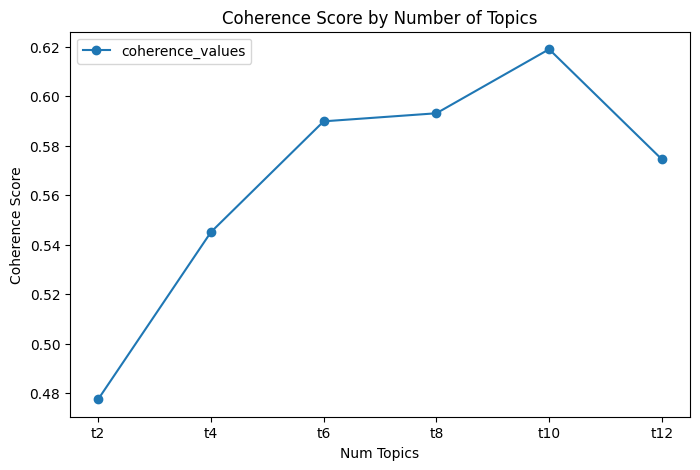

In [ ]:
# Loop through different numbers of topics
# 31 minutes
for num_topics in num_topics_list:
    lda_model = LdaModel(
        corpus=filtered_corpus,
        id2word=id2word,
        num_topics=num_topics,
        random_state=100,
        update_every=1,
        chunksize=3000,
        passes=10,
        alpha='auto',
        eta='auto'
    )

    coherence_model_lda = CoherenceModel(
        model=lda_model,
        texts=data_bigrams_trigrams,
        dictionary=id2word,
        coherence='c_v'
    )
    coherence_ldas.append(coherence_model_lda.get_coherence())

# Now plot
plt.figure(figsize=(8,5))
plt.plot(["t{}".format(i) for i in num_topics_list], coherence_ldas, marker='o')
plt.xlabel("Num Topics")
plt.ylabel("Coherence Score")
plt.legend(["coherence_values"], loc='best')
plt.title("Coherence Score by Number of Topics")
plt.show()


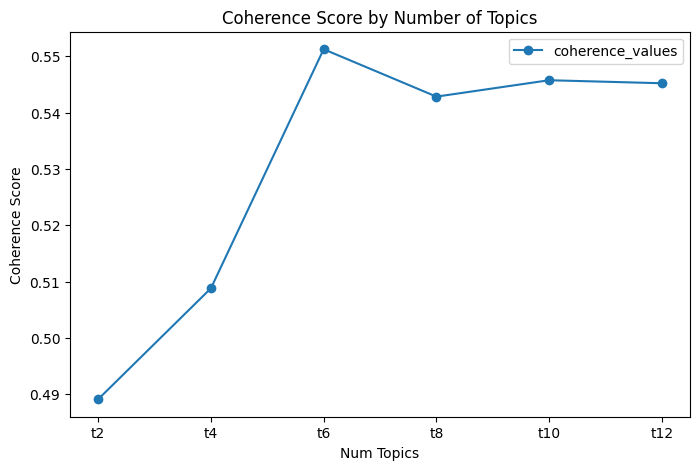

In [ ]:
num_topics_list_new = [2,4,6,8,10,12]
coherence_ldas_new = []

# Loop through different numbers of topics
# not set alpha and eta to auto due to negative priors
# setting both alpha and eta to be 'symmetric'
for num_topics in num_topics_list_new:
    lda_model = LdaModel(
        corpus=filtered_corpus,
        id2word=id2word,
        num_topics=num_topics,
        random_state=100,
        update_every=1,
        chunksize=3000,
        passes=10,
        alpha = 'symmetric',
        eta = 'symmetric'
    )

    coherence_model_lda = CoherenceModel(
        model=lda_model,
        texts=data_bigrams_trigrams,
        dictionary=id2word,
        coherence='c_v'
    )
    coherence_ldas_new.append(coherence_model_lda.get_coherence())

# Now plot
plt.figure(figsize=(8,5))
plt.plot(["t{}".format(i) for i in num_topics_list_new], coherence_ldas_new, marker='o')
plt.xlabel("Num Topics")
plt.ylabel("Coherence Score")
plt.legend(["coherence_values"], loc='best')
plt.title("Coherence Score by Number of Topics")
plt.show()

In [ ]:
import numpy as np
# Find index of highest coherence
best_idx = np.argmax(coherence_ldas_new)
best_num_topics = num_topics_list_new[best_idx]
best_coherence = coherence_ldas_new[best_idx]

print(f"Best number of topics: {best_num_topics}") #with beta and eta to be symmetric!

Best number of topics: 6
Highest coherence score: 0.5513


Text Excerpt on the limitation of Coherence Score:

The coherence score for C_v ranges from 0 to 1 where the higher the value, the better coherence it has. The C_umass method returns negative values. The tricky part here is that there is no clear consensus or interpretation of what value constitutes a "good coherence". There has been some attempts from scholars such as John McLevey who argued any score above 0.5 for the C_v method is reasonably good. If you peek into some forums for data science, however, there are some varying opinions. This post from Stackoverflow suggests the following rubric.
0.3 is bad
0.4 is low
0.55 is okay
0.65 might be as good as it is going to get
0.7 is nice
0.8 is unlikely and
0.9 is probably wrong


Source:
https://towardsdatascience.com/let-us-extract-some-topics-from-text-data-part-i-latent-dirichlet-allocation-lda-e335ee3e5fa4/

### LDA operates on the following principles:

- Document-Topic Distribution: Each document is represented as a distribution over topics. This means that a document can belong to multiple topics, each with a certain probability.
- Topic-Word Distribution: Each topic is represented as a distribution over words. This implies that a topic is defined by a set of words, each associated with a probability of appearing in that topic.
Generative Process: LDA uses a generative process to create documents. This involves:
- Choosing a distribution of topics for each document.
For each word in the document, selecting a topic based on the topic distribution.
Generating the word from the selected topic's word distribution.


Source:
- https://www.geeksforgeeks.org/nlp/topic-modeling-using-latent-dirichlet-allocation-lda/
- https://www.machinelearningplus.com/nlp/topic-modeling-visualization-how-to-present-results-lda-models/
- https://www.machinelearningplus.com/nlp/topic-modeling-gensim-python/


### Best LDA model after Grid Search (Dissertation paper: LDA_model_3)

In [ ]:
#testing with alpha and eta to be auto; see if can reach higher coherence score
#5 minutes loading
lda_model_6 = gensim.models.ldamodel.LdaModel(
    corpus=filtered_corpus
    ,id2word=id2word
    ,num_topics=6
    ,random_state=100 #every time we run it, it will return the same ouput
    ,update_every=1 #updating the topic model after every iteration
    ,chunksize=3000 #number of documents used for each training chunk
    ,passes=10 #number of iterations to pass through the whole data
    ,alpha='auto' #priori belief on document-topic distirbution
    ,eta='auto' #priori belief on topic-word distribution
)

In [ ]:
# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model_6, texts=data_bigrams_trigrams, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('Coherence Score: ', coherence_lda)

Coherence Score:  0.5898322603757905


In [ ]:
lda_model_6.log_perplexity(corpus)

-6.389616513412957

In [ ]:
lda_model_6.print_topics(num_topics=-1)

[(0,
  '0.065*"long" + 0.062*"bra" + 0.045*"heel" + 0.040*"back" + 0.034*"need" + 0.021*"length" + 0.019*"keep" + 0.019*"inch" + 0.018*"show" + 0.017*"low"'),
 (1,
  '0.072*"cute" + 0.043*"pair" + 0.028*"day" + 0.028*"warm" + 0.028*"jacket" + 0.027*"casual" + 0.023*"piece" + 0.022*"work" + 0.022*"black" + 0.020*"shirt"'),
 (2,
  '0.076*"size" + 0.027*"small" + 0.026*"top" + 0.025*"tight" + 0.025*"little" + 0.022*"bit" + 0.022*"m" + 0.022*"run" + 0.021*"fit" + 0.021*"large"'),
 (3,
  '0.063*"time" + 0.043*"first" + 0.025*"send" + 0.025*"try" + 0.021*"rtr" + 0.018*"next" + 0.014*"arrive" + 0.014*"pick" + 0.014*"choice" + 0.013*"second"'),
 (4,
  '0.081*"dress" + 0.048*"wear" + 0.026*"fit" + 0.023*"love" + 0.021*"great" + 0.019*"perfect" + 0.018*"comfortable" + 0.018*"rent" + 0.017*"get" + 0.016*"compliment"'),
 (5,
  '0.103*"zipper" + 0.066*"zip" + 0.055*"gown" + 0.034*"difficult" + 0.013*"head" + 0.012*"tough" + 0.011*"help" + 0.010*"break" + 0.008*"hard" + 0.007*"impossible"')]

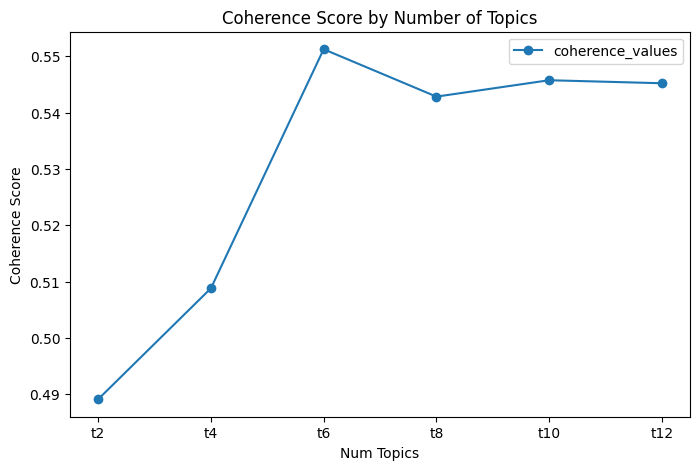

In [ ]:
num_topics_list_new_2 = [6,8,10,12]
coherence_ldas_new_2 = []

# Loop through different numbers of topics
# not set alpha and eta to auto due to negative priors
# setting both alpha and eta to be 'symmetric'
for num_topics in num_topics_list_new_2:
    lda_model = LdaModel(
        corpus=filtered_corpus,
        id2word=id2word,
        num_topics=num_topics,
        random_state=100,
        update_every=1,
        chunksize=3000,
        passes=10,
        alpha = 'auto',
        eta = 'auto'
    )

    coherence_model_lda = CoherenceModel(
        model=lda_model,
        texts=data_bigrams_trigrams,
        dictionary=id2word,
        coherence='c_v'
    )
    coherence_ldas_new_2.append(coherence_model_lda.get_coherence())


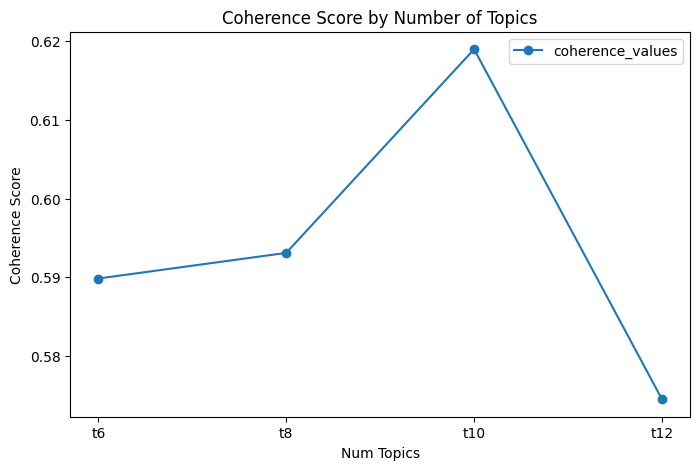

In [ ]:
# Now plot
plt.figure(figsize=(8,5))
plt.plot(["t{}".format(i) for i in num_topics_list_new_2], coherence_ldas_new_2, marker='o')
plt.xlabel("Num Topics")
plt.ylabel("Coherence Score")
plt.legend(["coherence_values"], loc='best')
plt.title("Coherence Score by Number of Topics")
plt.show()

In [ ]:
import numpy as np
# Find index of highest coherence
best_idx = np.argmax(coherence_ldas_new_2)
best_num_topics = num_topics_list_new_2[best_idx]
best_coherence = coherence_ldas_new_2[best_idx]

print(f"Best number of topics: {best_num_topics}") #with beta and eta to be auto!
print(f"Best Coherence Score:{best_coherence}")

Best number of topics: 10
Best Coherence Score:0.6189746170170524


In [ ]:
import pyLDAvis.gensim_models as gensimvis

pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_model_6, corpus, id2word, mds='mmds', R=10)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4     -0.076131  0.013515       1        1  57.527946
2     -0.135004 -0.375220       2        1  23.656280
0     -0.432118 -0.010825       3        1  10.117109
1     -0.071714  0.443302       4        1   3.628420
3      0.322959 -0.272862       5        1   3.542438
5      0.392007  0.202090       6        1   1.527807, topic_info=                Term           Freq          Total Category  logprob  loglift
47              size   51887.000000   51887.000000  Default  10.0000  10.0000
56             dress  135525.000000  135525.000000  Default   9.0000   9.0000
195             long   19390.000000   19390.000000  Default   8.0000   8.0000
70               bra   18281.000000   18281.000000  Default   7.0000   7.0000
144             work   22267.000000   22267.000000  Default   6.0000   6.0000
...              ...            ...            ...      ...      ...      ...
1790      impossible     310.443455     311.279875   Topic6  -4.9622   4.1786
1734           basic     302.860203     303.697993   Topic6  -4.9869   4.1786
2228  reading_review     272.085507     272.924365   Topic6  -5.0941   4.1783
190             help     499.565782    3615.347801   Topic6  -4.4865   2.2021
8               hard     352.918819    2551.070276   Topic6  -4.8340   2.2033

[102 rows x 6 columns], token_table=      Topic      Freq    Term
term                         
234       2  0.999914    area
808       5  0.999758  arrive
22        1  0.103539    back
22        2  0.005203    back
22        3  0.891129    back
...     ...       ...     ...
144       1  0.824156    work
144       2  0.072347    work
144       4  0.103469    work
291       6  0.999547     zip
18        6  0.999912  zipper

[158 rows x 3 columns], R=10, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 3, 1, 2, 4, 6])

Sources about learning decay (additional parameter to add):

- https://nkoenig06.github.io/gd-tm-lda.html, learning decay set at 0.5, 0.7, 0.
- https://medium.com/data-science/practical-guide-to-topic-modeling-with-lda-05cd6b027bdf

Explanation:

determines how much the step size shrinks with each iteration. A lower value of learning_decay makes the step size shrink more slowly— the model can explore more modes in the multimodal objective function, but it converges more slowly. You MUST set 0.5 < learning_decay ≤ 1 for LDA to converge (this is true of any SGD algorithm, which must satisfy the Robbins-Monro condition). Interestingly, gensim’s default value is 0.5, which tricks clueless users into training a model that doesn’t converge. Empirically, a value in the 0.7–0.8 range yields the best results


# BERTopic

Sources:

- https://www.pinecone.io/learn/bertopic/
- https://maartengr.github.io/BERTopic/getting_started/tips_and_tricks/tips_and_tricks.
- https://stackoverflow.com/questions/76235208/evaluating-a-bertopic-model-based-on-classification-metrics
- https://towardsdatascience.com/a-practical-guide-to-bertopic-for-transformer-based-topic-modeling/

- https://umap-learn.readthedocs.io/en/latest/parameters.html

In [ ]:
df_rr_merged['review_text'].isnull().sum()

0

In [ ]:
df_rr_merged.info()

<class 'pandas.core.frame.DataFrame'>
Index: 119524 entries, 0 to 119678
Data columns (total 27 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   fit                119524 non-null  object        
 1   user_id            119524 non-null  int64         
 2   bust size          109590 non-null  object        
 3   item_id            119524 non-null  int64         
 4   weight(lbs)        119524 non-null  float64       
 5   rating             119524 non-null  float64       
 6   rented for         119524 non-null  object        
 7   review_text        119524 non-null  object        
 8   body type          119524 non-null  object        
 9   review_summary     119524 non-null  object        
 10  category           119524 non-null  object        
 11  height             119524 non-null  object        
 12  size               119524 non-null  int64         
 13  age                119524 non-null  float64      

In [ ]:
!pip install bertopic

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 153.0/153.0 kB 8.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 132.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 101.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 67.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 45.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 20.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.7/188.7 MB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 111.3 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlin

Basic Model of BERT

In [ ]:
from bertopic import BERTopic
from sklearn.feature_extraction.text import CountVectorizer
from sentence_transformers import SentenceTransformer

/usr/local/lib/python3.11/dist-packages/hdbscan/plots.py:448: DeprecationWarning: invalid escape sequence '\l'
  axis.set_ylabel('$\lambda$ value')
/usr/local/lib/python3.11/dist-packages/hdbscan/robust_single_linkage_.py:154: DeprecationWarning: invalid escape sequence '\{'
  """Perform robust single linkage clustering from a vector array


In [ ]:
#4 hours to run in CPU mode

from bertopic import BERTopic
from sklearn.feature_extraction.text import CountVectorizer
from sentence_transformers import SentenceTransformer

#removing stopwrods
embedding_model = SentenceTransformer("all-MiniLM-L6-v2", device='cuda')
vectorizer_model = CountVectorizer(ngram_range=(1,2),stop_words="english")
model_4 = BERTopic(vectorizer_model=vectorizer_model
                   ,embedding_model = embedding_model
                   ,language='english',calculate_probabilities=True,verbose=True)


topics, probs = model_4.fit_transform(df_rr_merged['review_text'])

2025-07-28 22:32:49,060 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/3740 [00:00<?, ?it/s]

2025-07-28 22:33:31,678 - BERTopic - Embedding - Completed ✓
2025-07-28 22:33:31,679 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-07-28 22:34:35,889 - BERTopic - Dimensionality - Completed ✓
2025-07-28 22:34:35,892 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-07-28 23:41:14,497 - BERTopic - Cluster - Completed ✓
2025-07-28 23:41:14,526 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-07-28 23:41:24,697 - BERTopic - Representation - Completed ✓


In [ ]:
model_4.save("bertopic_model")
from bertopic import BERTopic
model_4 = BERTopic.load("bertopic_model")

import pandas as pd
import numpy as np

# Save topics
np.save("topics.npy", topics)

# Save probabilities
np.save("probs.npy", probs)

# Or save together with your original text for analysis
results_df = clean_df.copy()
results_df["topic"] = topics
results_df["probability"] = [max(p) if p is not None else None for p in probs]

# Save as CSV for inspection
results_df.to_csv("bertopic_results.csv", index=False)


2025-07-15 07:01:38,126 - BERTopic - WARNING: When you use `pickle` to save/load a BERTopic model,please make sure that the environments in which you saveand load the model are **exactly** the same. The version of BERTopic,its dependencies, and python need to remain the same.


In [ ]:
#-1 represents the outlier; need to check this out
model_4.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,56975,-1_dress_size_fit_wore,"[dress, size, fit, wore, length, perfect, grea...",[This is an AMAZING dress. I wore it for a fo...
1,0,2890,0_bra_wear bra_strapless_strapless bra,"[bra, wear bra, strapless, strapless bra, regu...","[The back is very open, so you can't wear a re..."
2,1,1930,1_jeans_pants_cute_tops,"[jeans, pants, cute, tops, white, skinny, work...",[Great everyday wear top that runs true to siz...
3,2,1921,2_usually_typically_size_size fit,"[usually, typically, size, size fit, usually w...",[i love this dress. i'm typically btwn 2 and ...
4,3,1620,3_rtr_experience_rtr dress_favorite rtr,"[rtr, experience, rtr dress, favorite rtr, fav...",[My original RTR dress did not work out. Cust...
...,...,...,...,...,...
536,535,10,535_fabric lace_naturally_renttherunway dress_...,"[fabric lace, naturally, renttherunway dress, ...",[It was a gorgeous dress right down to the lin...
537,536,10,536_fine rainy_rainy coldish_coldish_coldish n...,"[fine rainy, rainy coldish, coldish, coldish n...",[Not too short- was able to wear spanx without...
538,537,10,537_sizing backup_support addition_size unbeli...,"[sizing backup, support addition, size unbelie...",[This is a great work style and is perfect for...
539,538,10,538_black waistband_zipper_difficult use_zipped,"[black waistband, zipper, difficult use, zippe...","[This dress was form-fitting, but thick enough..."


In [ ]:
model_4.visualize_hierarchy()

In [ ]:
model_4.visualize_barchart()

In [ ]:
model_4.visualize_heatmap()


### fine tuning process based on pinecone code

1. transformer embedding
2. dimensionality reduction
3. HBDSCAN clustering
4. Topic extraction with c-TF-IDF
5. Applying it back to bert topic

In [ ]:
=from bertopic import BERTopic
from sentence_transformers import SentenceTransformer


/usr/local/lib/python3.11/dist-packages/hdbscan/plots.py:448: DeprecationWarning: invalid escape sequence '\l'
  axis.set_ylabel('$\lambda$ value')
/usr/local/lib/python3.11/dist-packages/hdbscan/robust_single_linkage_.py:154: DeprecationWarning: invalid escape sequence '\{'
  """Perform robust single linkage clustering from a vector array


In [ ]:
#best and most popular embedding method; will create 384-dimensional sentence embeddings


model_5 = SentenceTransformer('all-MiniLM-L6-v2')
model_5

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

SentenceTransformer(
  (0): Transformer({'max_seq_length': 256, 'do_lower_case': False}) with Transformer model: BertModel 
  (1): Pooling({'word_embedding_dimension': 384, 'pooling_mode_cls_token': False, 'pooling_mode_mean_tokens': True, 'pooling_mode_max_tokens': False, 'pooling_mode_mean_sqrt_len_tokens': False, 'pooling_mode_weightedmean_tokens': False, 'pooling_mode_lasttoken': False, 'include_prompt': True})
  (2): Normalize()
)

will take 2-3hours approximately to finish

In [ ]:
import numpy as np
from tqdm.auto import tqdm
batch_size = 16
n = len(df_rr_merged['review_text'])

embeds = np.zeros((n,model_5.get_sentence_embedding_dimension()))

#encoded the text in batches of 16
for i in tqdm(range(0,n,batch_size)):
    i_end = min(i+batch_size,n)
    batch = list(df_rr_merged['review_text'][i:i_end])
    batch_embeddings = model_5.encode(batch)
    embeds[i:i_end] = batch_embeddings

  0%|          | 0/7471 [00:00<?, ?it/s]

In [ ]:
from google.colab import drive
import os
import numpy as np

# Mount Google Drive
drive.mount('/content/drive')

# Define folder and path
folder_path = "/content/drive/MyDrive/Dissertation Project/"
np_path = os.path.join(folder_path, "embeds_new.npy")

# Save the embeddings
np.save(np_path, embeds)

# Optional: confirm it's saved
print(f"Saved to: {np_path}")


### using the embeds_new

In [ ]:
import os
# Define the path where you saved the file
folder_path = "/content/drive/MyDrive/Dissertation Project/"
np_path = os.path.join(folder_path, "embeds_new.npy")

# Load the embeddings
embeds = np.load(np_path)

# Optional: check the shape
print("Embeds shape:", embeds.shape)

Embeds shape: (119524, 384)


In [ ]:
len(df_rr_merged)

119524

In [ ]:
!pipinstall umap-Learn
import umap

/bin/bash: line 1: pipinstall: command not found


In [ ]:
#compressing the 384 dimension to 2-3 dimensions using UMAP (combination of PCA and t-SNE)
#higher min_dist means more general structures discovered # might want to explore this more
import umap

fit = umap.UMAP(n_components = 2,min_dist=0.5,metric='cosine',random_state=100) #may need to test this n_components around  3-5, min_dist helps to separate familar topics -> but also need to see the visual
U = fit.fit_transform(embeds) #find the k nearest neighbor (controlled by the n_neighbors parameter) -> preserving distances to the kth nearest point when shifting to lower dimension
#increasing n_neighbors can preserve more global structures, whereas a lower n_neighbors better preserves local structures.



In [ ]:
U.shape

(119524, 3)

In [ ]:
df_rr_merged.columns

Index(['fit', 'user_id', 'bust size', 'item_id', 'weight(lbs)', 'rating',
       'rented for', 'review_text', 'body type', 'review_summary', 'category',
       'height', 'size', 'age', 'review_date', 'unique_id', 'bust_measurement',
       'bra_cup', 'bust_ms_new', 'height(ft)', 'height(inch)',
       'retention_time', 'last_review_date', 'churn_result',
       'review_text_lower', 'review_tokens'],
      dtype='object')

need to put this in the EDA section!!!

In [ ]:
selected_col = df_rr_merged[['fit' ,'bust size', 'weight(lbs)', 'rating','rented for', 'body type', 'category',  'size', 'age', 'bust_measurement',  'bra_cup',  'height(ft)',
       'churn_result']]

selected_col.head()

,fit,bust size,weight(lbs),rating,rented for,body type,category,size,age,bust_measurement,bra_cup,height(ft),churn_result
0,fit,34d,137.0,10.0,vacation,hourglass,romper,14,28.0,34,d,5,1
1,fit,34b,145.0,10.0,wedding,athletic,gown,12,27.0,34,b,5,0
2,fit,34c,112.0,10.0,everyday,hourglass,dress,4,27.0,34,c,5,0
3,fit,32b,114.0,10.0,formal affair,petite,gown,1,33.0,32,b,5,1
4,fit,36a,120.0,10.0,party,straight & narrow,sheath,8,26.0,36,a,5,1


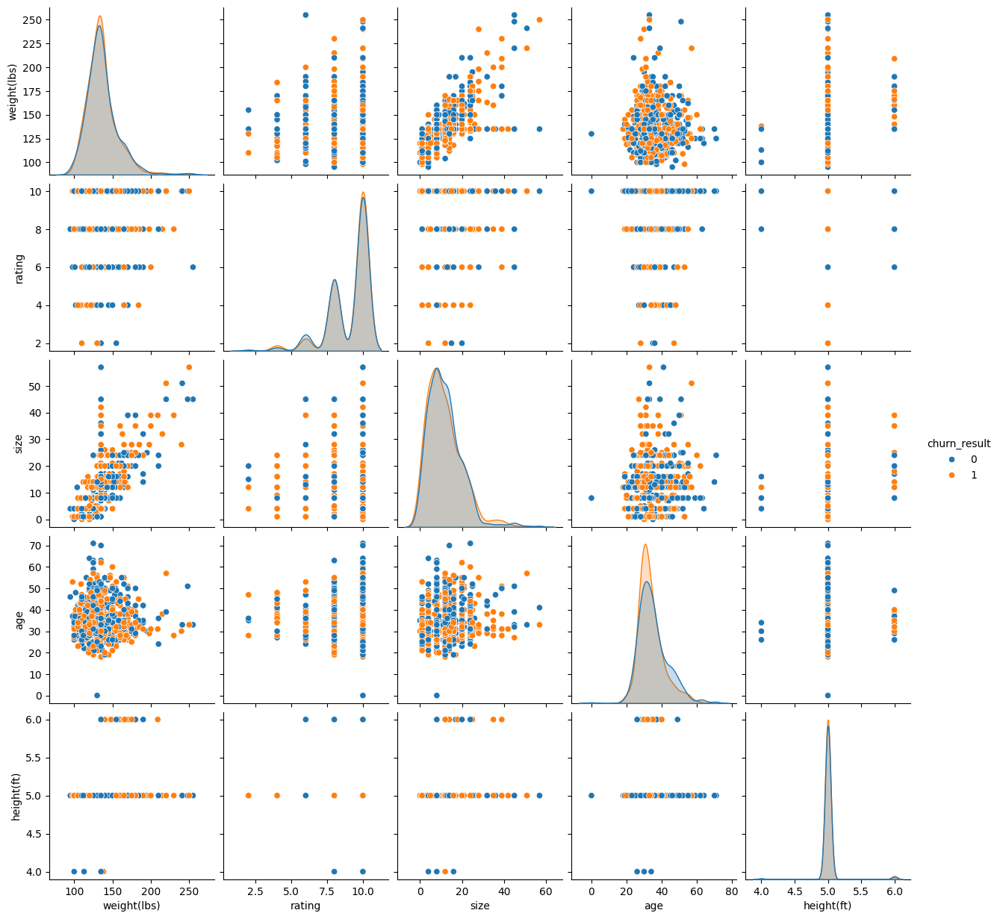

In [ ]:
import seaborn as sns

sns.pairplot(selected_col.sample(1000, random_state=100),hue='churn_result')


[Text(0.5, 1.0, 'Churn Result')]

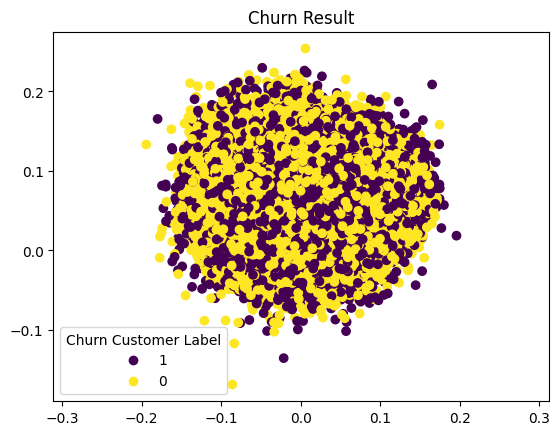

In [ ]:
levels, categories = pd.factorize(df_rr_merged['churn_result'])
scatter = plt.scatter(
    embeds[:, 0],
    embeds[:, 1],c=levels)
plt.gca().set_aspect('equal', 'datalim')

plt.legend(scatter.legend_elements()[0], categories, title='Churn Customer Label')
plt.gca().set( title='Churn Result')


<Axes: ylabel='$\\lambda$ value'>

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.11/dist-packages/matplotlib/transforms.py:2059: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  self._mtx[1, 2] *= sy
/usr/local/lib/python3.11/dist-packages/matplotlib/transforms.py:2057: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  self._mtx[1, 0] *= sy
/usr/local/lib/python3.11/dist-packages/matplotlib/transforms.py:2058: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  self._mtx[1, 1] *= sy
/

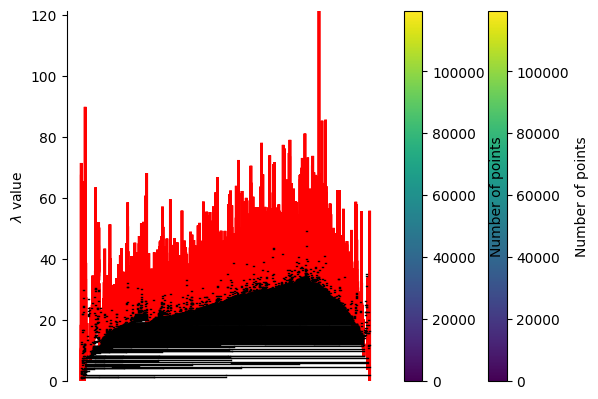

In [ ]:
#HBDSCAN clustering to cluster to low-dimensional vectors
import hdbscan
clusterer = hdbscan.HDBSCAN()
clusterer.fit(U)
clusterer.condensed_tree_.plot(select_clusters=True)

#hdbscan chooses the final clusters based on their size and persistence over varying lambda values. The tree's thickets most persistent branches are the most stable and therefore best
#candidates for clsuters


#testing by balancing the min_samples and min_samples
clusterer = hdbscan.HDBSCAN(
    min_cluster_size=100, min_samples=45)
clusterer.fit(U)

clusterer.condensed_tree_.plot(select_clusters=True)

this takes 1 hour to load

In [ ]:
from tqdm import tqdm

# Add the cluster labels to our dataset
df_rr_merged["class"] = clusterer.labels_

# Create dictionary of tokens per cluster
classes = {label: {'tokens': []} for label in set(clusterer.labels_)}
for _, row in df_rr_merged.iterrows():
    classes[row['class']]['tokens'].extend(row['review_tokens'])  # uses existing tokens

# Build vocabulary
all_tokens = [token for tokens in df_rr_merged["review_tokens"] for token in tokens]
vocab = list(set(all_tokens))

# Compute TF matrix
tf = np.zeros((len(classes.keys()), len(vocab)))
for c, _class in enumerate(classes.keys()):
    for t, term in enumerate(tqdm(vocab)):
        tf[c, t] = classes[_class]['tokens'].count(term)


100%|██████████| 27524/27524 [00:00<00:00, 247850.97it/s]


In [ ]:
import os
import numpy as np
import json

folder_path = "/content/drive/MyDrive/Dissertation Project/"
os.makedirs(folder_path, exist_ok=True)

# 1. Save DataFrame as CSV
df_path = os.path.join(folder_path, "df_rr_merged_with_clusters.csv")
df_rr_merged.to_csv(df_path, index=False)

# 2. Save vocab as JSON
vocab_path = os.path.join(folder_path, "vocab.json")
with open(vocab_path, "w") as f:
    json.dump(vocab, f)

# 3. Save tf matrix as numpy
tf_path = os.path.join(folder_path, "tf_matrix.npy")
np.save(tf_path, tf)

# 4. Save classes tokens (keys converted to str)
classes_simple = {str(k): v['tokens'] for k, v in classes.items()}
classes_path = os.path.join(folder_path, "classes_tokens.json")
with open(classes_path, "w") as f:
    json.dump(classes_simple, f)

print("✅ All files saved to Google Drive!")


✅ All files saved to Google Drive!


In [ ]:
import pandas as pd
import numpy as np
import json
import os

folder_path = "/content/drive/MyDrive/Dissertation Project/"

# 1. Load CSV file (DataFrame)
df_path = os.path.join(folder_path, "df_rr_merged_with_clusters.csv")
df_rr_merged_loaded = pd.read_csv(df_path)

# 2. Load vocab JSON
vocab_path = os.path.join(folder_path, "vocab.json")
with open(vocab_path, "r") as f:
    vocab_loaded = json.load(f)

# 3. Load numpy matrix
tf_path = os.path.join(folder_path, "tf_matrix.npy")
tf_loaded = np.load(tf_path, allow_pickle=True)

# 4. Load classes tokens JSON
classes_path = os.path.join(folder_path, "classes_tokens.json")
with open(classes_path, "r") as f:
    classes_simple_loaded = json.load(f)

print("✅ All files loaded successfully!")
print("DataFrame shape:", df_rr_merged_loaded.shape)
print("Vocab sample:", vocab_loaded[:5])
print("TF matrix shape:", tf_loaded.shape)
print("Classes tokens keys:", list(classes_simple_loaded.keys())[:5])


✅ All files loaded successfully!
DataFrame shape: (119524, 27)
Vocab sample: ['smoothing', 'neoprenetype', 'vocal', 'ackwardly', 'considerable']
TF matrix shape: (4, 27524)
Classes tokens keys: ['0', '1', '2', '-1']


In [ ]:
!pip install tqdm
from tqdm import tqdm


In [ ]:
topics = [words for key, words in classes_simple_loaded.items() if key != '-1']
def calculate_topic_diversity(topics):
    unique_words = set()
    total_words = 0
    for topic in topics:
        unique_words.update(topic)
        total_words += len(topic)
    return len(unique_words) / total_words

diversity = calculate_topic_diversity(topics)
print("Topic Diversity:", diversity)


Topic Diversity: 0.009282579750459003


Results show low topic diversity

testing the n= 10,15,20,25,30 (20-25 Similar)

## Manual BERTopic Tuning Trial 1

In [ ]:
idf = np.zeros((1, len(vocab_loaded)))

# calculate average number of words per class
A = tf_loaded.sum() / tf_loaded.shape[0]

for t, term in enumerate(tqdm(vocab_loaded)):
    # frequency of term t across all classes
    f_t = tf_loaded[:,t].sum()
    # calculate IDF
    idf_score = np.log(1 + (A / f_t))
    idf[0, t] = idf_score


tf_idf = tf_loaded*idf
#change n based on the best clustering num; top 20 words #preiouvsly was 10 words only
n = 50

top_idx = np.argpartition(tf_idf, -n)[:, -n:]
top_idx

100%|██████████| 27524/27524 [00:00<00:00, 64327.59it/s]


array([[21626, 24081, 19154,  6644,  7250,  4530,  1025,  8692,  6174,
         6967, 10400, 11417,  1142, 17220, 11721, 24050, 26974,  8679,
         9395, 25075, 27358,   244,  1875,  9036, 18225, 24083,  1859,
         7289, 24357,  6730, 27402, 15238, 27453, 26030, 27014, 19907,
        15231,  3864,  2622,  6930, 24472, 19681,  7825,  9884, 23239,
        22467, 20874,  9521,  9304, 10725],
       [26816,  8692,  1979, 14339,  1142,  9395, 22467,  1875, 14835,
        19746,  6930, 11417, 19907, 14654, 14113,   611, 27453, 12810,
        27175, 18207, 19965,  4697,  4777, 18225, 26474,  7289,  9677,
        19681, 23239, 24897, 27402,  8679, 20874,   244, 26030,  9036,
         7765, 10400,  5160, 24050,  6174, 24083,  2622,   984, 24357,
        10725, 19523, 15634,  8866, 24472],
       [21626, 10855,  6730, 11721, 17220,  1142, 11417, 18225, 24202,
         5160, 26816, 13732, 24050,  3864, 12810,  9304,  8679, 15634,
         4777,   984, 10725, 24472, 21688, 20874,  1875, 232

In [ ]:
vlist = list(vocab_loaded)

for c, _class in enumerate(classes_simple_loaded.keys()):
    topn_idx = top_idx[c, :]
    topn_terms = [vlist[idx] for idx in topn_idx]
    print(topn_terms)

['pretty', 'prepregnancy', 'give', 'perfectly', 'beautiful', 'friendly', 'need', 'fabric', 'bit', 'trimester', 'night', 'big', 'recommend', 'material', 'still', 'also', 'shower', 'really', 'go', 'pregnant', 'dress', 'love', 'fit', 'great', 'large', 'get', 'month', 'm', 'little', 'even', 'definitely', 'belly', 'feel', 'rent', 'week', 'look', 'pregnancy', 'order', 'perfect', 'make', 'size', 'compliment', 'baby', 'bump', 'well', 'wear', 'comfortable', 'maternity', 'wedding', 'work']
['true', 'fabric', 'easy', 'color', 'recommend', 'go', 'wear', 'fit', 'fun', 'romper', 'make', 'big', 'look', 'much', 'party', 'super', 'feel', 'waist', 'small', 'bathroom', 'long', 'short', 'top', 'large', 'cute', 'm', 'outfit', 'compliment', 'well', 'time', 'definitely', 'really', 'comfortable', 'love', 'rent', 'great', 'day', 'night', 'back', 'also', 'bit', 'get', 'perfect', 'length', 'little', 'work', 'bra', 'run', 'torso', 'size']
['pretty', 'flattering', 'even', 'still', 'material', 'recommend', 'big', '

In [ ]:
from sentence_transformers import SentenceTransformer
from umap import UMAP
from hdbscan import HDBSCAN

embedding_model = SentenceTransformer('all-MiniLM-L6-v2')
umap_model = UMAP(n_neighbors=15, n_components=2, min_dist=0.05) #hyperparameter tuning based on the previous codes
hdbscan_model = HDBSCAN(min_cluster_size=100, min_samples=50,
                        gen_min_span_tree=True,
                        prediction_data=True)

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from nltk.corpus import stopwords

stopwords = list(stopwords.words('english'))

# we add this to remove stopwords that can pollute topcs
vectorizer_model = CountVectorizer(ngram_range=(1, 2), stop_words=stopwords)

In [ ]:
from bertopic import BERTopic

model_5a = BERTopic(
    umap_model=umap_model,
    hdbscan_model=hdbscan_model,
    embedding_model=embedding_model,
    vectorizer_model=vectorizer_model,
    top_n_words=10,
    language='english',
    calculate_probabilities=True,
    verbose=True
)
topics, probs = model_5a.fit_transform(df_rr_merged['review_text'])

2025-07-24 20:34:01,693 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/3736 [00:00<?, ?it/s]

2025-07-24 21:51:02,620 - BERTopic - Embedding - Completed ✓
2025-07-24 21:51:02,621 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-07-24 21:55:28,420 - BERTopic - Dimensionality - Completed ✓
2025-07-24 21:55:28,425 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-07-24 21:57:09,780 - BERTopic - Cluster - Completed ✓
2025-07-24 21:57:09,857 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-07-24 21:57:29,512 - BERTopic - Representation - Completed ✓


In [ ]:
# Assuming your BERTopic model is already trained (model_5a)

# Get topics per document (like what fit_transform returned earlier)
topics = model_5a.topics_  # <-- This gives the topic for each document
probs = model_5a.probabilities_  # <-- Probabilities for each document

In [ ]:
print(len(topics), len(probs), len(df_rr_merged))


119524 119524 119524


In [ ]:
import os
import numpy as np
import pandas as pd
from bertopic import BERTopic

folder_path = "/content/drive/MyDrive/Dissertation Project/"
os.makedirs(folder_path, exist_ok=True)

# Save model
model_path = os.path.join(folder_path, "bertopic_model_5a")
model_5a.save(model_path)

# Save topics & probabilities from fit_transform
np.save(os.path.join(folder_path, "topics_5a.npy"), topics)  # <-- topics is from fit_transform
np.save(os.path.join(folder_path, "probs_5a.npy"), probs)

# Save results dataframe
results_df_5a = df_rr_merged.copy()
results_df_5a["topic"] = topics
results_df_5a["probability"] = [max(p) if p is not None else None for p in probs]

results_df_5a.to_csv(os.path.join(folder_path, "bertopic_results_5a.csv"), index=False)


2025-07-24 22:07:41,377 - BERTopic - WARNING: When you use `pickle` to save/load a BERTopic model,please make sure that the environments in which you saveand load the model are **exactly** the same. The version of BERTopic,its dependencies, and python need to remain the same.


In [ ]:
from gensim.models.coherencemodel import CoherenceModel
from gensim.corpora import Dictionary
from gensim.utils import simple_preprocess

# 1) Get topic words from BERTopic
topics = [[word for word, _ in words] for _, words in model_5a.get_topics().items()]

# 2) Tokenize your documents
texts = [simple_preprocess(doc) for doc in df_rr_merged['review_text'].astype(str).tolist()]

# 3) Build dictionary
dictionary = Dictionary(texts)

# 4) Compute coherence
coherence_model = CoherenceModel(topics=topics, texts=texts, dictionary=dictionary, coherence='c_v')
coherence_score = coherence_model.get_coherence()

print("Coherence Score:", coherence_score)


Coherence Score: 0.5413736433547568


In [ ]:
model_5a.visualize_barchart()

In [ ]:
model_5a.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,27605,-1_dress_fit_size_wear,"[dress, fit, size, wear, would, great, bra, wo...",[I rented this dress to attend a December wedd...
1,0,24129,0_dress_great_comfortable_loved,"[dress, great, comfortable, loved, compliments...",[This dress was perfect. I was a little nervou...
2,1,14808,1_size_dress_10_fit,"[size, dress, 10, fit, wear, would, ordered, l...",[This dress was so much fun to wear. I receive...
3,2,5701,2_short_length_long_dress,"[short, length, long, dress, heels, perfect, w...","[Fantastic dress, very comfortable, very flatt..."
4,3,3330,3_size_runs_sizing_dress,"[size, runs, sizing, dress, recommend, fitted,...",[This is the perfect work dress! I wearing a ...
...,...,...,...,...,...
78,77,112,77_nye_dress nye_nye dress_perfect nye,"[nye, dress nye, nye dress, perfect nye, dress...",[Wore this for NYE and it was perfect ! Receiv...
79,78,104,78_true size_true_bra_fit true,"[true size, true, bra, fit true, size, fits tr...","[True to size and no need to wear a bra, It fi..."
80,79,101,79_cons_cons dress_con_dress cons,"[cons, cons dress, con, dress cons, con dress,...","[no cons for the dress, it fit true to size, N..."
81,80,101,80_lbs_pounds_dress_fit,"[lbs, pounds, dress, fit, 130, lbs dress, perf...","[For reference I am 5'4"" and 130 lbs. Bra is 3..."


## Manual BERTopic Tuning Trial 2

In [ ]:
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
!pipinstall umap-Learn
import umap

/usr/local/lib/python3.11/dist-packages/hdbscan/plots.py:448: DeprecationWarning: invalid escape sequence '\l'
  axis.set_ylabel('$\lambda$ value')
/usr/local/lib/python3.11/dist-packages/hdbscan/robust_single_linkage_.py:154: DeprecationWarning: invalid escape sequence '\{'
  """Perform robust single linkage clustering from a vector array


/bin/bash: line 1: pipinstall: command not found


In [ ]:
import os
# Define the path where you saved the file
folder_path = "/content/drive/MyDrive/Dissertation Project/"
np_path = os.path.join(folder_path, "embeds_new.npy")

# Load the embeddings
embeds = np.load(np_path)

# Optional: check the shape
print("Embeds shape:", embeds.shape)

Embeds shape: (119524, 384)


In [ ]:
#compressing the 384 dimension to 2-3 dimensions using UMAP (combination of PCA and t-SNE)
#higher min_dist means more general structures discovered # might want to explore this more
import umap

fit = umap.UMAP(n_components = 2,min_dist=0.5,metric='cosine',random_state=100) #may need to test this n_components around  3-5, min_dist helps to separate familar topics -> but also need to see the visual
U = fit.fit_transform(embeds) #find the k nearest neighbor (controlled by the n_neighbors parameter) -> preserving distances to the kth nearest point when shifting to lower dimension
#increasing n_neighbors can preserve more global structures, whereas a lower n_neighbors better preserves local structures.



<Axes: ylabel='$\\lambda$ value'>

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.11/dist-packages/matplotlib/transforms.py:2059: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  self._mtx[1, 2] *= sy
/usr/local/lib/python3.11/dist-packages/matplotlib/transforms.py:2057: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  self._mtx[1, 0] *= sy
/usr/local/lib/python3.11/dist-packages/matplotlib/transforms.py:2058: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  self._mtx[1, 1] *= sy
/

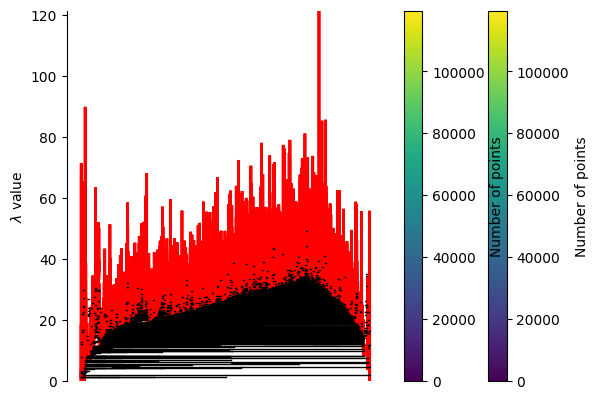

In [ ]:
#HBDSCAN clustering to cluster to low-dimensional vectors
import hdbscan
#clusterer = hdbscan.HDBSCAN()
#clusterer.fit(U)
#clusterer.condensed_tree_.plot(select_clusters=True)

#hdbscan chooses the final clusters based on their size and persistence over varying lambda values. The tree's thickets most persistent branches are the most stable and therefore best
#candidates for clsuters


#testing by balancing the min_samples and min_samples
clusterer = hdbscan.HDBSCAN(
    min_cluster_size=1000, min_samples=100)
clusterer.fit(U)

clusterer.condensed_tree_.plot(select_clusters=True)

In [ ]:
from tqdm import tqdm

# Add the cluster labels to our dataset
df_rr_merged["class"] = clusterer.labels_

# Create dictionary of tokens per cluster
classes = {label: {'tokens': []} for label in set(clusterer.labels_)}
for _, row in df_rr_merged.iterrows():
    classes[row['class']]['tokens'].extend(row['review_tokens'])  # uses existing tokens

# Build vocabulary
all_tokens = [token for tokens in df_rr_merged["review_tokens"] for token in tokens]
vocab = list(set(all_tokens))

# Compute TF matrix
tf = np.zeros((len(classes.keys()), len(vocab)))
for c, _class in enumerate(classes.keys()):
    for t, term in enumerate(tqdm(vocab)):
        tf[c, t] = classes[_class]['tokens'].count(term)


100%|██████████| 27524/27524 [00:00<00:00, 38348.32it/s]


In [ ]:
import os
import numpy as np
import json

folder_path = "/content/drive/MyDrive/Dissertation Project/"
os.makedirs(folder_path, exist_ok=True)

# 1. Save DataFrame as CSV
df_path = os.path.join(folder_path, "df_rr_merged_with_clusters_2.csv")
df_rr_merged.to_csv(df_path, index=False)

# 2. Save vocab as JSON
vocab_path = os.path.join(folder_path, "vocab_2.json")
with open(vocab_path, "w") as f:
    json.dump(vocab, f)

# 3. Save tf matrix as numpy
tf_path = os.path.join(folder_path, "tf_matrix_2.npy")
np.save(tf_path, tf)

# 4. Save classes tokens (keys converted to str)
classes_simple = {str(k): v['tokens'] for k, v in classes.items()}
classes_path = os.path.join(folder_path, "classes_tokens_2.json")
with open(classes_path, "w") as f:
    json.dump(classes_simple, f)

print("✅ All files saved to Google Drive!")


✅ All files saved to Google Drive!


In [ ]:
import pandas as pd
import numpy as np
import json
import os

folder_path = "/content/drive/MyDrive/Dissertation Project/"

# 1. Load CSV file (DataFrame)
df_path = os.path.join(folder_path, "df_rr_merged_with_clusters_2.csv")
df_rr_merged_loaded_2 = pd.read_csv(df_path)

# 2. Load vocab JSON
vocab_path = os.path.join(folder_path, "vocab_2.json")
with open(vocab_path, "r") as f:
    vocab_loaded_2 = json.load(f)

# 3. Load numpy matrix
tf_path = os.path.join(folder_path, "tf_matrix_2.npy")
tf_loaded_2 = np.load(tf_path, allow_pickle=True)

# 4. Load classes tokens JSON
classes_path = os.path.join(folder_path, "classes_tokens_2.json")
with open(classes_path, "r") as f:
    classes_simple_loaded_2 = json.load(f)

print("✅ All files loaded successfully!")
print("DataFrame shape:", df_rr_merged_loaded_2.shape)
print("Vocab sample:", vocab_loaded_2[:5])
print("TF matrix shape:", tf_loaded_2.shape)
print("Classes tokens keys:", list(classes_simple_loaded_2.keys())[:5])


✅ All files loaded successfully!
DataFrame shape: (119524, 27)
Vocab sample: ['flame', 'tummyconscious', 'chacha', 'pear', 'mediumhigh']
TF matrix shape: (3, 27524)
Classes tokens keys: ['0', '1', '-1']


In [ ]:
idf = np.zeros((1, len(vocab_loaded_2)))

# calculate average number of words per class
A = tf_loaded_2.sum() / tf_loaded_2.shape[0]

for t, term in enumerate(tqdm(vocab_loaded_2)):
    # frequency of term t across all classes
    f_t = tf_loaded_2[:,t].sum()
    # calculate IDF
    idf_score = np.log(1 + (A / f_t))
    idf[0, t] = idf_score


tf_idf_2 = tf_loaded_2*idf
#change n based on the best clustering num; top 20 words #preiouvsly was 10 words only
n = 50

top_idx_2 = np.argpartition(tf_idf_2, -n)[:, -n:]
top_idx_2

100%|██████████| 27524/27524 [00:00<00:00, 147621.72it/s]


array([[18310, 21533, 18292, 12285, 23025, 13766, 24518,   742,  9704,
        11417, 20071,  5944,  2819,  7545, 23515, 17627, 11555, 24919,
        19617, 19756, 18215,  7021, 17511, 11701, 26332, 26323,  2103,
        21509,   638, 12676,  9312,  5427,  7742, 22796,  6686,  1203,
        16695,  5270, 18636, 23196,  4834, 26805, 26298, 18162, 25082,
         3227,  3141, 20837,   953,  1293],
       [14130, 24827,  9498,   707, 18310, 11555, 22796, 26671, 11417,
        24919, 26636,   638,  2819,  2103, 25119, 17894,  3798,  1286,
        21509,  1203,  1293, 19756, 18636,   953,  3227,  5427,  4834,
         3141, 25082, 17627,  8327, 13766, 12285,  9312, 20837, 12676,
        26805, 23515, 17511, 23025, 26962, 19617, 18215,  7021,  7742,
         6686, 18162, 16695, 11701, 26298],
       [  837,  3387,   998,   984, 15377, 10913,  6557,  1203,   707,
         4730,  1190, 17658, 23196,  9704, 12285,  6404, 10373, 11701,
        26298, 26671, 26636,  1286, 22796, 12676, 16695,  48

very different output with the change in the hdbscan changed to min_cluster_size = 1000 and min_sample = 100

In [ ]:
vlist = list(vocab_loaded_2)

for c, _class in enumerate(classes_simple_loaded_2.keys()):
    topn_idx = top_idx_2[c, :]
    topn_terms = [vlist[idx] for idx in topn_idx]
    print(topn_terms)

['true', 'easy', 'torso', 'fabric', 'length', 'color', 'much', 'bathroom', 'party', 'also', 'fun', 'day', 'run', 'time', 'work', 'bra', 'big', 'back', 'well', 'm', 'great', 'love', 'short', 'really', 'outfit', 'cute', 'large', 'rent', 'recommend', 'feel', 'look', 'long', 'fit', 'waist', 'size', 'make', 'little', 'romper', 'night', 'super', 'comfortable', 'go', 'small', 'top', 'compliment', 'definitely', 'bit', 'get', 'perfect', 'wear']
['pretty', 'flattering', 'even', 'still', 'true', 'big', 'waist', 'receive', 'also', 'back', 'wedding', 'recommend', 'run', 'large', 'heel', 'material', 'order', 'beautiful', 'rent', 'make', 'wear', 'm', 'night', 'perfect', 'definitely', 'long', 'comfortable', 'bit', 'compliment', 'bra', 'dress', 'color', 'fabric', 'look', 'get', 'feel', 'go', 'work', 'short', 'length', 'tight', 'well', 'great', 'love', 'fit', 'size', 'top', 'little', 'really', 'small']
['shape', 've', 'give', 'know', 'style', 'shower', 'amazing', 'make', 'still', 'lace', 'many', 'overal

In [ ]:
from sentence_transformers import SentenceTransformer
from umap import UMAP
from hdbscan import HDBSCAN

embedding_model = SentenceTransformer('all-MiniLM-L6-v2')
umap_model = UMAP(n_neighbors=15, n_components=2, min_dist=0.05)
hdbscan_model = HDBSCAN(min_cluster_size=1000, min_samples=100, #changing this part
                        gen_min_span_tree=True,
                        prediction_data=True)

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from nltk.corpus import stopwords

stopwords = list(stopwords.words('english'))

# we add this to remove stopwords that can pollute topcs
vectorizer_model = CountVectorizer(ngram_range=(1, 2), stop_words=stopwords)

In [ ]:
from bertopic import BERTopic

model_5b = BERTopic(
    umap_model=umap_model,
    hdbscan_model=hdbscan_model,
    embedding_model=embedding_model,
    vectorizer_model=vectorizer_model,
    top_n_words=10,
    language='english',
    calculate_probabilities=True,
    verbose=True,

)
topics, probs = model_5b.fit_transform(df_rr_merged['review_text'])

2025-07-25 11:03:50,953 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/3736 [00:00<?, ?it/s]

2025-07-25 12:00:13,138 - BERTopic - Embedding - Completed ✓
2025-07-25 12:00:13,147 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-07-25 12:02:00,663 - BERTopic - Dimensionality - Completed ✓
2025-07-25 12:02:00,666 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-07-25 12:02:46,007 - BERTopic - Cluster - Completed ✓
2025-07-25 12:02:46,033 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-07-25 12:02:59,616 - BERTopic - Representation - Completed ✓


In [ ]:
import os
import numpy as np
import pandas as pd
from bertopic import BERTopic

folder_path = "/content/drive/MyDrive/Dissertation Project/"
os.makedirs(folder_path, exist_ok=True)

# Save model
model_path = os.path.join(folder_path, "bertopic_model_5b")
model_5b.save(model_path)

# Save topics & probabilities from fit_transform
np.save(os.path.join(folder_path, "topics_5b.npy"), topics)  # <-- topics is from fit_transform
np.save(os.path.join(folder_path, "probs_5b.npy"), probs)

# Save results dataframe
results_df_5b = df_rr_merged.copy()
results_df_5b["topic"] = topics
results_df_5b["probability"] = [max(p) if p is not None else None for p in probs]

results_df_5b.to_csv(os.path.join(folder_path, "bertopic_results_5b.csv"), index=False)


2025-07-25 12:04:43,018 - BERTopic - WARNING: When you use `pickle` to save/load a BERTopic model,please make sure that the environments in which you saveand load the model are **exactly** the same. The version of BERTopic,its dependencies, and python need to remain the same.


coherence score way lower by 10% after increasing min_cluster_size = 1000 and min_sample = 100

In [ ]:
from gensim.models.coherencemodel import CoherenceModel
from gensim.corpora import Dictionary
from gensim.utils import simple_preprocess

# 1) Get topic words from BERTopic
topics = [[word for word, _ in words] for _, words in model_5b.get_topics().items()]

# 2) Tokenize your documents
texts = [simple_preprocess(doc) for doc in df_rr_merged['review_text'].astype(str).tolist()]

# 3) Build dictionary
dictionary = Dictionary(texts)

# 4) Compute coherence
coherence_model = CoherenceModel(topics=topics, texts=texts, dictionary=dictionary, coherence='c_v')
coherence_score = coherence_model.get_coherence()

print("Coherence Score:", coherence_score)


Coherence Score: 0.4545409529231911


In [ ]:
model_5b.visualize_barchart()

In [ ]:
model_5b.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,10485,-1_dress_size_fit_wear,"[dress, size, fit, wear, would, wore, great, s...","[Fit true to size., Fit true to size, Loved th..."
1,0,72690,0_dress_fit_would_great,"[dress, fit, would, great, wore, wear, comfort...",[This dress fit great on top and a just a litt...
2,1,9922,1_dress_size_fit_10,"[dress, size, fit, 10, wear, would, little, wo...",[I normally wear a size 6 or 8 dress. Luckily ...
3,2,3207,2_top_shirt_jeans_work,"[top, shirt, jeans, work, great, cute, wear, w...","[Great top, loved this top, I love the color o..."
4,3,2949,3_jacket_sweater_coat_warm,"[jacket, sweater, coat, warm, leather, great, ...",[I LOVE this jacket. It was a little tight th...
5,4,2394,4_dress_size_fit_4r,"[dress, size, fit, 4r, would, wore, wear, litt...",[This is a beautiful dress! It fit like a glov...
6,5,2267,5_runs_small_large_size,"[runs, small, large, size, dress, ran, runs sm...","[runs large, Runs very small , Runs very large]"
7,6,2086,6_dress_size_fit_would,"[dress, size, fit, would, wear, wore, little, ...",[I usually wear a 0 or 2 (most of the time a 0...
8,7,2034,7_rtr_dress_first_fit,"[rtr, dress, first, fit, compliments, one, exp...","[This was my first dress rental through RTR, a..."
9,8,1807,8_sequins_dress_arms_itchy,"[sequins, dress, arms, itchy, night, would, li...",[Fit very well. Not too short but very fun wi...


In [ ]:
model_5b.visualize_topics()


In [ ]:
model_5b.visualize_hierarchy()
#topic 0,1,2,4,6 are very similar

#14 and 14 very difference
# may need to merge 0,1,2,4,6

In [ ]:
model_5b.visualize_heatmap()


In [ ]:
model_5b.visualize_term_rank(log_scale=True)
#just looking at the top 3-5 words for model_5b

In [ ]:
classes = df_rr_merged["churn_result"].tolist()


In [ ]:
# Text and class labels
docs = df_rr_merged["review_text"].tolist()
classes = df_rr_merged["churn_result"].tolist()

# Optionally, transform before calling topics_per_class if not done
# topics, probs = model_5b.fit_transform(docs)

# Get class-based topic distributions
topics_per_class = model_5b.topics_per_class(docs, classes=classes)

2it [00:13,  6.83s/it]


In [ ]:
model_5b.visualize_topics_per_class(topics_per_class)


In [ ]:
model_5b.get_topic(topic_id)

[('pregnant', 0.0639607168605158),
 ('baby', 0.04137250821757704),
 ('bump', 0.035994973999936015),
 ('dress', 0.03092605758456351),
 ('months', 0.030511900779604945),
 ('weeks', 0.029929781742824887),
 ('weeks pregnant', 0.02490307122219031),
 ('months pregnant', 0.024648978707112443),
 ('wore', 0.019124933138840096),
 ('size', 0.01768358823401769)]

In [ ]:
from bertopic.representation import KeyBERTInspired
representation_model = KeyBERTInspired(top_n_words=10)
model_5b.update_topics(docs, representation_model=representation_model)

#changes the ordering of the sentences


In [ ]:
for topic_id in model_5b.get_topics().keys():
    if topic_id == -1:
        continue
    words = [word for word, _ in model_5b.get_topic(topic_id)]
    print(f"Topic {topic_id}: {', '.join(words)}")


Topic 0: dress, comfortable, wear, wearing, bra, waist, fit, size, heels, wore
Topic 1: dress, size, comfortable, wear, fit, small, wearing, waist, heels, wore
Topic 2: shirt, bra, comfortable, top, wear, fit, wearing, size, shoulders, skinny
Topic 3: jacket, sweater, sleeves, coat, wear, vest, jeans, warm, comfortable, size
Topic 4: dress, bra, size, fit, waist, small, wear, comfortable, wearing, heels
Topic 5: size, small, sizes, large, dress, medium, fit, smaller, wore, larger
Topic 6: dress, size, wear, comfortable, fit, wearing, small, waist, heels, wore
Topic 7: dresses, dress, rtr, comfortable, bra, wear, wedding, heels, beautiful, wore
Topic 8: dress, dresses, sequin, sequins, wear, wearing, comfortable, bra, wore, fit
Topic 9: xs, dress, fit, comfortable, wear, size, wore, wearing, small, bra
Topic 10: dress, sizing, bra, fit, hips, size, fitted, sizes, wear, comfortable
Topic 11: dress, size, small, fit, waist, wear, wearing, bra, chest, length
Topic 12: jumpsuit, jumpsuits, 

In [ ]:
model_5b.visualize_topics()


In [ ]:
model_5b.get_representative_docs(topic_id)


Checking specific words related to churning


In [ ]:
model_5b.find_topics("bad quality")

([-1, 14, 7, 2, 0],
 [0.20190227, 0.1826951, 0.17528951, 0.17237186, 0.17104383])

In [ ]:
model_5b.find_topics("refund")

([12, -1, 7, 9, 14],
 [0.073231384, 0.05741842, 0.056088127, 0.051352285, 0.04149558])

In [ ]:
model_5b.find_topics("bad")

([14, -1, 4, 0, 2],
 [0.15719388, 0.13109711, 0.11704068, 0.10593398, 0.1054409])

In [ ]:
model_5b.find_topics("dissapointed")

([14, -1, 6, 0, 15],
 [0.106949285, 0.10013716, 0.09881036, 0.089535564, 0.07966522])

In [ ]:
model_5b.find_topics("poor")


([2, 14, 5, 12, -1],
 [0.107490525, 0.09793319, 0.07033632, 0.064829916, 0.06292935])

In [ ]:
import numpy as np

In [ ]:
df_rr_merged["topic"] = model_5b.transform(df_rr_merged["review_text"].tolist())[0]


NameError: name 'model_5b' is not defined

In [ ]:
for tid in [2, 14, 5, 12,-1,0,7,9,6]:
    count = len(df_rr_merged[df_rr_merged["topic"] == tid])
    churn_rate = df_rr_merged[(df_rr_merged["topic"] == tid) & (df_rr_merged["churn_result"] == 1)].shape[0] / count
    print(f"Topic {tid}: Churn Rate = {churn_rate:.2%} ({count} docs)")


KeyError: 'topic'

# Grid Search method  Hyperparameter Tuning BERTopic

Source:
- https://www.kaggle.com/code/danberlyne/amazon-topic-modelling-with-bertopic#2.-Topic-modelling

In [ ]:
!pip install bertopic

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 153.0/153.0 kB 12.7 MB/s eta 0:00:00


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

In [ ]:
len(df_rr_merged['review_text'])

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

119524

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [ ]:
import re
df_rr_merged['review_text'] = df_rr_merged['review_text'].str.replace(r"[^a-zA-Z]+", " ", regex=True)
df_rr_merged['review_text'] = df_rr_merged['review_text'].str.lower().str.strip()


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

In [ ]:
df_rr_merged['review_text'].value_counts().rename(index={idx: idx[:50] for idx in df_rr_merged['review_text']})

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

,count
review_text,
true to size,78
fit true to size,48
fits true to size,43
perfect fit,42
great fit,36
...,...
i rented this for my engagement pictures and it wa,1
what a unique vest of bringing plaid and leather t,1
i rented this coat twice it does run very large an,1


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [ ]:
docs = df_rr_merged['review_text'].unique().tolist()
len(docs)

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

118366

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [ ]:
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
!pipinstall umap-Learn
import umap

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replac

/bin/bash: line 1: pipinstall: command not found


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

this will take 42 minutes on CPU; 1 minute on GPU

In [ ]:
#only the unique list; removing duplicates of review text
embedding_model = SentenceTransformer('all-MiniLM-L6-v2')
embedding_model = embedding_model.to("cuda")
embeddings = embedding_model.encode(docs
                                    ,batch_size= 32
                                    ,show_progress_bar=True
                                    ,device='cuda')

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Batches:   0%|          | 0/3700 [00:00<?, ?it/s]

In [ ]:
from umap import UMAP
umap_model = UMAP(n_neighbors=15, n_components=5, min_dist=0.0, metric='cosine', low_memory=True, random_state=100)


In [ ]:
import hdbscan

hdbscan_model = hdbscan.HDBSCAN(min_cluster_size=500,min_samples=10,metric='euclidean', cluster_selection_method='eom', prediction_data=True)

In [ ]:
extra_stopwords = ['rtr','fit','comfortable','would','size','fit']
all_stopwords =  stopwords.words('english') + extra_stopwords
vectorizer_model = CountVectorizer(stop_words = all_stopwords, ngram_range=(1, 2), min_df=0.005 ,max_df=0.9 ,max_features=5000)

In [ ]:
from bertopic.representation import MaximalMarginalRelevance
from bertopic.vectorizers import ClassTfidfTransformer

In [ ]:
ctfidf_model = ClassTfidfTransformer(bm25_weighting=False, reduce_frequent_words=False)

NameError: name 'ClassTfidfTransformer' is not defined

In [ ]:
representation_model = MaximalMarginalRelevance(diversity=0.3)


In [ ]:
topic_model_ht = BERTopic(embedding_model=embedding_model,
                       umap_model=umap_model,
                       hdbscan_model=hdbscan_model,
                       vectorizer_model=vectorizer_model,
                       ctfidf_model=ctfidf_model,
                       representation_model=representation_model,
                       language='english')

topics, probs = topic_model_ht.fit_transform(docs, embeddings)

In [ ]:
fig1 = topic_model_ht.visualize_barchart(top_n_topics = 12)
fig1.show()

In [ ]:
fig2 = topic_model_ht.visualize_documents(docs)
fig2.show()

In [ ]:
'''if using df_rr_merged['review_text'] immediately without sacrificing the repeated words'''

# Sample 10,000 random rows from the DataFrame
sampled_docs = df_rr_merged['review_text'].sample(n=25000, random_state=100).tolist()

In [ ]:
# Embed only those 250000 (correct alignment)
sampled_embeddings = embedding_model.encode(
    sampled_docs,
    batch_size=32,
    device='cuda',
    show_progress_bar=True
)


Batches:   0%|          | 0/782 [00:00<?, ?it/s]

In [ ]:
#Coherence Score for Each BERTopic Model

import os
def calculate_coherence_score(topic_model_ht, docs):
    os.environ["TOKENIZERS_PARALLELISM"] = "false"
    cleaned_docs = topic_model_ht._preprocess_text(docs)
    vectorizer = topic_model_ht.vectorizer_model
    analyzer = vectorizer.build_analyzer()
    tokens = [analyzer(doc) for doc in cleaned_docs]
    dictionary = corpora.Dictionary(tokens)
    corpus = [dictionary.doc2bow(token) for token in tokens]
    topics = topic_model_ht.get_topics()
    topic_words = [[word for word, _ in topic_model_ht.get_topic(topic)] for topic in topics]
    topic_words = [words for words in topic_words if len(words) > 0]

    coherence_model = CoherenceModel(topics=topic_words,
                                    texts=tokens,
                                    corpus=corpus,
                                    dictionary=dictionary,
                                    coherence='c_v')
    coherence = coherence_model.get_coherence()

    return coherence

In [ ]:
def train_bert(param_vals,docs,embeddings):
    topic_model_ht = BERTopic(embedding_model=embedding_model
                           ,umap_model=UMAP(n_neighbors=param_vals['n_neighbors'], n_components=param_vals['n_components'], min_dist=param_vals['min_dist'], metric='cosine', low_memory=False, random_state=100)
                           ,hdbscan_model=hdbscan.HDBSCAN(min_cluster_size=param_vals['min_cluster_size'], min_samples=int(param_vals['min_samples_mult'] * param_vals['min_cluster_size']), metric=param_vals['metric']
                            ,cluster_selection_method='eom', prediction_data=True)
                           ,vectorizer_model=CountVectorizer(stop_words=stopwords.words('english'), ngram_range=param_vals['ngram_range'], min_df=param_vals['min_df'], max_features=10_000)
                           ,ctfidf_model=ClassTfidfTransformer(bm25_weighting=True, reduce_frequent_words=True)
                           ,representation_model=MaximalMarginalRelevance(diversity=param_vals['diversity'])
                           ,top_n_words=param_vals['top_n_words']
                           ,min_topic_size=param_vals['min_topic_size']
                           ,language='english')

    topics, probs = topic_model_ht.fit_transform(sampled_docs, sampled_embeddings)

    return topic_model_ht

### Hyperparameter tuning using subset of 25000 review text

In [ ]:
import random
import numpy as np
import os
param_ranges = {
    'min_dist': [0.0, 0.1,0.5],
    'n_neighbors': [15,50,70],
    'n_components': [5,10],
    'min_cluster_size': [500,1000, 2000],
    'min_samples_mult': [0.5,1.0],
    'metric': ['euclidean'],
    'ngram_range': [(1, 2)],
    'min_df': [0.005,0.01],
    'diversity': [0.1,0.3,0.5], #lpplomg for braod topics / high-level themes
    'top_n_words': [10,20],
    'min_topic_size': [50,100,200],
    'max_df':[0.7,0.8,0.9]
}

top_5 = [(None, -1, {})] * 5  # Initialize top 5 list

for i in range(50):  # Test 50 random configurations
    param_vals = {
        param: random.choice(param_ranges[param]) for param in param_ranges
    }

    try:
        # === REPLACE THIS BLOCK ===
        # topic_model_ht = train_bert(param_vals)
        # score = calculate_coherence_score(topic_model_ht, docs)

        # WITH THIS:
        topic_model_ht = train_bert(param_vals,docs=sampled_docs,embeddings=sampled_embeddings)
        score = calculate_coherence_score(topic_model_ht, sampled_docs)
        # ==========================

        if score < 0.4:
            print(f"Skipped config {i+1} — coherence score too low: {score:.3f}")
            continue

        if score > top_5[-1][1] and len(topic_model_ht.get_topics()) > 1:
            top_5[-1] = (topic_model_ht, score, param_vals)
            top_5 = sorted(top_5, key=lambda x: x[1], reverse=True)
            print(f"Accepted config {i+1} — score: {score:.3f}")
        else:
            print(f"Rejected config {i+1} — score not high enough or too few topics")

    except Exception as e:
        print(f"Error in config {i+1}: {e}")
        continue

# Final top 5 results
print("\nTop 5 coherence scores:")
for i, (_, score, params) in enumerate(top_5):
    print(f"{i+1}: Score = {score:.4f}, Params = {params}")


Rejected config 1 — score not high enough or too few topics
Accepted config 2 — score: 0.522
Accepted config 3 — score: 0.428
Accepted config 4 — score: 0.468
Rejected config 5 — score not high enough or too few topics
Rejected config 6 — score not high enough or too few topics
Accepted config 7 — score: 0.547
Rejected config 8 — score not high enough or too few topics
Rejected config 9 — score not high enough or too few topics
Rejected config 10 — score not high enough or too few topics
Rejected config 11 — score not high enough or too few topics
Accepted config 12 — score: 0.467
Rejected config 13 — score not high enough or too few topics
Rejected config 14 — score not high enough or too few topics
Accepted config 15 — score: 0.529
Accepted config 16 — score: 0.508
Accepted config 17 — score: 0.474
Rejected config 18 — score not high enough or too few topics
Rejected config 19 — score not high enough or too few topics
Accepted config 20 — score: 0.525
Rejected config 21 — score not h

In [ ]:
import random
import numpy as np
import os
param_ranges = {
    'min_dist': [0.0, 0.1,0.5],
    'n_neighbors': [15,50,70],
    'n_components': [5,10,25,20],
    'min_cluster_size': [100,250,500,1000, 2000],
    'min_samples_mult': [0.5,1.0],
    'metric': ['euclidean'],
    'ngram_range': [(1, 2)],
    'min_df': [0.0025,0.005,0.01],
    'diversity': [0.0,0.1,0.3,0.5,0.7], #lpplomg for braod topics / high-level themes
    'top_n_words': [10,20],
    'min_topic_size': [50,100,200],
    'max_df':[0.7,0.8,0.9]
}

top_5 = [(None, -1, {})] * 5  # Initialize top 5 list

for i in range(200):  # Test 200 random configurations
    param_vals = {
        param: random.choice(param_ranges[param]) for param in param_ranges
    }

    try:
        # === REPLACE THIS BLOCK ===
        # topic_model_ht = train_bert(param_vals)
        # score = calculate_coherence_score(topic_model_ht, docs)

        # WITH THIS:
        topic_model_ht = train_bert(param_vals,docs=sampled_docs,embeddings=sampled_embeddings)
        score = calculate_coherence_score(topic_model_ht, sampled_docs)
        # ==========================

        if score < 0.4:
            print(f"Skipped config {i+1} — coherence score too low: {score:.3f}")
            continue

        if score > top_5[-1][1] and len(topic_model_ht.get_topics()) > 1:
            top_5[-1] = (topic_model_ht, score, param_vals)
            top_5 = sorted(top_5, key=lambda x: x[1], reverse=True)
            print(f"Accepted config {i+1} — score: {score:.3f}")
        else:
            print(f"Rejected config {i+1} — score not high enough or too few topics")

    except Exception as e:
        print(f"Error in config {i+1}: {e}")
        continue

# Final top 5 results
print("\nTop 5 coherence scores:")
for i, (_, score, params) in enumerate(top_5):
    print(f"{i+1}: Score = {score:.4f}, Params = {params}")


Skipped config 1 — coherence score too low: 0.391
Accepted config 2 — score: 0.439
Rejected config 3 — score not high enough or too few topics
Rejected config 4 — score not high enough or too few topics
Accepted config 5 — score: 0.419
Accepted config 6 — score: 0.455
Accepted config 7 — score: 0.424
Skipped config 8 — coherence score too low: 0.398
Accepted config 9 — score: 0.545
Accepted config 10 — score: 0.502
Rejected config 11 — score not high enough or too few topics
Accepted config 12 — score: 0.449
Rejected config 13 — score not high enough or too few topics
Rejected config 14 — score not high enough or too few topics
Rejected config 15 — score not high enough or too few topics
Rejected config 16 — score not high enough or too few topics
Skipped config 17 — coherence score too low: 0.363
Rejected config 18 — score not high enough or too few topics
Rejected config 19 — score not high enough or too few topics
Rejected config 20 — score not high enough or too few topics
Accepted

In [ ]:
#CHECKING USING THE RANDOM 1000 DOCS FIRST; SEE HOW FUST IT RUNS
topic_model_ht = train_bert(param_vals, docs=sampled_docs, embeddings=sampled_embeddings)
score = calculate_coherence_score(topic_model_ht, sampled_docs)


In [ ]:
#CHECKING USING THE RANDOM ALL OF THE REVIEWS DOCS FIRST;
topic_model_ht = train_bert(param_vals, docs=docs)
score = calculate_coherence_score(topic_model_ht, docs)

## Using the Final Hyperparameters to the Whole Corpus



```
# This is formatted as code
```

1: Score = 0.5470, Params = {'min_dist': 0.1, 'n_neighbors': 50, 'n_components': 10, 'min_cluster_size': 500, 'min_samples_mult': 1.0, 'metric': 'euclidean', 'ngram_range': (1, 2), 'min_df': 0.01, 'diversity': 0.1, 'top_n_words': 10, 'min_topic_size': 200, 'max_df': 0.8}


In [ ]:
from bertopic.representation import MaximalMarginalRelevance
from bertopic.vectorizers import ClassTfidfTransformer

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

In [ ]:
embedding_model = SentenceTransformer('all-MiniLM-L6-v2')
embedding_model = embedding_model.to("cuda")
embeddings = embedding_model.encode(docs
                                    ,batch_size= 32
                                    ,show_progress_bar=True
                                    ,device='cuda')

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

README.md: 0.00B [00:00, ?B/s]

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

vocab.txt: 0.00B [00:00, ?B/s]

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

tokenizer.json: 0.00B [00:00, ?B/s]

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Batches:   0%|          | 0/3699 [00:00<?, ?it/s]

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replac

In [ ]:
from umap import UMAP
umap_model = UMAP(n_neighbors=50, n_components=10, min_dist=0.1, metric='cosine', low_memory=False, random_state=100)


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

In [ ]:
 #increasing min_cluster_size given that now the scale of the data is bigger
import hdbscan
hdbscan_model = hdbscan.HDBSCAN(min_cluster_size=500,min_samples=500,metric='euclidean', cluster_selection_method='eom', prediction_data=True)

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

In [ ]:
extra_stopwords = ['rtr','fit','comfortable','would','size','fit','dress','love','loved','perfect','great','beautiful','dresses']
all_stopwords =  stopwords.words('english') + extra_stopwords
vectorizer_model = CountVectorizer(stop_words = all_stopwords, ngram_range=(1, 2), min_df=0.1 ,max_df=0.8 ,max_features=5000)

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

In [ ]:
ctfidf_model = ClassTfidfTransformer(bm25_weighting=False, reduce_frequent_words=True)

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

In [ ]:
representation_model = MaximalMarginalRelevance(diversity=0.1)


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:151: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

In [ ]:
topic_model_final = BERTopic(embedding_model=embedding_model,
                       umap_model=umap_model,
                       hdbscan_model=hdbscan_model,
                       vectorizer_model=vectorizer_model,
                       ctfidf_model=ctfidf_model,
                       representation_model=representation_model,
                       language='english',
                             top_n_words=10
                             ,min_topic_size=200)

topics, probs = topic_model_final.fit_transform(docs, embeddings)

In [ ]:
fig1 = topic_model_final.visualize_barchart(top_n_topics = 12)
fig1.show()

In [ ]:
fig2 = topic_model_final.visualize_documents(docs)
fig2.show()

In [ ]:
topic_model_final.visualize_topics()


In [ ]:
topic_model_final.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,628,-1_dvf wrap_wrap_flair_draped,"[dvf wrap, wrap, flair, draped, jersey, big wo...",[so so flattering on any body type i can t wai...
1,0,113501,0_black tie_gown_tights_knees,"[black tie, gown, tights, knees, summer weddin...",[one of my best rtr dresses to date it was per...
2,1,1614,1_ordered xs_wear xs_wore xs_xs small,"[ordered xs, wear xs, wore xs, xs small, small...",[i wore this dress to a friend s party at a ni...
3,2,1489,2_jumper_jumpsuits_going bathroom_wearing heels,"[jumper, jumpsuits, going bathroom, wearing he...",[this jumper is awesome i wore it after our we...
4,3,1167,3_rompers_cute romper_bachelorette_bachelorett...,"[rompers, cute romper, bachelorette, bachelore...",[i have a long torso so rompers are tough but ...


In [ ]:
#using the sampled hyperparameter tuning data result
calculate_coherence_score(topic_model_final, docs)

### Append BERTopic topics to dtaframe

Source:
- https://stackoverflow.com/questions/74448344/map-bertopic-topic-ids-back-to-the-training-dataframe
- https://maartengr.github.io/BERTopic/getting_started/best_practices/best_practices.html

- https://medium.com/data-scientists-diary/dimensionality-reduction-for-visualizing-single-cell-data-using-umap-85fe6e5a8afb




In [ ]:
# Determine topics on testing docs
df_= pd.DataFrame({"docs": docs, "topics": topics})
print(df_rr_merged)
print(topic_model_final.get_topic_info())


        user_id bust size  item_id  weight(lbs)  rating     rented for  \
0        420272       34d  2260466        137.0    10.0       vacation   
1        151944       34b   616682        145.0    10.0        wedding   
2        336066       34c   568429        112.0    10.0       everyday   
3        154309       32b  1729232        114.0    10.0  formal affair   
4         87660       36a  1295171        120.0    10.0          party   
...         ...       ...      ...          ...     ...            ...   
119674   537417       32d  1400094        125.0    10.0          party   
119675    41453       34d   326784        135.0     8.0        wedding   
119676    66386      34dd  2252812        140.0    10.0           work   
119677   118398       32c   682043        100.0    10.0           work   
119678    47002       36a   683251        135.0     6.0       everyday   

                                              review_text          body type  \
0       an adorable romper belt

In [ ]:
topic_df = pd.DataFrame({'review_text': docs, 'topic': topics})
df_rr_merged = df_rr_merged.merge(topic_df, on='review_text', how='left')


In [ ]:
df_rr_merged.head()

,user_id,bust size,item_id,weight(lbs),rating,rented for,review_text,body type,review_summary,category,...,bra_cup_enc,bust_enc,fit_large,fit_small,height(ft)_5,height(ft)_6,size_enc,weight_scaled,age_scaled,topic
0,420272,34d,2260466,137.0,10.0,vacation,An adorable romper! Belt and zipper were a lit...,hourglass,So many compliments!,romper,...,0.240688,0.524414,0,0,1,0,0.074746,0.023138,-0.796955,2
1,151944,34b,616682,145.0,10.0,wedding,I have always been petite in my upper body and...,athletic,Was in love with this dress !!!,gown,...,0.257848,0.524414,0,0,1,0,0.128577,0.432119,-0.924109,0
2,336066,34c,568429,112.0,10.0,everyday,This dress is so sweet. I loved the print. The...,hourglass,LITERALLY THE CUTEST DRESS EVER,dress,...,0.344684,0.524414,0,0,1,0,0.160219,-1.254926,-0.924109,0
3,154309,32b,1729232,114.0,10.0,formal affair,The dress was very flattering and fit perfectl...,petite,This dress was everything! It was perfect for ...,gown,...,0.257848,0.218299,0,0,1,0,0.068614,-1.152681,-0.161186,0
4,87660,36a,1295171,120.0,10.0,party,The S was snug but in a good way. I wore a pus...,straight & narrow,This dress made me feel so confident & sexy!,sheath,...,0.080452,0.204428,0,0,1,0,0.226365,-0.845945,-1.051263,0


In [ ]:
df_rr_merged.columns

Index(['user_id', 'bust size', 'item_id', 'weight(lbs)', 'rating',
       'rented for', 'review_text', 'body type', 'review_summary', 'category',
       'height', 'size', 'age', 'review_date', 'unique_id', 'bust_measurement',
       'bra_cup', 'bust_ms_new', 'height(inch)', 'retention_time',
       'last_review_date', 'churn_result', 'review_length',
       'review_text_lower', 'review_tokens', 'rented_for_enc', 'category_enc',
       'body_type_enc', 'rating_enc', 'bra_cup_enc', 'bust_enc', 'fit_large',
       'fit_small', 'height(ft)_5', 'height(ft)_6', 'size_enc',
       'weight_scaled', 'age_scaled', 'topic'],
      dtype='object')

In [ ]:
df_rr_merged['topic'].value_counts()

,count
topic,
0,116157
1,1462
2,1157
3,748


In [ ]:
#df_rr_merged.drop(['topic_x','topic_y'], axis=1, inplace=True)

In [ ]:
len(df_rr_merged)

119679

Why BERTopic may have a low coherence score:


Source: https://medium.com/%40daphycarol/topic-modeling-with-lda-nmf-bertopic-and-top2vec-model-comparison-part-2-f82787f4404c



# LR

### feature selection using forward step (ANOVA for categorical and numeric data)

With a smaller number of features:
- The models are more interpretable
- Model training is faster and so is space required by the model

While Chi-Square is a very simple tool for univariate feature selection for classification. It does not take into consideration the feature interactions. This is best suited for categorical variables, hence as wide application in textual data.

ANOVA can handle both categorical and numerical features

Limitation of Chi-square -> assumes that the variables being tested are independent of each other. There it may not capture more complex relationships such as non-linear or interactive effects. Does ot provide information about the strength or direction of the reltionship. Sensitive to sample size

Using chi-square: rank features based on their scores


Source: https://ethen8181.github.io/machine-learning/text_classification/chisquare.html
https://www.hackersrealm.net/post/feature-selection-using-chi-square



In [ ]:
df_rr_merged.columns

Index(['fit', 'user_id', 'bust size', 'item_id', 'weight(lbs)', 'rating',
       'rented for', 'review_text', 'body type', 'review_summary', 'category',
       'height', 'size', 'age', 'review_date', 'unique_id', 'bust_measurement',
       'bra_cup', 'bust_ms_new', 'height(ft)', 'height(inch)',
       'retention_time', 'last_review_date', 'churn_result', 'review_length',
       'review_text_lower', 'review_tokens'],
      dtype='object')

In [ ]:
df_rr_merged['height(ft)'].value_counts()

,count
height(ft),
5,117568
6,1219
4,737


In [ ]:
#categorical data: rating, rented_for_enc, category_enc,body_type_enc, (fit_fit),fit_large,fit_large

#frequency encoding

df_rr_merged['rented_for_enc'] = df_rr_merged.groupby('rented for')['rented for'].transform('count') / len(df_rr_merged)
df_rr_merged['category_enc'] = df_rr_merged.groupby('category')['category'].transform('count') / len(df_rr_merged)
df_rr_merged['body_type_enc'] = df_rr_merged.groupby('body type')['body type'].transform('count')/ len(df_rr_merged)
df_rr_merged['rating_enc'] = df_rr_merged.groupby('rating')['rating'].transform('count')/ len(df_rr_merged)
df_rr_merged['bra_cup_enc'] = df_rr_merged.groupby('bra_cup')['bra_cup'].transform('count')/ len(df_rr_merged)
df_rr_merged['bust_enc'] = df_rr_merged.groupby('bust_measurement')['bust_measurement'].transform('count')/ len(df_rr_merged)

#one-hot encoding
#category columns: fit,rented for, body type, category
df_rr_merged = pd.get_dummies(df_rr_merged,columns=['fit'],drop_first=True,dtype=int)
df_rr_merged = pd.get_dummies(df_rr_merged,columns=['height(ft)'],drop_first=True,dtype=int)

In [ ]:
df_rr_merged['size_enc'] = df_rr_merged.groupby('size')['size'].transform('count')/ len(df_rr_merged)


In [ ]:
import pandas
from sklearn import linear_model
from sklearn.preprocessing import StandardScaler
scale = StandardScaler()

df_rr_merged['weight_scaled'] = scale.fit_transform(df_rr_merged[['weight(lbs)']])
df_rr_merged['age_scaled'] = scale.fit_transform(df_rr_merged[['age']])

Previous data cleaning process included encoding

In [ ]:

df_rr_merged.columns
lr_df = df_rr_merged[[ 'rented_for_enc',
       'category_enc', 'body_type_enc', 'rating_enc', 'bra_cup_enc',
       'bust_enc', 'fit_large', 'fit_small', 'height(ft)_5', 'height(ft)_6','weight_scaled','age_scaled','size_enc','churn_result']]
len(lr_df.columns)

14

In [ ]:
X = lr_df.drop(['churn_result','age_scaled','weight_scaled' ,'rented_for_enc','category_enc','body_type_enc','rating_enc','bra_cup_enc','bust_enc','size_enc'], axis=1)
y = lr_df['churn_result']
y.value_counts()

,count
churn_result,
0,61589
1,57935


In [ ]:
sig=np.array([0.05])

Text(0.5, 1.0, 'Feature Significance Based on Chi-Square Statistic Values from Chi-Square Test')

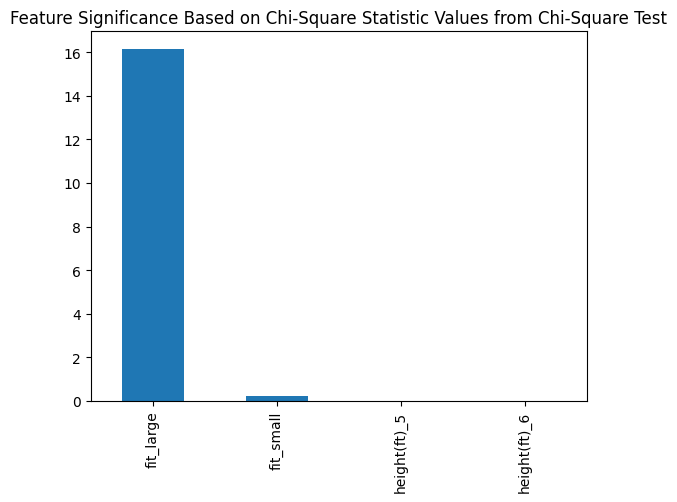

In [ ]:
### Using Chi-Square test for feature selection of categorical variables
from sklearn.feature_selection import chi2
import matplotlib.pyplot as plt


chi_scores = chi2(X,y)
chi_scores #first array: chi-square values and second array represents p-values
#if -_value > 0.05, lower the importance
chi_values = pd.Series(chi_scores[0],index=X.columns)

chi_values.sort_values(ascending=False,inplace=True)
chi_values.plot.bar()
plt.title('Feature Significance Based on Chi-Square Statistic Values from Chi-Square Test')

#output shows: height, bust_enc, body_type,fit_small, rating are not important

<Axes: title={'center': 'Feature Significance Based on P-value from Chi-Square Test'}>

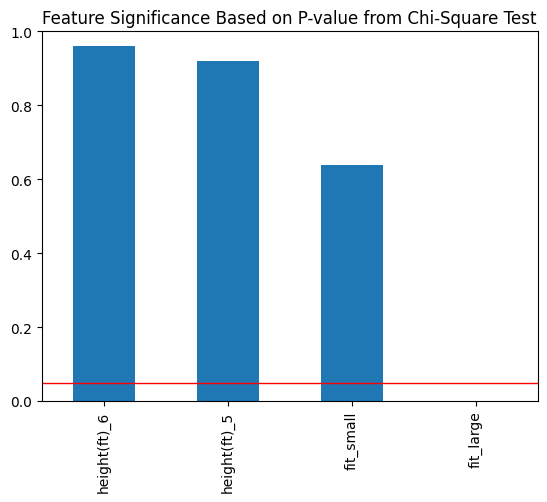

In [ ]:
### Using Chi-Square test for feature selection of categorical variables
from sklearn.feature_selection import chi2
import matplotlib.pyplot as plt


chi_scores = chi2(X,y)
chi_scores #first array: chi-square values and second array represents p-values
#if -_value > 0.05, lower the importance
p_values = pd.Series(chi_scores[1],index=X.columns)
plt.axhline(y=0.05,linewidth=1, color='r')

p_values.sort_values(ascending=False,inplace=True)
plt.ylim(0,1)
plt.title('Feature Significance Based on P-value from Chi-Square Test')
p_values.plot.bar()


#output shows: height, bust_enc, body_type,fit_small, rating are not important

Testing for feature importance of the numerical features: weight and age --> ANOVA feature selection

Analysis of Variance is a statistical method, used to check the means of two or more groups that are significantly different from each other. It assumes Hypothesis as

H0: Means of all groups are equal.

H1: At least one mean of the groups are different.

**One Way ANOVA with example**
- One Way ANOVA tests the relationship between categorical predictor vs continuous response.
- Here we will check whether there is equal variance between groups of categorical feature wrt continuous response.
- If there is equal variance between groups, it means this feature has no impact on response and it can not be considered for model training.

Source: https://medium.com/data-science/anova-for-feature-selection-in-machine-learning-d9305e228476

In [ ]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
from sklearn.model_selection import train_test_split

X_numeric = lr_df[['weight_scaled','age_scaled','rented_for_enc','category_enc','body_type_enc','rating_enc','bra_cup_enc','bust_enc','size_enc']]
y_numeric = lr_df['churn_result']
X_train, X_test, y_train,y_test = train_test_split(X_numeric,y_numeric,test_size=0.2,random_state=100)



In [ ]:
selector = SelectKBest(score_func=f_classif, k='all')
X_train_selected = selector.fit_transform(X_train, y_train)
X_test_selected = selector.transform(X_test)
p_values = selector.pvalues_[selector.get_support()]


selected_features = X_numeric.columns[selector.get_support()]
f_scores = selector.scores_[selector.get_support()]
print(f"Selected Features: {selected_features}")
print(f"F-Scores: {f_scores}")
print(f"P-values:{p_values}") #both features are statistically significant according to ANOVA Test

Selected Features: Index(['weight_scaled', 'age_scaled', 'rented_for_enc', 'category_enc',
       'body_type_enc', 'rating_enc', 'bra_cup_enc', 'bust_enc', 'size_enc'],
      dtype='object')
F-Scores: [5.09000287e+00 9.14920419e+00 1.46927391e+03 7.13471922e+01
 1.44145251e+00 2.14576101e+00 1.21424518e+02 1.22790712e-01
 9.62695970e+01]
P-values:[2.40664012e-002 2.48892297e-003 5.00142653e-319 3.03708368e-017
 2.29907412e-001 1.42967418e-001 3.20836727e-028 7.26028000e-001
 1.02766727e-022]


In [ ]:
#only height is not encluded
X_new = df_rr_merged[['size_enc','bust_enc','bra_cup_enc','rating_enc','body_type_enc','category_enc','fit_large','fit_small','rented_for_enc','weight_scaled','age_scaled']]
y_new = df_rr_merged['churn_result']

In [ ]:

# instantiate the model (using the default parameters)
from sklearn.linear_model import LogisticRegression
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold

from numpy import mean
from numpy import std
#5-fold cross validation
cv = KFold(n_splits=10, random_state=100, shuffle=True)
logreg_model = LogisticRegression(random_state=100,class_weight='balanced')

# evaluate model
recall_scores = cross_val_score(logreg_model, X_new, y_new, scoring='recall', cv=cv, n_jobs=-1)
accuracy_scores = cross_val_score(logreg_model, X_new, y_new, scoring='accuracy', cv=cv, n_jobs=-1)
precision_scores = cross_val_score(logreg_model, X_new, y_new, scoring='precision', cv=cv, n_jobs=-1)


# report performance
print('Recall: %.3f (%.3f)' % (mean(recall_scores), std(recall_scores)))
print('Accuracy: %.3f (%.3f)' % (mean(accuracy_scores), std(accuracy_scores)))
print('Precision: %.3f (%.3f)' % (mean(precision_scores), std(precision_scores)))

Recall: 0.553 (0.006)
Accuracy: 0.566 (0.004)
Precision: 0.553 (0.004)


In [ ]:
from sklearn.model_selection import RepeatedKFold, cross_val_predict
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix, classification_report


# Get cross-validated predictions (predicted labels)
y_pred = cross_val_predict(logreg_model, X_new, y_new, cv=cv, n_jobs=-1)

# Now calculate all required metrics
accuracy = accuracy_score(y_new, y_pred)
precision = precision_score(y_new, y_pred)
recall = recall_score(y_new, y_pred)
conf_matrix = confusion_matrix(y_new, y_pred)

# Print results
print(f"Accuracy:  {accuracy:.3f}")
print(f"Precision: {precision:.3f}")
print(f"Recall:    {recall:.3f}")
print("\nConfusion Matrix:")
print(conf_matrix)

# Optional: full report
print("\nClassification Report:")
print(classification_report(y_new, y_pred))


Accuracy:  0.566
Precision: 0.553
Recall:    0.553

Confusion Matrix:
[[35668 25921]
 [25893 32042]]

Classification Report:
              precision    recall  f1-score   support

           0       0.58      0.58      0.58     61589
           1       0.55      0.55      0.55     57935

    accuracy                           0.57    119524
   macro avg       0.57      0.57      0.57    119524
weighted avg       0.57      0.57      0.57    119524



In [ ]:
from sklearn.linear_model import LogisticRegression

# Instantiate and fit final model on all available data
final_model = LogisticRegression(max_iter=1000, random_state=100)
final_model.fit(X_new, y_new)
# Get feature names
feature_names = X_new.columns

# Get coefficients and intercept
coefficients = final_model.coef_[0]
intercept = final_model.intercept_[0]

# Print the formula
formula = f"logit(p) = {intercept:.4f}"
for name, coef in zip(feature_names, coefficients):
    formula += f" + ({coef:.4f} × {name})"

print("Logistic Regression Formula:")
print(formula)
#weight and age seems to have a minimal impact; may forego these two variables as well as no difference in accuracy, precision and recall (but need check this again)

Logistic Regression Formula:
logit(p) = -0.7514 + (-0.8756 × size_enc) + (0.0534 × bust_enc) + (0.7578 × bra_cup_enc) + (-0.0157 × rating_enc) + (-0.1547 × body_type_enc) + (0.1864 × category_enc) + (-0.0409 × fit_large) + (-0.0459 × fit_small) + (3.5787 × rented_for_enc) + (-0.0084 × weight_scaled) + (-0.0041 × age_scaled)


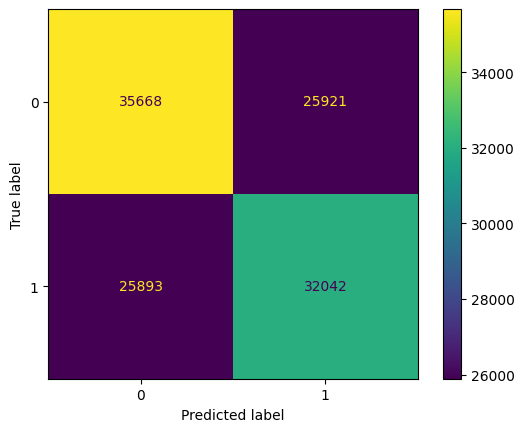

In [ ]:
from sklearn import metrics
confusion_matrix = metrics.confusion_matrix(y_new, y_pred)

cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [0, 1])

import matplotlib.pyplot as plt
cm_display.plot()
plt.show()

In [ ]:
#chatgpt code but this is based on the documentation as the solvers have certain limitation for penalty
param_grid = [
    # l1: only liblinear and saga
    {
        'penalty': ['l1'],
        'solver': ['liblinear', 'saga'],
        'C': np.logspace(-4, 4, 10),
        'max_iter': [100, 1000]
    },
    # l2: supported by all solvers
    {
        'penalty': ['l2'],
        'solver': ['lbfgs', 'newton-cg', 'liblinear', 'sag', 'saga'],
        'C': np.logspace(-4, 4, 10),
        'max_iter': [100, 1000]
    },
    # elasticnet: only saga, must include l1_ratio
    {
        'penalty': ['elasticnet'],
        'solver': ['saga'],
        'C': np.logspace(-4, 4, 10),
        'l1_ratio': [0.1, 0.5, 0.9],
        'max_iter': [100, 1000]
    },
    # no penalty: use None (not 'none')
    {
        'penalty': [None],
        'solver': ['lbfgs', 'newton-cg', 'sag', 'saga'],
        'C': np.logspace(-4, 4, 10),
        'max_iter': [100, 1000]
    }
]


In [ ]:
from sklearn.model_selection import GridSearchCV

# Define your KFold strategy (10-fold CV, shuffled, reproducible)
cv_strategy = KFold(n_splits=10, random_state=100, shuffle=True)

# Define your model (as in your second code block)
final_model = LogisticRegression(random_state=100, class_weight='balanced')

# Use your corrected param_grid (see previous messages)
# Assuming you already updated param_grid correctly

# Define GridSearchCV with your CV strategy
clf = GridSearchCV(
    estimator=final_model,
    param_grid=param_grid,
    cv=cv_strategy,            # ← custom KFold CV here
    verbose=1,
    n_jobs=-1,
    scoring='f1'         # Optional: define scoring explicitly
)

# Run the grid search
clf.fit(X_new, y_new)

# Report best result
print("Best params:", clf.best_params_)
print("Best CV score: %.3f" % clf.best_score_)

Fitting 10 folds for each of 280 candidates, totalling 2800 fits


KeyboardInterrupt: 

In [ ]:
best_params =  {'C': 9.999999999999999e-05, 'max_iter': 100, 'penalty': 'l2', 'solver': 'liblinear','class_weight':'balanced'}


In [ ]:
cv = KFold(n_splits=10, random_state=100, shuffle=True)
final_model_1 = LogisticRegression(**best_params, random_state=100)

# evaluate model with correct targets
recall_scores = cross_val_score(final_model_1, X_new, y_new, scoring='recall', cv=cv, n_jobs=-1)
accuracy_scores = cross_val_score(final_model_1, X_new, y_new, scoring='accuracy', cv=cv, n_jobs=-1)
precision_scores = cross_val_score(final_model_1, X_new, y_new, scoring='precision', cv=cv, n_jobs=-1)

# report performance
print('accuracy: %.3f (%.3f)' % (mean(accuracy_scores), std(accuracy_scores)))
print('recall: %.3f (%.3f)' % (mean(recall_scores), std(recall_scores)))
print('precision: %.3f (%.3f)' % (mean(precision_scores), std(precision_scores)))


accuracy: 0.517 (0.005)
recall: 0.625 (0.009)
precision: 0.501 (0.006)


# LDA + LR



Converting into feature columns

Source:
- https://stackoverflow.com/questions/53518217/adding-topic-distribution-outcome-of-topic-model-to-pandas-dataframe?utm_source=chatgpt.com

In [ ]:
lda_model_6.print_topics()

[(0,
  '0.065*"long" + 0.062*"bra" + 0.045*"heel" + 0.040*"back" + 0.034*"need" + 0.021*"length" + 0.019*"keep" + 0.019*"inch" + 0.018*"show" + 0.017*"low"'),
 (1,
  '0.072*"cute" + 0.043*"pair" + 0.028*"day" + 0.028*"warm" + 0.028*"jacket" + 0.027*"casual" + 0.023*"piece" + 0.022*"work" + 0.022*"black" + 0.020*"shirt"'),
 (2,
  '0.076*"size" + 0.027*"small" + 0.026*"top" + 0.025*"tight" + 0.025*"little" + 0.022*"bit" + 0.022*"m" + 0.022*"run" + 0.021*"fit" + 0.021*"large"'),
 (3,
  '0.063*"time" + 0.043*"first" + 0.025*"send" + 0.025*"try" + 0.021*"rtr" + 0.018*"next" + 0.014*"arrive" + 0.014*"pick" + 0.014*"choice" + 0.013*"second"'),
 (4,
  '0.081*"dress" + 0.048*"wear" + 0.026*"fit" + 0.023*"love" + 0.021*"great" + 0.019*"perfect" + 0.018*"comfortable" + 0.018*"rent" + 0.017*"get" + 0.016*"compliment"'),
 (5,
  '0.103*"zipper" + 0.066*"zip" + 0.055*"gown" + 0.034*"difficult" + 0.013*"head" + 0.012*"tough" + 0.011*"help" + 0.010*"break" + 0.008*"hard" + 0.007*"impossible"')]

topic distribution across documents

In [ ]:
best_lda_model = lda_model_6
lda_output = best_lda_model[corpus]
df_document_topic = pd.DataFrame(lda_output)
df_document_topic.head()




KeyboardInterrupt: 

In [ ]:
df_document_topic=df_document_topic.rename(columns={0: "visual_trust_gap", 1: "positive_outfit_styling",
                                      2:"fit_issues",3:"smell_issues",4:"complimentary_fit"
                                      ,5:"zipper_issues"})

df_document_topic.head()



In [ ]:
df_document_topic = df_document_topic.fillna(value=np.nan)
df_document_topic.head()

,visual_trust_gap,positive_outfit_styling,fit_issues,smell_issues,complimentary_fit,zipper_issues
0,"(0, 0.072371095)","(1, 0.08877021)","(2, 0.1822499)","(3, 0.04806933)","(4, 0.56358194)","(5, 0.044957507)"
1,"(0, 0.068089806)","(2, 0.58199555)","(3, 0.012523427)","(4, 0.32307908)",NaN,NaN
2,"(0, 0.10855957)","(1, 0.022875102)","(2, 0.24676876)","(3, 0.018848814)","(4, 0.59371126)",NaN
3,"(0, 0.09450506)","(2, 0.27756858)","(3, 0.025127249)","(4, 0.57669216)","(5, 0.017570524)",NaN
4,"(0, 0.16978745)","(1, 0.015335264)","(2, 0.16459933)","(3, 0.01653799)","(4, 0.6270298)",NaN


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer


In [ ]:
new_column_names = ["visual_trust_gap", "positive_outfit_styling",
                    "fit_issues","smell_issues","complimentary_fit"
                                      ,"zipper_issues"]
new_column_names

['visual_trust_gap',
 'positive_outfit_styling',
 'fit_issues',
 'smell_issues',
 'complimentary_fit',
 'zipper_issues']

In [ ]:
df_rr_merged[new_column_names] = df_document_topic


In [ ]:
df_rr_merged['visual_trust_gap'].dtype

dtype('O')

In [ ]:
df_rr_merged['visual_trust_gap'].values[0][1]

0.072371095

In [ ]:
len(df_rr_merged)

119524

In [ ]:

def extract_prob(df_rr_merged):
  topic_0_prob = []

  for row in range(len(df_rr_merged['visual_trust_gap'])):
    val = df_rr_merged['visual_trust_gap'].values[row]
    if pd.isna(val):
      topic_0_prob.append(0)
    else:
      topic_0_prob.append(val[1])
  return topic_0_prob

df_rr_merged['visual_trust_gap'] = extract_prob(df_rr_merged)



In [ ]:

def extract_prob_1(df_rr_merged):
  topic_1_prob = []

  for row in range(len(df_rr_merged['positive_outfit_styling'])):
    val = df_rr_merged['positive_outfit_styling'].values[row]
    if pd.isna(val):
      topic_1_prob.append(0)
    else:
      topic_1_prob.append(val[1])
  return topic_1_prob

df_rr_merged['positive_outfit_styling'] = extract_prob_1(df_rr_merged)



In [ ]:

def extract_prob_2(df_rr_merged):
  topic_2_prob = []

  for row in range(len(df_rr_merged['fit_issues'])):
    val = df_rr_merged['fit_issues'].values[row]
    if pd.isna(val):
      topic_2_prob.append(0)
    else:
      topic_2_prob.append(val[1])
  return topic_2_prob

df_rr_merged['fit_issues'] = extract_prob_2(df_rr_merged)



In [ ]:

def extract_prob_3(df_rr_merged):
  topic_3_prob = []

  for row in range(len(df_rr_merged['smell_issues'])):
    val = df_rr_merged['smell_issues'].values[row]
    if pd.isna(val):
      topic_3_prob.append(0)
    else:
      topic_3_prob.append(val[1])
  return topic_3_prob

df_rr_merged['smell_issues'] = extract_prob_3(df_rr_merged)



In [ ]:

def extract_prob_4(df_rr_merged):
  topic_4_prob = []

  for row in range(len(df_rr_merged['complimentary_fit'])):
    val = df_rr_merged['complimentary_fit'].values[row]
    if pd.isna(val):
      topic_4_prob.append(0)
    else:
      topic_4_prob.append(val[1])
  return topic_4_prob

df_rr_merged['complimentary_fit'] = extract_prob_4(df_rr_merged)



In [ ]:

def extract_prob_5(df_rr_merged):
  topic_5_prob = []

  for row in range(len(df_rr_merged['zipper_issues'])):
    val = df_rr_merged['zipper_issues'].values[row]
    if pd.isna(val):
      topic_5_prob.append(0)
    else:
      topic_5_prob.append(val[1])
  return topic_5_prob

df_rr_merged['zipper_issues'] = extract_prob_5(df_rr_merged)



In [ ]:
df_rr_merged.head()

,user_id,bust size,item_id,weight(lbs),rating,rented for,review_text,body type,review_summary,category,...,height(ft)_6,size_enc,weight_scaled,age_scaled,visual_trust_gap,positive_outfit_styling,fit_issues,smell_issues,complimentary_fit,zipper_issues
0,420272,34d,2260466,137.0,10.0,vacation,an adorable romper belt and zipper were a litt...,hourglass,So many compliments!,romper,...,0,0.074746,0.023138,-0.796955,0.072371,0.088770,0.182250,0.048069,0.563582,0.044958
1,151944,34b,616682,145.0,10.0,wedding,i have always been petite in my upper body and...,athletic,Was in love with this dress !!!,gown,...,0,0.128577,0.432119,-0.924109,0.068090,0.581996,0.012523,0.323079,0.000000,0.000000
2,336066,34c,568429,112.0,10.0,everyday,this dress is so sweet i loved the print the f...,hourglass,LITERALLY THE CUTEST DRESS EVER,dress,...,0,0.160219,-1.254926,-0.924109,0.108560,0.022875,0.246769,0.018849,0.593711,0.000000
3,154309,32b,1729232,114.0,10.0,formal affair,the dress was very flattering and fit perfectl...,petite,This dress was everything! It was perfect for ...,gown,...,0,0.068614,-1.152681,-0.161186,0.094505,0.277569,0.025127,0.576692,0.017571,0.000000
4,87660,36a,1295171,120.0,10.0,party,the s was snug but in a good way i wore a push...,straight & narrow,This dress made me feel so confident & sexy!,sheath,...,0,0.226365,-0.845945,-1.051263,0.169787,0.015335,0.164599,0.016538,0.627030,0.000000


In [ ]:
lr_df_1 = clean_df[['size_enc','bra_cup_enc','category_enc','fit_large','fit_small','rented_for_enc','weight_scaled','age_scaled','churn_result']]

In [ ]:
#churn formula
print("Churn Rate of RTR Customers:",round(len(lr_df_1[lr_df_1['churn_result']==1])/len(df_rr)*100,2),"%")

Churn Rate of RTR Customers: 30.36 %


In [ ]:
X = lr_df_1.drop('churn_result', axis=1)
y = lr_df_1['churn_result']
y.value_counts()

,count
churn_result,
0,61589
1,57935


In [ ]:
clean_df.columns

Index(['user_id', 'bust size', 'item_id', 'weight(lbs)', 'rating',
       'rented for', 'review_text', 'body type', 'review_summary', 'category',
       'height', 'size', 'age', 'review_date', 'unique_id', 'bust_measurement',
       'bra_cup', 'bust_ms_new', 'height(inch)', 'retention_time',
       'last_review_date', 'churn_result', 'review_length',
       'review_text_lower', 'review_tokens', 'review_tokens_joined',
       'rented_for_enc', 'category_enc', 'body_type_enc', 'rating_enc',
       'bra_cup_enc', 'bust_enc', 'fit_large', 'fit_small', 'height(ft)_5',
       'height(ft)_6', 'size_enc', 'weight_scaled', 'age_scaled',
       'visual_trust_gap', 'positive_outfit_styling', 'fit_issues',
       'smell_issues', 'complimentary_fit', 'zipper_issues'],
      dtype='object')

In [ ]:
lr_df_1 = df_rr_merged[['size_enc','bust_enc','bra_cup_enc','rating_enc','body_type_enc','category_enc','fit_large','fit_small','rented_for_enc','weight_scaled','age_scaled','visual_trust_gap', 'positive_outfit_styling', 'fit_issues',
       'smell_issues', 'complimentary_fit', 'zipper_issues','churn_result']]
lr_df_1.columns

Index(['size_enc', 'bust_enc', 'bra_cup_enc', 'rating_enc', 'body_type_enc',
       'category_enc', 'fit_large', 'fit_small', 'rented_for_enc',
       'weight_scaled', 'age_scaled', 'visual_trust_gap',
       'positive_outfit_styling', 'fit_issues', 'smell_issues',
       'complimentary_fit', 'zipper_issues', 'churn_result'],
      dtype='object')

In [ ]:
X_1 = lr_df_1.drop('churn_result', axis=1)
y_1 = lr_df_1['churn_result']
y_1.value_counts()

,count
churn_result,
0,61589
1,57935


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import RepeatedKFold, cross_val_predict
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix, classification_report


# Get cross-validated predictions (predicted labels)
#y_1 is the true label
y_pred_1= cross_val_predict(logreg_model, X_1, y_1, cv=cv, n_jobs=-1)

# Now calculate all required metrics
accuracy = accuracy_score(y_1, y_pred_1)
precision = precision_score(y_1, y_pred_1)
recall = recall_score(y_1, y_pred_1)
conf_matrix = confusion_matrix(y_1, y_pred_1)

# Print results
print(f"Accuracy:  {accuracy:.3f}")
print(f"Precision: {precision:.3f}")
print(f"Recall:    {recall:.3f}")
print("\nConfusion Matrix:")
print(conf_matrix)

# Optional: full report
print("\nClassification Report:")
print(classification_report(y_1, y_pred_1))


Accuracy:  0.566
Precision: 0.552
Recall:    0.553

Confusion Matrix:
[[35622 25967]
 [25883 32052]]

Classification Report:
              precision    recall  f1-score   support

           0       0.58      0.58      0.58     61589
           1       0.55      0.55      0.55     57935

    accuracy                           0.57    119524
   macro avg       0.57      0.57      0.57    119524
weighted avg       0.57      0.57      0.57    119524



In [ ]:
from sklearn.linear_model import LogisticRegression

# Instantiate and fit final model on all available data
final_model = LogisticRegression(max_iter=1000, random_state=100)
final_model.fit(X_1, y_1)
# Get feature names
feature_names = X_1.columns

# Get coefficients and intercept
coefficients = final_model.coef_[0]
intercept = final_model.intercept_[0]

# Print the formula
formula = f"logit(p) = {intercept:.4f}"
for name, coef in zip(feature_names, coefficients):
    formula += f" + ({coef:.4f} × {name})"

print("Logistic Regression Formula:")
print(formula)


Logistic Regression Formula:
logit(p) = -0.6432 + (-0.8852 × size_enc) + (0.0472 × bust_enc) + (0.7677 × bra_cup_enc) + (-0.0263 × rating_enc) + (-0.1542 × body_type_enc) + (0.1889 × category_enc) + (-0.0451 × fit_large) + (-0.0492 × fit_small) + (3.5948 × rented_for_enc) + (-0.0091 × weight_scaled) + (-0.0044 × age_scaled) + (-0.1460 × visual_trust_gap) + (-0.0633 × positive_outfit_styling) + (-0.1143 × fit_issues) + (-0.0844 × smell_issues) + (-0.1005 × complimentary_fit) + (-0.0408 × zipper_issues)


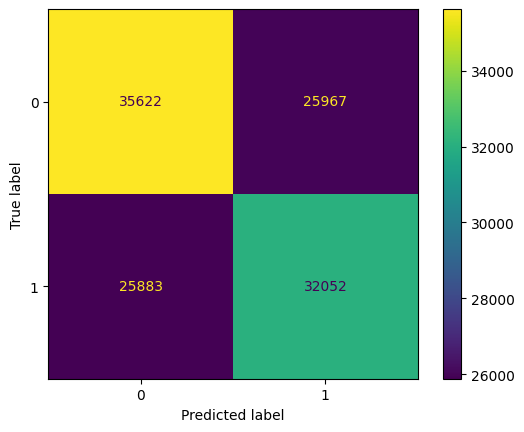

In [ ]:
from sklearn import metrics
confusion_matrix = metrics.confusion_matrix(y_1, y_pred_1)

cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [0, 1])

import matplotlib.pyplot as plt
cm_display.plot()
plt.show()

In [ ]:
best_params =  {'C': 9.999999999999999e-05, 'max_iter': 100, 'penalty': 'l2', 'solver': 'liblinear','class_weight':'balanced'}


In [ ]:
cv = KFold(n_splits=10, random_state=100, shuffle=True)
final_model_2 = LogisticRegression(**best_params,random_state=100)

# evaluate model
recall_scores = cross_val_score(final_model_2, X_1, y_1, scoring='recall', cv=cv, n_jobs=-1)
accuracy_scores = cross_val_score(final_model_2, X_1, y_1, scoring='accuracy', cv=cv, n_jobs=-1)
precision_scores = cross_val_score(final_model_2, X_1, y_1, scoring='precision', cv=cv, n_jobs=-1)


# report performance
print('accuracy: %.3f (%.3f)' % (mean(accuracy_scores), std(accuracy_scores)))
print('recall: %.3f (%.3f)' % (mean(recall_scores), std(recall_scores)))
print('precision: %.3f (%.3f)' % (mean(precision_scores), std(precision_scores)))

accuracy: 0.517 (0.005)
recall: 0.615 (0.010)
precision: 0.502 (0.007)


### threshold setting

In [ ]:
import numpy as np
from sklearn.metrics import precision_score

# Consider a series of threshold values
thresholds = np.arange(0.05, 1.0, 0.05)
best_threshold = 0.0
best_precision = 0.0

# Find the best threshold when the precision is maximized
for threshold in thresholds:
    predicted_labels = (y_pred_1 >= threshold).astype(int)
    precision = precision_score(y_true=y_1, y_pred=predicted_labels)
    if precision > best_precision:
        best_threshold = threshold
        best_precision = precision

print(f"Best threshold: {best_threshold:.2f}")
print(f"Best precision: {best_precision:.2f}")

Best threshold: 0.05
Best precision: 0.55


In [ ]:
import numpy as np
from sklearn.metrics import recall_score

# Consider a series of threshold values
thresholds = np.arange(0.05, 1.0, 0.05)
best_threshold = 0.0
best_recall = 0.0

# Find the best threshold when the recall is maximized
for threshold in thresholds:
    predicted_labels = (y_pred_1 >= threshold).astype(int)
    recall = recall_score(y_true=y_1, y_pred=predicted_labels)
    if recall > best_recall:
        best_threshold = threshold
        best_recall = recall

print(f"Best threshold: {best_threshold:.2f}")
print(f"Best recall: {best_recall:.2f}")

In [ ]:
plot_roc_curve(y_1, y_pred_1)
print(f'model 1 AUC score: {roc_auc_score(y_1, y_pred_1)}')

# BERTopic + LR

In [ ]:
#categorical data: rating, rented_for_enc, category_enc,body_type_enc, (fit_fit),fit_large,fit_large

#frequency encoding

df_rr_merged['rented_for_enc'] = df_rr_merged.groupby('rented for')['rented for'].transform('count') / len(df_rr_merged)
df_rr_merged['category_enc'] = df_rr_merged.groupby('category')['category'].transform('count') / len(df_rr_merged)
df_rr_merged['body_type_enc'] = df_rr_merged.groupby('body type')['body type'].transform('count')/ len(df_rr_merged)
df_rr_merged['rating_enc'] = df_rr_merged.groupby('rating')['rating'].transform('count')/ len(df_rr_merged)
df_rr_merged['bra_cup_enc'] = df_rr_merged.groupby('bra_cup')['bra_cup'].transform('count')/ len(df_rr_merged)
df_rr_merged['bust_enc'] = df_rr_merged.groupby('bust_measurement')['bust_measurement'].transform('count')/ len(df_rr_merged)

#one-hot encoding
#category columns: fit,rented for, body type, category
df_rr_merged = pd.get_dummies(df_rr_merged,columns=['fit'],drop_first=True,dtype=int)
df_rr_merged = pd.get_dummies(df_rr_merged,columns=['height(ft)'],drop_first=True,dtype=int)

KeyError: "None of [Index(['fit'], dtype='object')] are in the [columns]"

In [ ]:
df_rr_merged['size_enc'] = df_rr_merged.groupby('size')['size'].transform('count')/ len(df_rr_merged)


In [ ]:
df_rr_merged['topic'].value_counts()

,count
topic,
0,116157
1,1462
2,1157
3,748


topic -1: outlier


topic 0: wedding rentals

topic 1: small size issues

topic_2 jumpsuit rentals

topic_3: complimentary rompers for parties and social events

topic_4: zipper issues

In [ ]:
import pandas
from sklearn import linear_model
from sklearn.preprocessing import StandardScaler
scale = StandardScaler()

df_rr_merged['weight_scaled'] = scale.fit_transform(df_rr_merged[['weight(lbs)']])
df_rr_merged['age_scaled'] = scale.fit_transform(df_rr_merged[['age']])

In [ ]:
#replace the topic indexes as names
df_rr_merged.columns

Index(['user_id', 'bust size', 'item_id', 'weight(lbs)', 'rating',
       'rented for', 'review_text', 'body type', 'review_summary', 'category',
       'height', 'size', 'age', 'review_date', 'unique_id', 'bust_measurement',
       'bra_cup', 'bust_ms_new', 'height(inch)', 'retention_time',
       'last_review_date', 'churn_result', 'review_length',
       'review_text_lower', 'review_tokens', 'topic', 'rented_for_enc',
       'category_enc', 'body_type_enc', 'rating_enc', 'bra_cup_enc',
       'bust_enc', 'fit_large', 'fit_small', 'height(ft)_5', 'height(ft)_6',
       'size_enc', 'weight_scaled', 'age_scaled'],
      dtype='object')

In [ ]:
#frequency encoding of the Bertopics #delete this

df_rr_merged['topic_enc'] = df_rr_merged.groupby('topic')['topic'].transform('count')/ len(df_rr_merged)


In [ ]:
#one-hot-encoding for the topic since there is only 4

df_rr_merged = pd.get_dummies(df_rr_merged,columns=['topic'],drop_first=True,dtype=int)

In [ ]:
df_rr_merged.columns

Index(['user_id', 'bust size', 'item_id', 'weight(lbs)', 'rating',
       'rented for', 'review_text', 'body type', 'review_summary', 'category',
       'height', 'size', 'age', 'review_date', 'unique_id', 'bust_measurement',
       'bra_cup', 'bust_ms_new', 'height(inch)', 'retention_time',
       'last_review_date', 'churn_result', 'review_length',
       'review_text_lower', 'review_tokens', 'rented_for_enc', 'category_enc',
       'body_type_enc', 'rating_enc', 'bra_cup_enc', 'bust_enc', 'fit_large',
       'fit_small', 'height(ft)_5', 'height(ft)_6', 'size_enc',
       'weight_scaled', 'age_scaled', 'visual_trust_gap',
       'positive_outfit_styling', 'fit_issues', 'smell_issues',
       'complimentary_fit', 'zipper_issues', 'topic_enc', 'topic_0', 'topic_1',
       'topic_2', 'topic_3'],
      dtype='object')

In [ ]:
df_rr_merged['topic']

,topic
0,0
1,0
2,0
3,0
4,0
...,...
119519,0
119520,0
119521,0
119522,0


In [ ]:
lr_df_bert = df_rr_merged[['size_enc','bust_enc','bra_cup_enc','rating_enc','body_type_enc','category_enc','fit_large','fit_small','rented_for_enc','weight_scaled','age_scaled','churn_result','topic_0','topic_1','topic_2','topic_3']]
len(lr_df_bert.columns)
X_bert = lr_df_bert.drop('churn_result',axis=1)
y_bert= lr_df_bert['churn_result']

16

need to address the class imbalance given that this is a churn prediction model where churning will be less than not churning

In [ ]:

# instantiate the model (using the default parameters)
from sklearn.linear_model import LogisticRegression
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold

from numpy import mean
from numpy import std

weights = {0:1,1:1.5} #weight 10 for class 1 (churned customers)
#5-fold cross validation
cv = KFold(n_splits=10, random_state=100, shuffle=True)
logreg_model = LogisticRegression(random_state=100,class_weight='balanced')
# evaluate model
scores = cross_val_score(logreg_model, X_bert, y_bert, scoring='accuracy', cv=cv, n_jobs=-1)
# report performance
print('Accuracy: %.3f (%.3f)' % (mean(scores), std(scores)))

Accuracy: 0.566 (0.004)


In [ ]:
from sklearn.model_selection import RepeatedKFold, cross_val_predict
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix, classification_report


# Get cross-validated predictions (predicted labels)
y_pred = cross_val_predict(logreg_model, X_bert, y_bert, cv=cv, n_jobs=-1)

# Now calculate all required metrics
accuracy = accuracy_score(y_bert, y_pred)
precision = precision_score(y_bert, y_pred)
recall = recall_score(y_bert, y_pred)
conf_matrix = confusion_matrix(y_bert, y_pred)

# Print results
print(f"Accuracy:  {accuracy:.3f}")
print(f"Precision: {precision:.3f}")
print(f"Recall:    {recall:.3f}")
print("\nConfusion Matrix:")
print(conf_matrix)

# Optional: full report
print("\nClassification Report:")
print(classification_report(y_bert, y_pred))

Accuracy:  0.566
Precision: 0.552
Recall:    0.551

Confusion Matrix:
[[35729 25860]
 [26040 31895]]

Classification Report:
              precision    recall  f1-score   support

           0       0.58      0.58      0.58     61589
           1       0.55      0.55      0.55     57935

    accuracy                           0.57    119524
   macro avg       0.57      0.57      0.57    119524
weighted avg       0.57      0.57      0.57    119524



In [ ]:
from sklearn.linear_model import LogisticRegression

# Instantiate and fit final model on all available data
final_model_3 = LogisticRegression(max_iter=1000, random_state=100)
final_model.fit(X_bert, y_bert)
# Get feature names
feature_names = X_new.columns

# Get coefficients and intercept
coefficients = final_model.coef_[0]
intercept = final_model.intercept_[0]

# Print the formula
formula = f"logit(p) = {intercept:.4f}"
for name, coef in zip(feature_names, coefficients):
    formula += f" + ({coef:.4f} × {name})"

print("Logistic Regression Formula:")
print(formula)
#weight and age seems to have a minimal impact; may forego these two variables as well as no difference in accuracy, precision and recall (but need check this again)

Logistic Regression Formula:
logit(p) = -0.7677 + (-0.8475 × size_enc) + (0.0672 × bust_enc) + (0.7197 × bra_cup_enc) + (-0.0195 × rating_enc) + (-0.1663 × body_type_enc) + (0.1862 × category_enc) + (-0.0410 × fit_large) + (-0.0451 × fit_small) + (3.5807 × rented_for_enc) + (-0.0077 × weight_scaled) + (-0.0038 × age_scaled)


In [ ]:
best_params =  {'C': 9.999999999999999e-05, 'max_iter': 100, 'penalty': 'l2', 'solver': 'liblinear','class_weight':'balanced'}


In [ ]:
cv = KFold(n_splits=10, random_state=100, shuffle=True)
final_model_3= LogisticRegression(**best_params,random_state=100)

# evaluate model
recall_scores = cross_val_score(final_model_3, X_bert, y_bert, scoring='recall', cv=cv, n_jobs=-1)
accuracy_scores = cross_val_score(final_model_3, X_bert, y_bert, scoring='accuracy', cv=cv, n_jobs=-1)
precision_scores = cross_val_score(final_model_3, X_bert, y_bert, scoring='precision', cv=cv, n_jobs=-1)


# report performance
print('accuracy: %.3f (%.3f)' % (mean(accuracy_scores), std(accuracy_scores)))
print('recall: %.3f (%.3f)' % (mean(recall_scores), std(recall_scores)))
print('precision: %.3f (%.3f)' % (mean(precision_scores), std(precision_scores)))

accuracy: 0.517 (0.005)
recall: 0.628 (0.009)
precision: 0.501 (0.006)


In [ ]:
# Make sure we use the correct column names from X_bert
feature_names = X_bert.columns.tolist()

# Train final model
final_model_3.fit(X_bert, y_bert)

# Get coefficients and intercept
intercept = final_model_3.intercept_[0]
coefficients = final_model_3.coef_[0]

# Build formula
formula = f"logit(p) = {intercept:.4f}"
for feature, coef in zip(feature_names, coefficients):
    formula += f" + ({coef:.4f} * {feature})"

print("\nLogistic Regression Formula:")
print(formula)



Logistic Regression Formula:
logit(p) = -0.0109 + (-0.0131 * size_enc) + (-0.0013 * bust_enc) + (0.0176 * bra_cup_enc) + (0.0003 * rating_enc) + (-0.0062 * body_type_enc) + (0.0283 * category_enc) + (-0.0201 * fit_large) + (-0.0046 * fit_small) + (0.0447 * rented_for_enc) + (0.0130 * weight_scaled) + (-0.0204 * age_scaled) + (0.0011 * topic_0) + (-0.0041 * topic_1) + (-0.0039 * topic_2) + (0.0003 * topic_3)


In [ ]:
import pandas as pd
import statsmodels.api as sm

# Use the same X_bert and y_bert
X_with_const = sm.add_constant(X_bert)  # Add intercept term

# Fit logistic regression with statsmodels
logit_model = sm.Logit(y_bert, X_with_const)
result = logit_model.fit()

# Summary includes coefficients, p-values, and odds ratios
print(result.summary())

# Create a dataframe with odds ratios & significance
params = result.params
pvalues = result.pvalues
odds_ratios = params.apply(lambda x: np.exp(x))

coef_df = pd.DataFrame({
    'Feature': params.index,
    'Coefficient': params.values,
    'Odds_Ratio': odds_ratios,
    'P_Value': pvalues
})

# Sort by absolute coefficient magnitude
coef_df = coef_df.sort_values(by='Coefficient', key=abs, ascending=False)
print("\nLogistic Regression Coefficients with P-values:")
print(coef_df)


Optimization terminated successfully.
         Current function value: 0.684006
         Iterations 4
                           Logit Regression Results                           
Dep. Variable:           churn_result   No. Observations:               119524
Model:                          Logit   Df Residuals:                   119508
Method:                           MLE   Df Model:                           15
Date:                Mon, 11 Aug 2025   Pseudo R-squ.:                 0.01252
Time:                        21:16:41   Log-Likelihood:                -81755.
converged:                       True   LL-Null:                       -82792.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -0.9668      0.084    -11.568      0.000      -1.131      -0.803
size_enc         

# Reference

Berlyne, D. (2024). Amazon Topic Modelling with BERTopic. [online] Kaggle.com. Available at: https://www.kaggle.com/code/danberlyne/amazon-topic-modelling-with-bertopic#2.-Topic-modelling (Accessed: 1 July 2025).

Briggs, J. (2023). BERTopic: The Future of Topic Modeling. [online] Pinecone. Available at: https://www.pinecone.io/learn/bertopic/ (Accessed: 2 July 2025).

Dutta, N. (2021). Topic Modelling With LDA -A Hands-on Introduction. [online] Analytics Vidhya. Available at: https://www.analyticsvidhya.com/blog/2021/07/topic-modelling-with-lda-a-hands-on-introduction/.
(Accessed: 18 June 2025).

Gong, D. (2025). A Practical Guide to BERTopic for Transformer-Based Topic Modeling | Towards Data Science. [online] Towards Data Science. Available at: https://towardsdatascience.com/a-practical-guide-to-bertopic-for-transformer-based-topic-modeling/ (Accessed: 3 July 2025).


Grootendorst, M.P. (2024). Tips & Tricks - BERTopic. [online] Github.io. Available at: https://maartengr.github.io/BERTopic/getting_started/tips_and_tricks/tips_and_tricks (Accessed: 25 August 2025).


Hassan, M.H. (2023). Using Grid Search For Hyper-Parameter Tuning. [online] Medium. Available at: https://medium.com/@hammad.ai/using-grid-search-for-hyper-parameter-tuning-bad6756324cc (Accessed: 28 June 2025).

Kapadia, S. (2019a). Evaluate Topic Models: Latent Dirichlet Allocation (LDA) | Towards Data Science. [online] Towards Data Science. Available at: https://towardsdatascience.com/evaluate-topic-model-in-python-latent-dirichlet-allocation-lda-7d57484bb5d0/ (Accessed: 19 June 2025).


Kapadia, S. (2019b). Topic Modeling in Python: Latent Dirichlet Allocation (LDA) | Towards Data Science. [online] Towards Data Science. Available at: https://towardsdatascience.com/end-to-end-topic-modeling-in-python-latent-dirichlet-allocation-lda-35ce4ed6b3e0/. (Accessed: 17 June 2025).


Loeber, P. (2020). LDA (Linear Discriminant Analysis) In Python - ML From Scratch 14 - Python Engineer. [online] Python-engineer.com. Available at: https://www.python-engineer.com/courses/mlfromscratch/14-lda/ (Accessed 25 June. 2025).


Mooney, T. (2023). Evaluating a BERTopic model based on classification metrics. [online] Stack Overflow. Available at: https://stackoverflow.com/questions/76235208/evaluating-a-bertopic-model-based-on-classification-metrics(Accessed:  10 July 2025).


Prabhakaran, S. (2018). LDA - How to grid search best topic models? (with examples in python). [online] Machine Learning Plus. Available at: https://www.machinelearningplus.com/nlp/topic-modeling-python-sklearn-examples/ (Accessed: 23 June 2025).


Shahid, N. (2023). A Step-by-Step Guide to Writing an LDA Program in Python. [online] Medium. Available at: https://nauman-shahid.medium.com/a-step-by-step-guide-to-writing-an-lda-program-in-python-690aa99119ea (Accessed: 16 June, 2025).


Stack Overflow (2019). Filter data frame based on index value in Python. [online] Stack Overflow. Available at: https://stackoverflow.com/questions/53482760/filter-data-frame-based-on-index-value-in-python (Accessed: 10 June, 2025).


Train, D.T. (2022). LDA and Topic Coherence Score. [online] kaggle.com. Available at: https://www.kaggle.com/code/trnduythanhkhttt/lda-and-topic-coherence-score.UMAP (Accessed: 20 June, 2025).


Basic UMAP Parameters (n.d). — umap 0.5 documentation. [online] umap-learn.readthedocs.io. Available at: https://umap-learn.readthedocs.io/en/latest/parameters.html (Accessed: 12 July, 2025).


